In [41]:
import sys
import numpy as np
ln = np.log
import analyze_helper as anh
import importlib
importlib.reload(anh)
from glob import glob
import matplotlib.pyplot as plt
from collections import defaultdict
import json
import pandas as pd
from functools import partial
import numpy.ma as npma
import scipy.optimize
import itertools as it
import collections
import matplotlib.colors
import scipy.stats
import pickle
import os
import sklearn
import sklearn.linear_model

successfully loaded /home/julian/puhtidata/analysis/analyze_helper.py at 2022-02-25 12:03:22.320521


In [2]:
name2long_name = {
    "lmb" : r"$\lambda$",
    "re" : "Re",
    "urms": "Mach",
    "t_eta" : "$t_\eta$",
    "v" : "visc",
    "f" : "forcing_magnitude"
}

def name_to_long_name(name):
    if name in name2long_name:
        return name2long_name[name]
    else:
        return name

def beautify(name):
    
    name_parts_list = name.split("_")
    npl = name_parts_list
    
    if npl[-1] in ["max", "median", "min"]:
        
        return name_to_long_name("_".join(npl[:-1]))+r"$_{"+npl[-1]+"}$"
    
    else:
        return name_to_long_name("_".join(npl))
      


In [3]:
print(beautify("t_eta"))
print(beautify("t_eta_max"))
print(beautify("re_max"))

$t_\eta$
$t_\eta$$_{max}$
Re$_{max}$


In [4]:
load_from_file = True

In [5]:
###########
## load the data instead of recalculating
###########

if load_from_file:
    with open("all_singles.pl", "rb") as f:
        all_singles = pickle.load(f)

In [6]:
fitres_cache_file = "final_fitres.json"
imported_patterns = []
if not load_from_file:
    all_singles = []

In [7]:
#do_plot can be False for "never", True for "always" and None for "maybe"
def import_set(pattern,f=False, do_plot=None):
    global all_singles, imported_patterns
    if not f and pattern in imported_patterns:
        print(pattern, " already imported")
        return
    new = list((map(lambda s : anh.SingleSimul(s,fitres_cache_file, do_plot), sorted(anh.filter_successful(glob("data/"+pattern)+glob("data/analysis/"+pattern))))))
    print(len(new))
    #if len(new) == 0:
    #    raise ValueError("no simuls in set ", pattern)
    all_singles.extend(new)
    print("imported ", len(new), " dirs for ", pattern)
    imported_patterns.append(pattern)

In [8]:
# bad simuls are:
#import_set("X_var_hel-force_99-12-1098", True, True)
#import_set("X_var_hel-force_99-12-93", True, True)
#import_set("X_var_hel-force_99-12-94", True, True)
#import_set("other_const_mach_simuls-20", True, True)
print("commenting out worked in time")

commenting out worked in time


In [9]:
# cancel the upper limit for time -> done
# make errors RELATIVE -> done 
# exclude high errors -> include as data column instead

if not load_from_file:

    import_set("hel_one*")
    #import_set("hel_one_high_re_proper_dsxy-*")
    #import_set("hel_one_high_re_proper_dsxy_rerun-*")
    #import_set("hel_one_grid_sampling-*")
    #import_set("hel_one_grid_sampling_new-*")
    #import_set("hel_one_medium_re-*")
    #import_set("hel_one_high_re-*")
    
    import_set("hel_zero*")

    import_set("hel_some_low_re-*")
    import_set("hel_some_medium_re-*")
    import_set("hel_some_high_re-*")

    import_set("high_re_proper_dsxy-*")
    import_set("low_Re_sampling-*")
    import_set("A_correct_hel_*")
    import_set("X_var_hel-force*")
    import_set("var_hel-force*")
    import_set("A_var_hel_*-*")
    import_set("more_zero_hel_mid_Re-*-*")
    import_set("more_zhel_midhigh_Re-*-*")
    import_set("more_zhel_midlow_Re-*-*")
    import_set("more_zhel_somewhere_Re-*-*")
    import_set("low_force*")
    import_set("mass_simuls_helzero*")
    import_set("const_mach_simuls*")
    import_set("other_const_mach_simuls-*")
    import_set("more_const_mach_simuls-*")



In [10]:
print(len(all_singles))

68359


In [11]:
if not load_from_file:
    tstats = anh.get_timestep_stats()
    print(tstats)
    plot_data = tstats.arr
    n,bins,patches = plt.hist(plot_data,bins=300)
    print(bins[:5])
    print(n[:5])
    print(patches[:5])
    plt.vlines(1.0, 0, max(n) )
    plt.show()
else:
    print("not useful if not loaded from file")

not useful if not loaded from file


In [12]:
###############
# put back into file
###############


if not load_from_file:
    with open("all_singles.pl", "wb") as f:
        pickle.dump(all_singles, f)

In [13]:
import subprocess
subprocess.check_output(["ls", "-l", "all_singles.pl"])

b'-rw-r--r--. 1 julian julian 264008832 Feb  6 10:40 all_singles.pl\n'

In [14]:
#################################
## DEFINE DATAFRAMES ############
#################################

# create rows
rows = []
columns = ["re", "urms", "t_eta", "hel", "v", "f", "lmb", "dt", "nx", "dx", "fit_err", "eta", "u_eta","kolmo_difft","end_time","g1","g10","g20","g50","gfin"]
quants = ["mean", "median", "min", "max", "std", "q25", "q75"]
for s in all_singles:
    dx = anh.return_if_equal([s.opts["dsx"],s.opts["dsy"],s.opts["dsz"]])
    # Kolmogorov calculation only here, not inside 
    eps = s.opts["forcing_magnitude"]*s.urms
    kolmo_len = (s.opts["viscosity"]**3 / eps)**(1/4)
    kolmo_time = (s.opts["viscosity"]/eps)**(1/2)
    kolmo_velo = (s.opts["viscosity"]*eps)**(1/4)
    kolmo_difft = (kolmo_len)**2/s.opts["viscosity"] # time it takes to diffuse over one kolmogorov length
    rows.append([s.Re, s.urms, kolmo_time, s.opts["relhel"], s.opts["viscosity"], s.opts["forcing_magnitude"], ln(s.fitres.a)*kolmo_time, s.avg_dt, s.opts["nx"], dx, s.fitres.worst_point_err, kolmo_len, kolmo_velo, kolmo_difft, s.end_time, s.g1, s.g10, s.g20, s.g50, s.gfin])

singles_df = pd.DataFrame(rows, columns=columns)  
df = singles_df

In [15]:
###BASIC FILTERING###
print("unfiltered:", len(df))
print("g20-fail:", len(df.loc[df.g20 <= 1]))
print("gfin-fail:", len(df.loc[df.gfin <= 1]))
print("fail at least one:", len(df.loc[(df.gfin <= 1) | (df.g20 <= 1)]))
df = df.loc[(df.g20>1) & (df.gfin>1)]
print("filtered:", len(df))

unfiltered: 68359
g20-fail: 9860
gfin-fail: 12885
fail at least one: 12948
filtered: 55411


In [16]:
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self
        
def subset_data(*conds):
    
    final_cond = conds[0][0].copy()
    final_desc = conds[0][1]
    for c, d in conds[1:]:
        final_cond &= c.copy()
        final_desc += " and " + d
    
    
    local_df = df.copy()
    filtered = local_df.loc[final_cond]
    filtered = filtered.groupby(["v","f","hel"], as_index=False)
    filtered.q25 = lambda : filtered.quantile(q=0.25)
    filtered.q75 = lambda : filtered.quantile(q=0.75)
    
    def make_key(c,q):
        if q=="mean":
            return c
        return c+"_"+q
    # this is inefficient as hell: it calculates the descriptive statistic for every value many times.
    res = {make_key(c,q) : eval(f"filtered.{q}()", {"filtered":filtered})[c].to_numpy() for q,c in it.product(quants,columns)}
    res["weights"] = filtered.size()["size"].to_numpy()
    res["simul_count"] = np.sum(res["weights"])
    res["desc"] = final_desc
    
    res = AttrDict(res)
    print("created subset <<", res.desc, ">> with ", len(res.re), " datapoints")
    return res

### some conditions
    
hel_zero = df["hel"] == 0.0, "hel=0.0"
hel_some = df["hel"] == 0.3, "hel=0.3"
hel_one = df["hel"].isin([1.0,0.99]), "hel=1.0"

nx_128 = df["nx"] == 128, "nx=128"
nx_256 = df["nx"] == 256, "nx=256"

err1 = df["fit_err"] < 0.01, "err<1%"
err2 = df["fit_err"] < 0.02, "err<2%"
err5 = df["fit_err"] < 0.05, "err<5%"

low_visc = df["v"] < df["f"]/20 , "low_visc"
high_visc = df["v"] >= df["f"]/20, "high_visc"

al = np.full(len(df),True) , "all data"

re_points = list(range(10,250,15))
re_brackets = zip(re_points[0:-1], re_points[1:])
re_conds = {(min_re, max_re): ((df["re"] >= min_re) & (df["re"] < max_re), f"{min_re}<=Re<{max_re}") for min_re, max_re in re_brackets}

h1 = subset_data(hel_one, err2)
h0 = subset_data(hel_zero, err2)
h1hv = subset_data(hel_one, high_visc)
h1lv = subset_data(hel_one, low_visc, err5)
all_data = subset_data(al)

created subset << hel=1.0 and err<2% >> with  807  datapoints
created subset << hel=0.0 and err<2% >> with  703  datapoints
created subset << hel=1.0 and high_visc >> with  226  datapoints
created subset << hel=1.0 and low_visc and err<5% >> with  626  datapoints
created subset << all data >> with  2054  datapoints


In [17]:
mapped_chars = {"<": "lt", "=":"eq", ">":"gt", ".":"p", "-":"_", "\\" : "", "$":"", "/" : "", "_":"_",
                "%":"perc", "\n": "", ":": "_"}
save_dir = "/home/julian/BAoffline/img/"
def make_alphanumeric(title):
    newtitle = []
    for c in title:
        if c.isalnum():
            newtitle.append(c)
        elif c.strip() == "":
            newtitle.append("_")
        elif c in mapped_chars:
            newtitle.append(mapped_chars[c])
        else:
            print("Cant handle character: \""+c+"\"")
    return "".join(newtitle)
            
    
def fin(title, savename):
    plt.title(title)
    real_save = save_dir+make_alphanumeric(savename)+".png"
    plt.savefig(real_save,bbox_inches="tight")
    plt.show()
    print(f"========\nsaved {title} to {real_save}\n======\n\n")

created subset << all data >> with  2054  datapoints


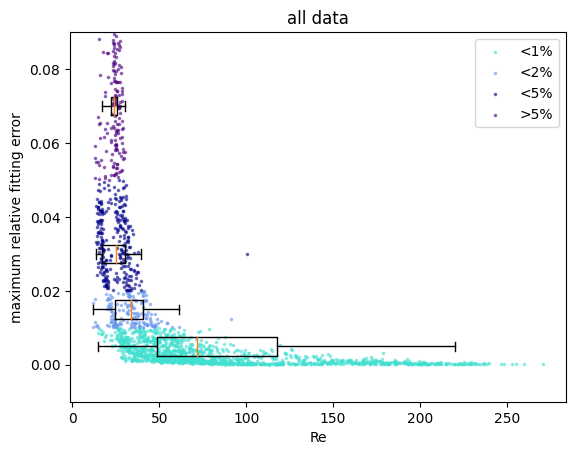

saved all data to /home/julian/BAoffline/img/all_data_re_1Dfiterr.png


created subset << hel=0.0 >> with  728  datapoints


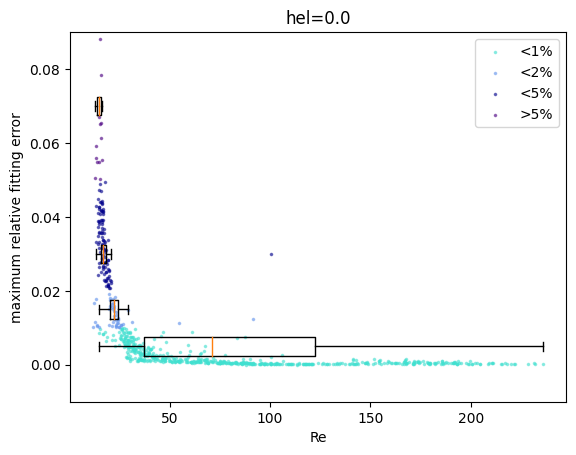

saved hel=0.0 to /home/julian/BAoffline/img/heleq0p0_re_1Dfiterr.png


created subset << hel=1.0 >> with  852  datapoints


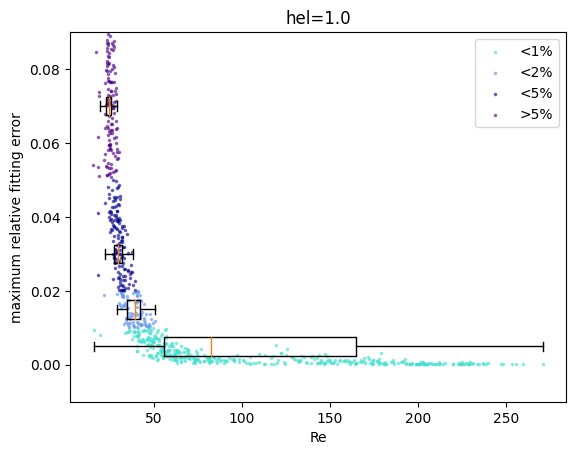

saved hel=1.0 to /home/julian/BAoffline/img/heleq1p0_re_1Dfiterr.png




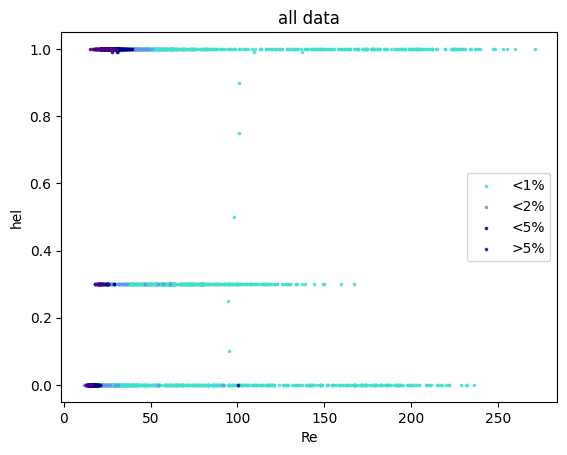

saved all data to /home/julian/BAoffline/img/all_data_re_hel_2Dfiterr.png




In [18]:
# selection biases?

def filt_err(err):
    
    e1 = err < 0.01
    e2 = err < 0.02
    e5 = err < 0.05
    
    return e1, np.logical_and(~e1,e2), np.logical_and(~e2,e5), ~e5

err_mid_points = [0.005,0.015, 0.03, 0.07]
err_colors = ["turquoise", "cornflowerblue", "darkblue", "indigo"]
err_names  = ["<1%", "<2%", "<5%", ">5%"]

def map_1D_to_fiterr(ss, obs):
    
    err_classes = filt_err(ss.fit_err)
    
    boxplotwidths = min(0.005,(max(ss.fit_err)-min(ss.fit_err))/15)
    for filt, color, name, mid_point in zip(err_classes, err_colors, err_names, err_mid_points):
        plt.scatter(ss[obs][filt], ss.fit_err[filt],marker=".",color=color,s=10,alpha=0.5,label=name)
        plt.boxplot(ss[obs][filt],positions=[mid_point],widths=boxplotwidths,vert=False,manage_ticks=False,showfliers=False)
    plt.xlabel(beautify(obs))
    plt.ylabel("maximum relative fitting error")
    plt.ylim(-0.01,0.09)
    plt.legend()
    fin(ss.desc, f"{ss.desc}_{obs}_1Dfiterr")

def map_2D_to_fiterr(ss,obs1,obs2):
    
    if (obs1==obs2):
        return map_1D_to_fiterr(ss,obs1)
    
    err_classes = filt_err(ss.fit_err)
    for filt, color, name in zip(err_classes, err_colors, err_names):
        plt.scatter(ss[obs1][filt],ss[obs2][filt],marker=".",s=10,alpha=0.8,c=color,label=name)
    plt.xlabel(beautify(obs1))
    plt.ylabel(beautify(obs2))
    plt.legend()
    fin(ss.desc, f"{ss.desc}_{obs1}_{obs2}_2Dfiterr")

map_1D_to_fiterr(subset_data(al), "re")
map_1D_to_fiterr(subset_data(hel_zero), "re")
map_1D_to_fiterr(subset_data(hel_one), "re")
map_2D_to_fiterr(all_data, "re", "hel")

created subset << all data >> with  2054  datapoints
created subset << hel=1.0 >> with  852  datapoints
created subset << hel=0.0 >> with  728  datapoints


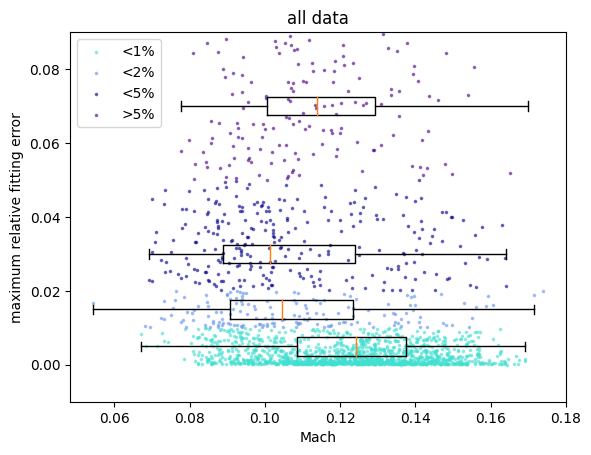

saved all data to /home/julian/BAoffline/img/all_data_urms_1Dfiterr.png




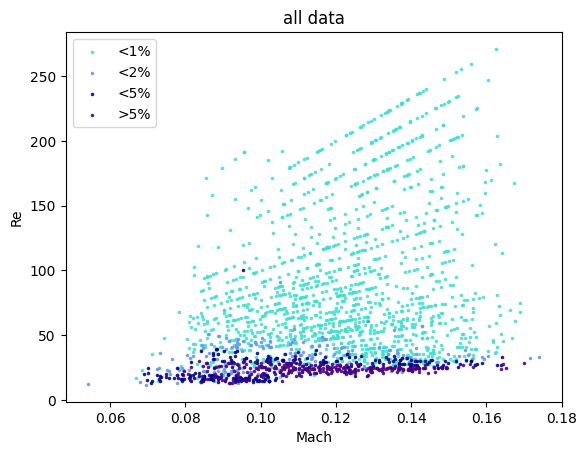

saved all data to /home/julian/BAoffline/img/all_data_urms_re_2Dfiterr.png




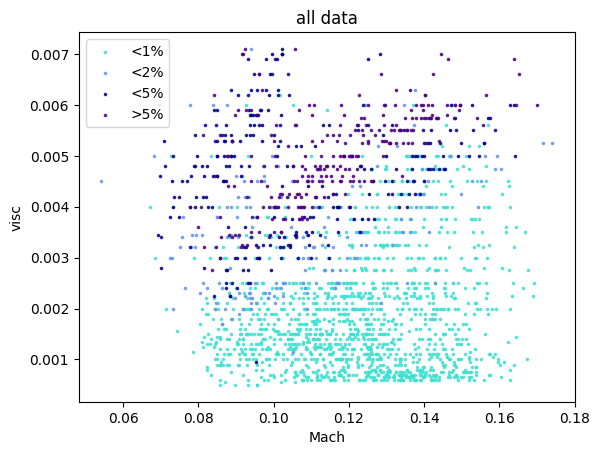

saved all data to /home/julian/BAoffline/img/all_data_urms_v_2Dfiterr.png




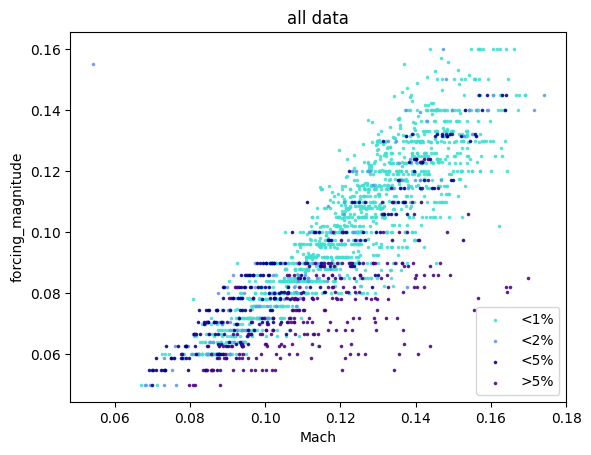

saved all data to /home/julian/BAoffline/img/all_data_urms_f_2Dfiterr.png




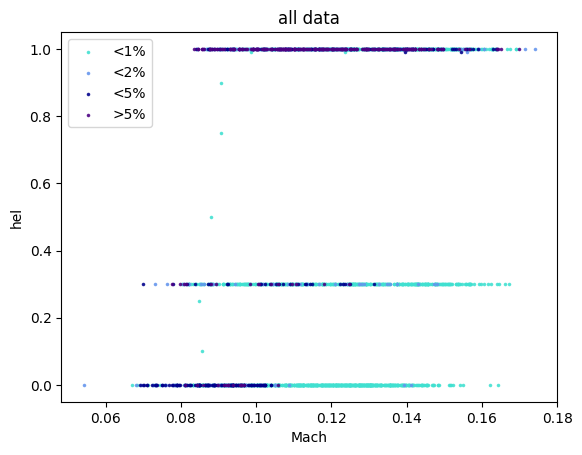

saved all data to /home/julian/BAoffline/img/all_data_urms_hel_2Dfiterr.png




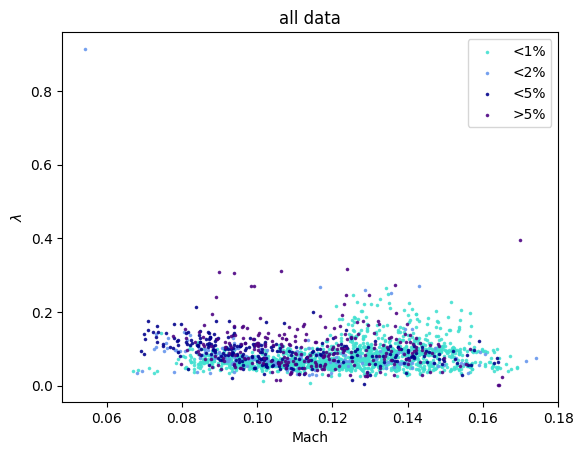

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_2Dfiterr.png




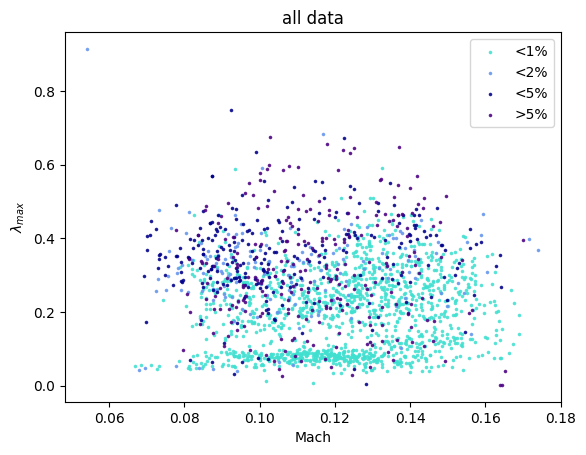

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_max_2Dfiterr.png




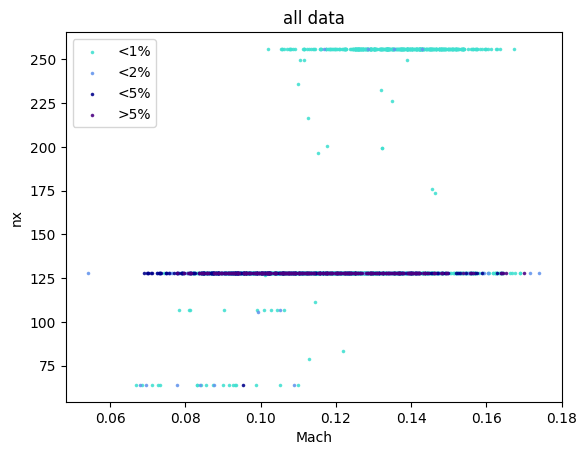

saved all data to /home/julian/BAoffline/img/all_data_urms_nx_2Dfiterr.png




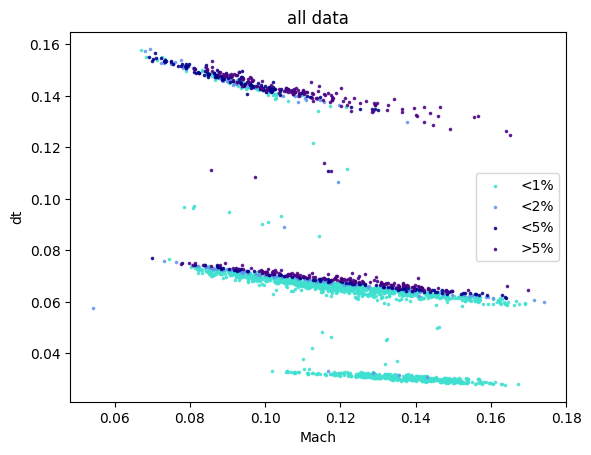

saved all data to /home/julian/BAoffline/img/all_data_urms_dt_2Dfiterr.png




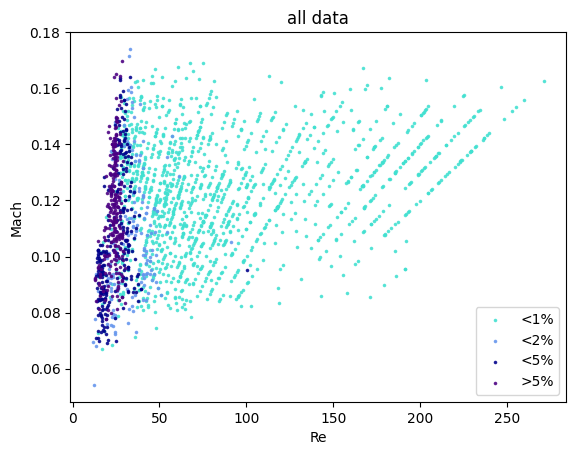

saved all data to /home/julian/BAoffline/img/all_data_re_urms_2Dfiterr.png




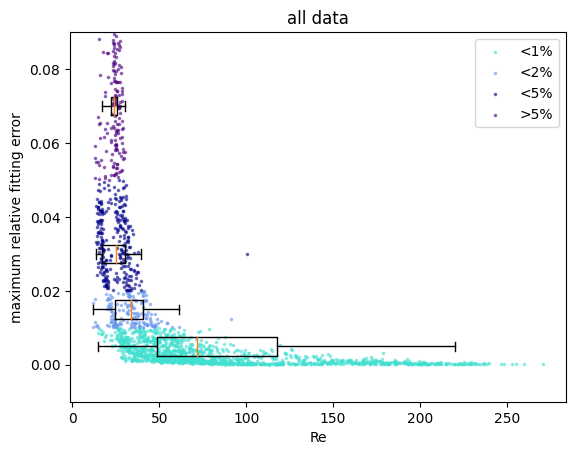

saved all data to /home/julian/BAoffline/img/all_data_re_1Dfiterr.png




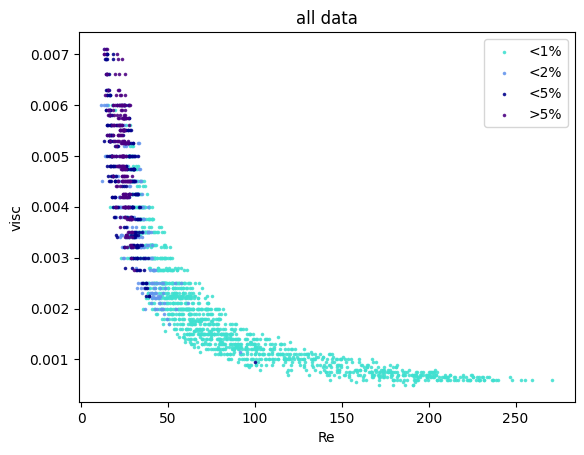

saved all data to /home/julian/BAoffline/img/all_data_re_v_2Dfiterr.png




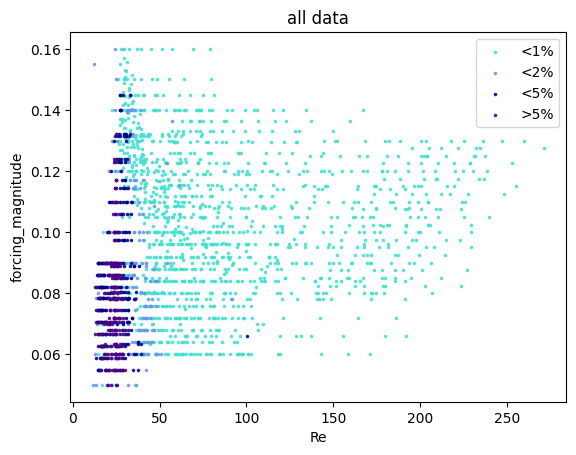

saved all data to /home/julian/BAoffline/img/all_data_re_f_2Dfiterr.png




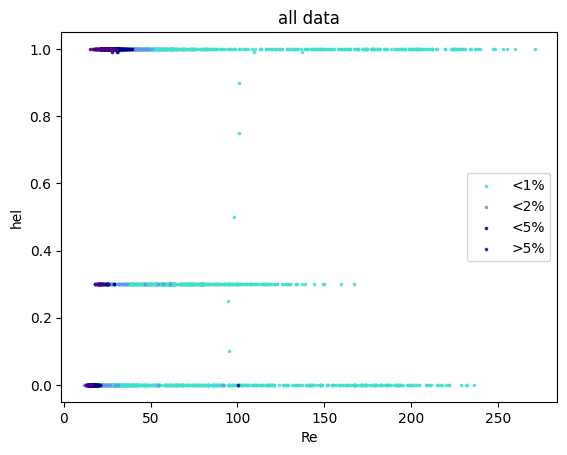

saved all data to /home/julian/BAoffline/img/all_data_re_hel_2Dfiterr.png




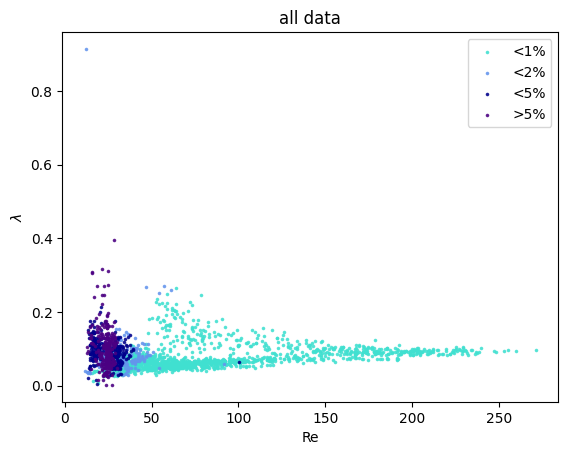

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_2Dfiterr.png




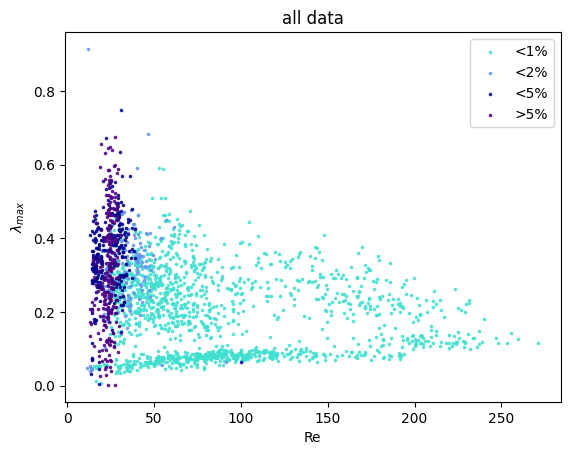

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_max_2Dfiterr.png




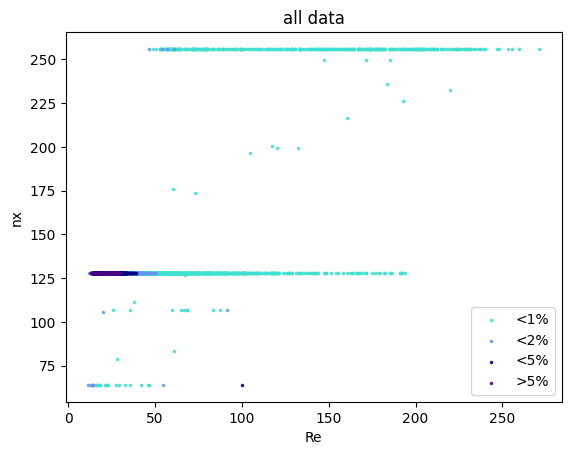

saved all data to /home/julian/BAoffline/img/all_data_re_nx_2Dfiterr.png




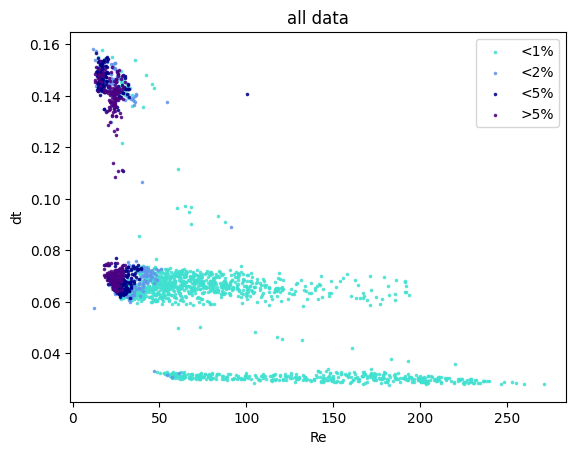

saved all data to /home/julian/BAoffline/img/all_data_re_dt_2Dfiterr.png




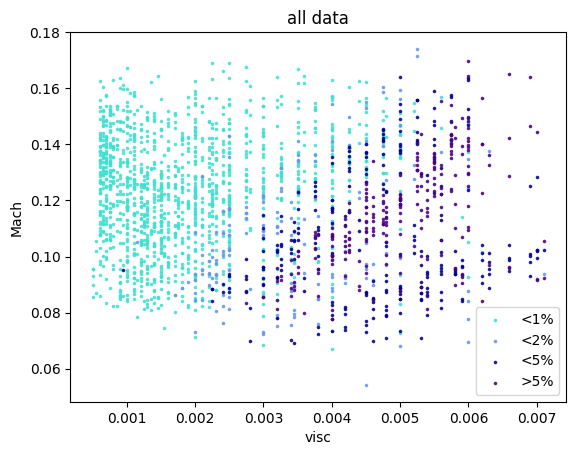

saved all data to /home/julian/BAoffline/img/all_data_v_urms_2Dfiterr.png




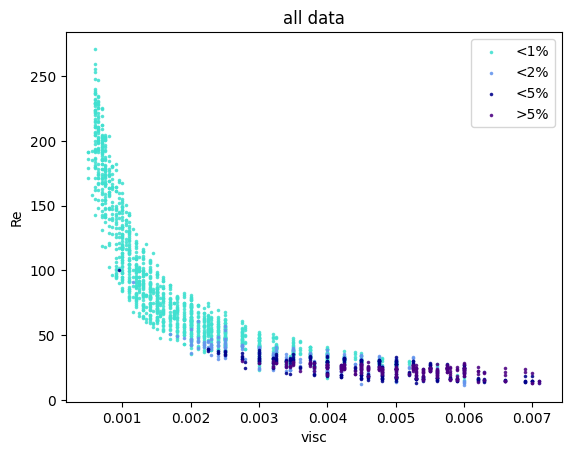

saved all data to /home/julian/BAoffline/img/all_data_v_re_2Dfiterr.png




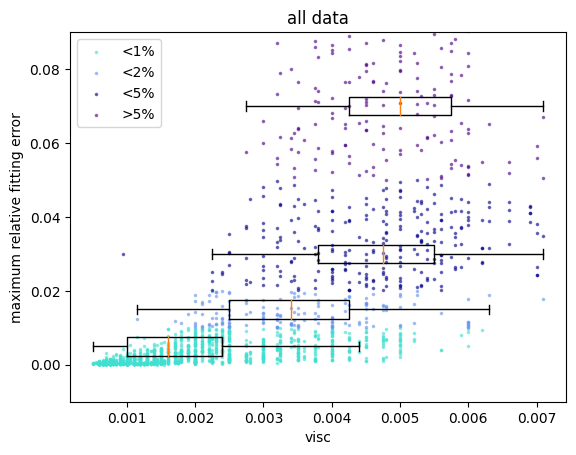

saved all data to /home/julian/BAoffline/img/all_data_v_1Dfiterr.png




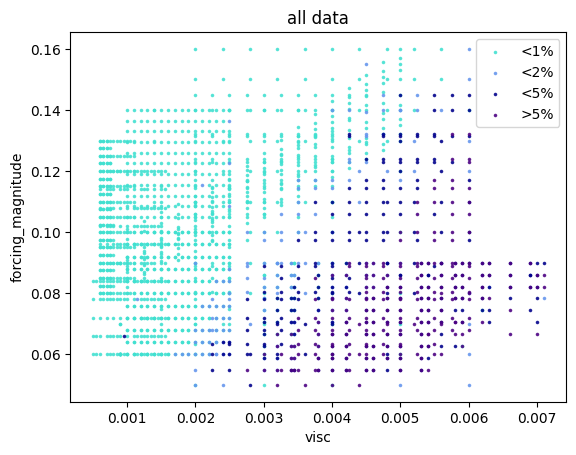

saved all data to /home/julian/BAoffline/img/all_data_v_f_2Dfiterr.png




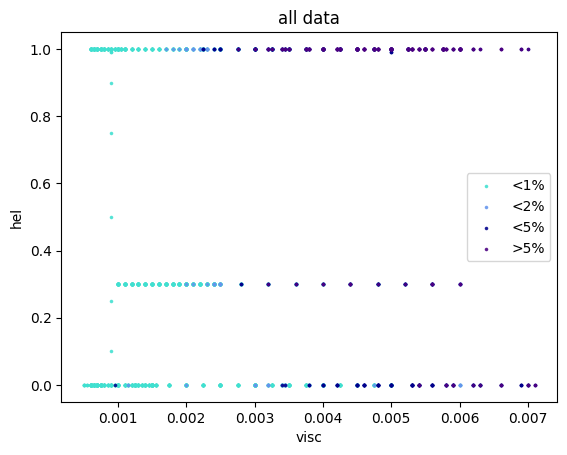

saved all data to /home/julian/BAoffline/img/all_data_v_hel_2Dfiterr.png




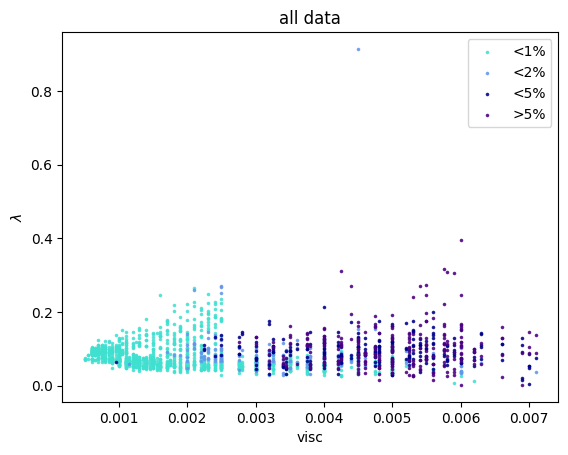

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_2Dfiterr.png




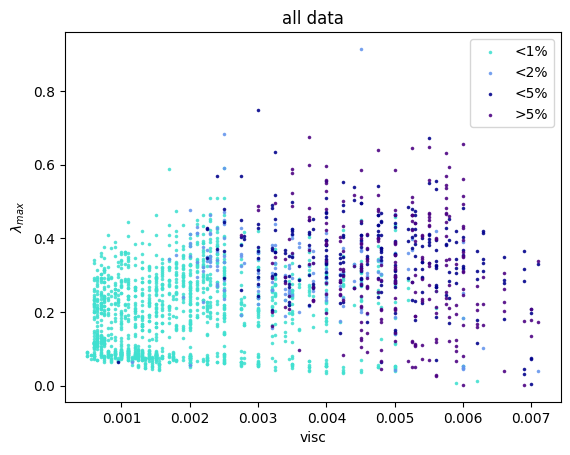

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_max_2Dfiterr.png




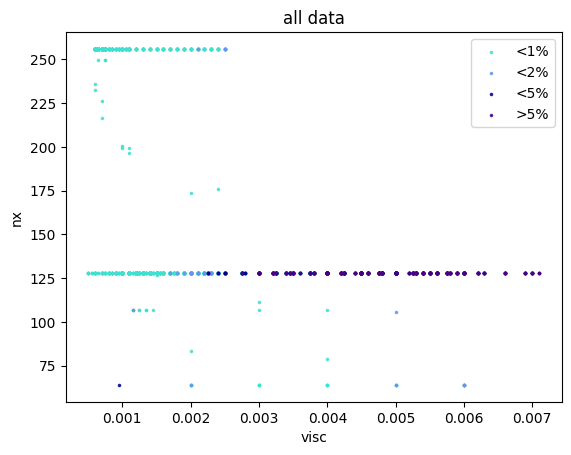

saved all data to /home/julian/BAoffline/img/all_data_v_nx_2Dfiterr.png




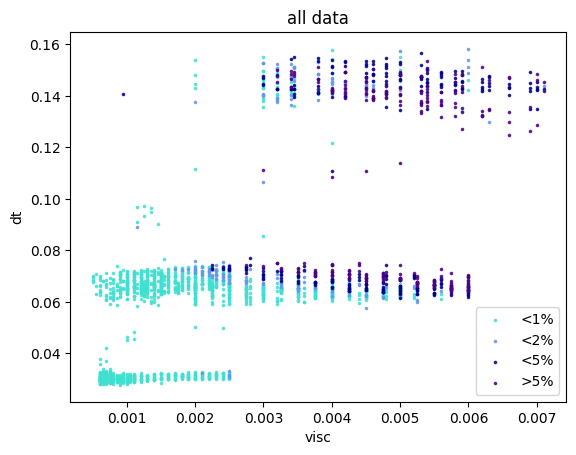

saved all data to /home/julian/BAoffline/img/all_data_v_dt_2Dfiterr.png




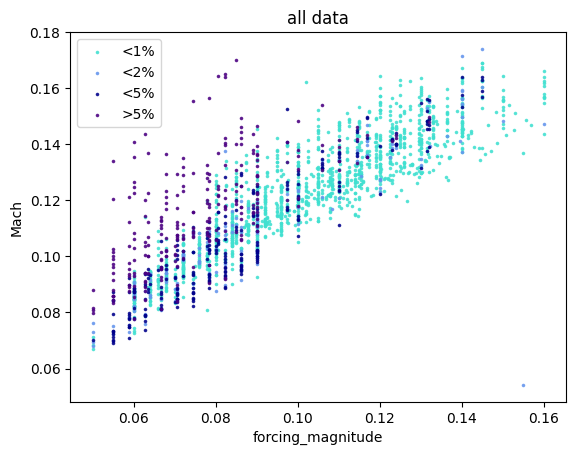

saved all data to /home/julian/BAoffline/img/all_data_f_urms_2Dfiterr.png




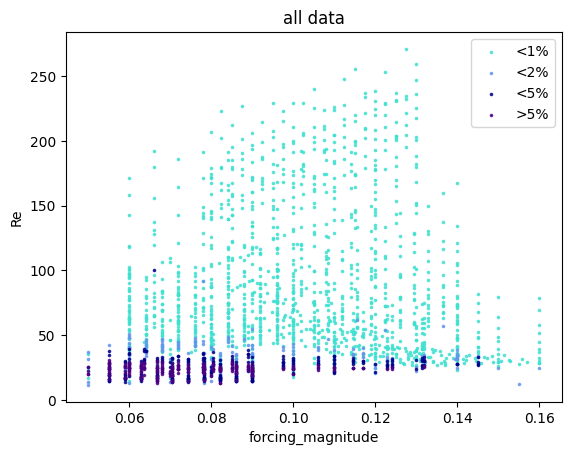

saved all data to /home/julian/BAoffline/img/all_data_f_re_2Dfiterr.png




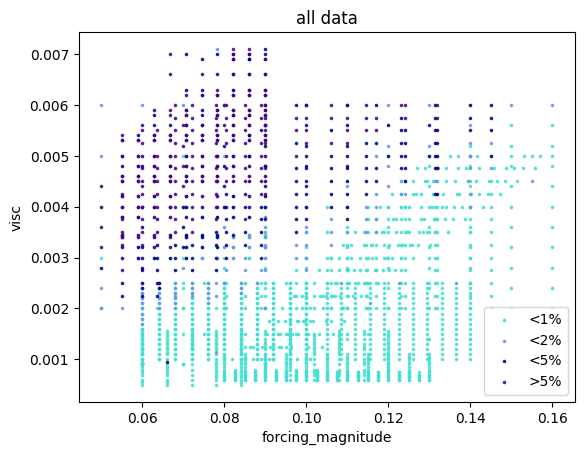

saved all data to /home/julian/BAoffline/img/all_data_f_v_2Dfiterr.png




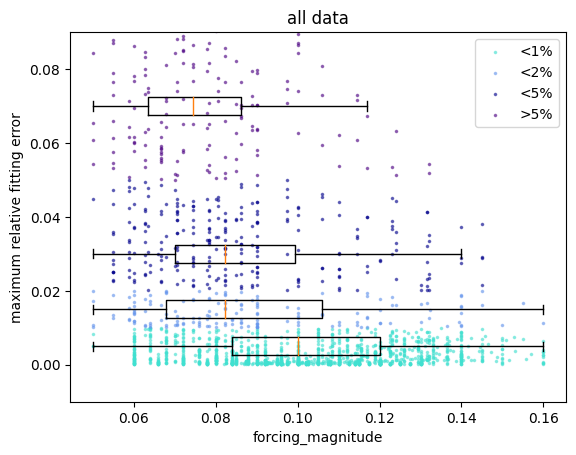

saved all data to /home/julian/BAoffline/img/all_data_f_1Dfiterr.png




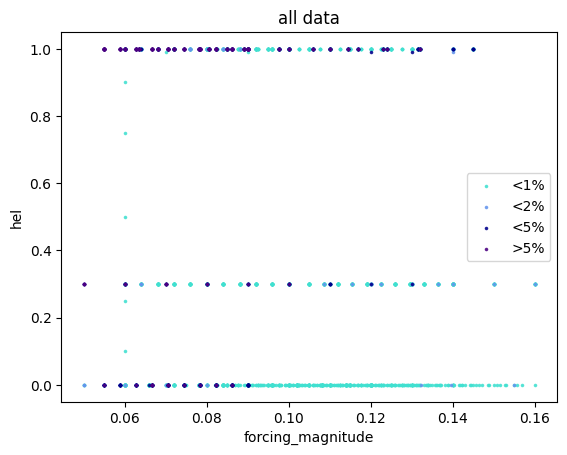

saved all data to /home/julian/BAoffline/img/all_data_f_hel_2Dfiterr.png




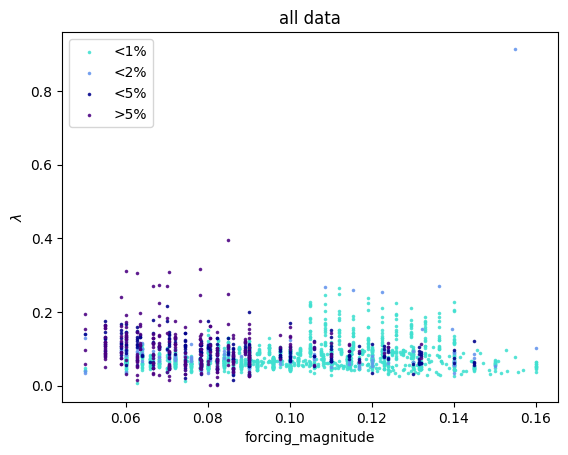

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_2Dfiterr.png




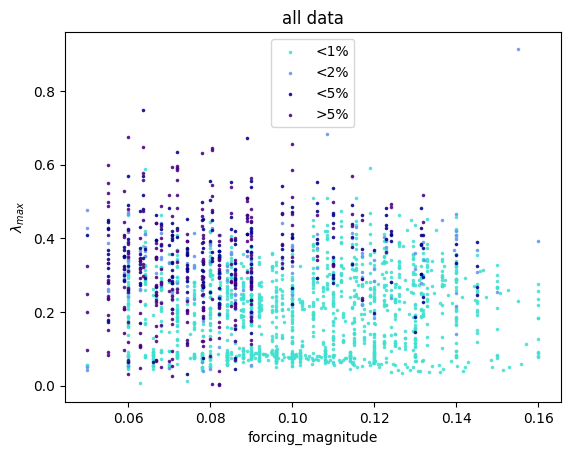

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_max_2Dfiterr.png




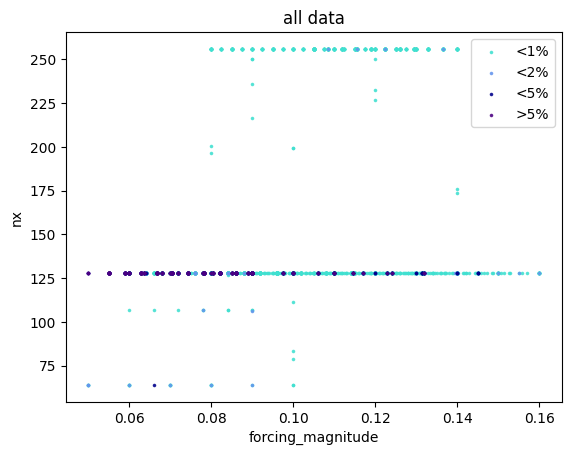

saved all data to /home/julian/BAoffline/img/all_data_f_nx_2Dfiterr.png




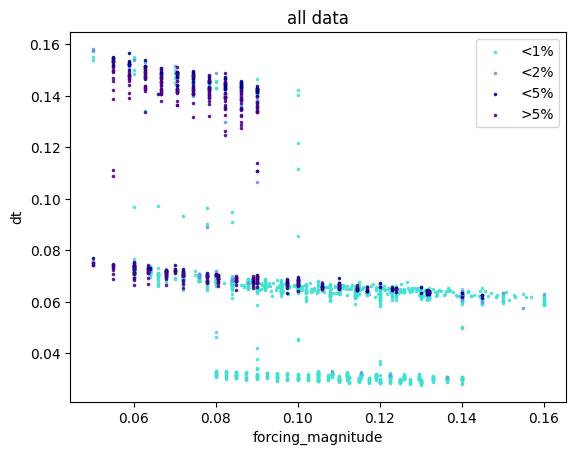

saved all data to /home/julian/BAoffline/img/all_data_f_dt_2Dfiterr.png




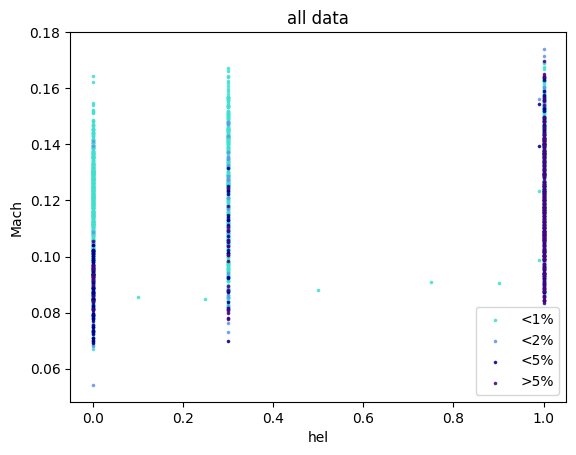

saved all data to /home/julian/BAoffline/img/all_data_hel_urms_2Dfiterr.png




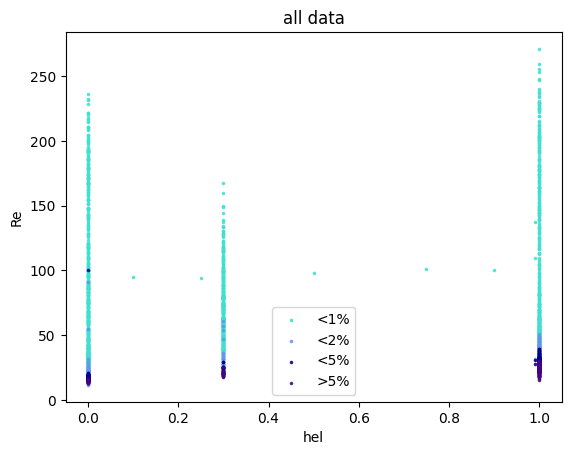

saved all data to /home/julian/BAoffline/img/all_data_hel_re_2Dfiterr.png




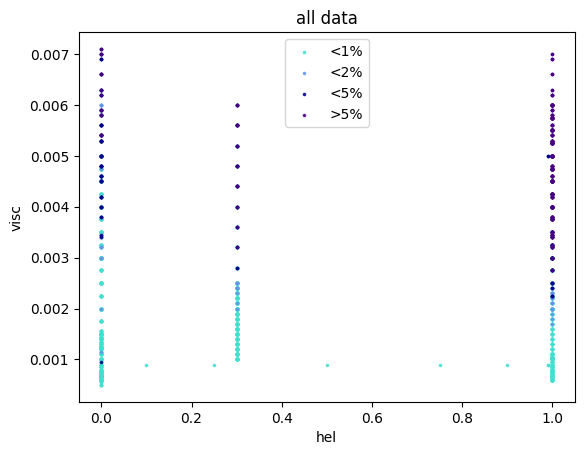

saved all data to /home/julian/BAoffline/img/all_data_hel_v_2Dfiterr.png




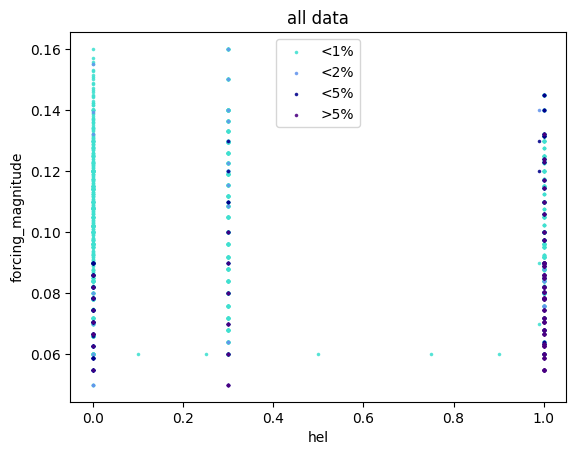

saved all data to /home/julian/BAoffline/img/all_data_hel_f_2Dfiterr.png




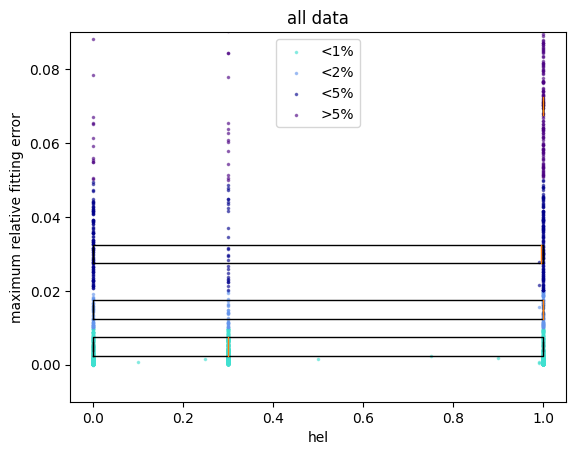

saved all data to /home/julian/BAoffline/img/all_data_hel_1Dfiterr.png




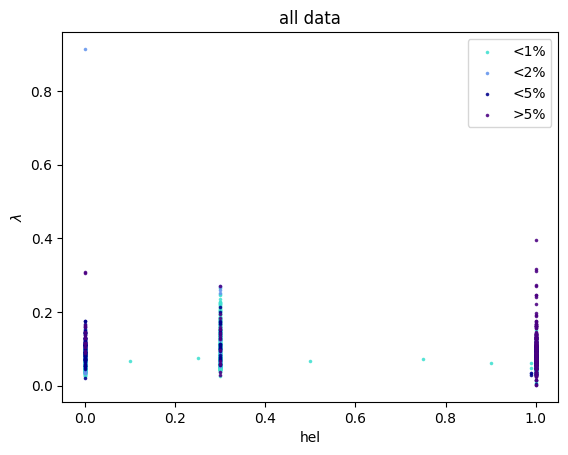

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_2Dfiterr.png




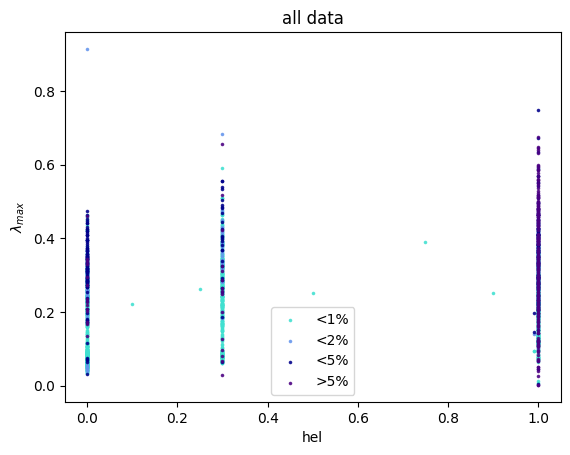

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_max_2Dfiterr.png




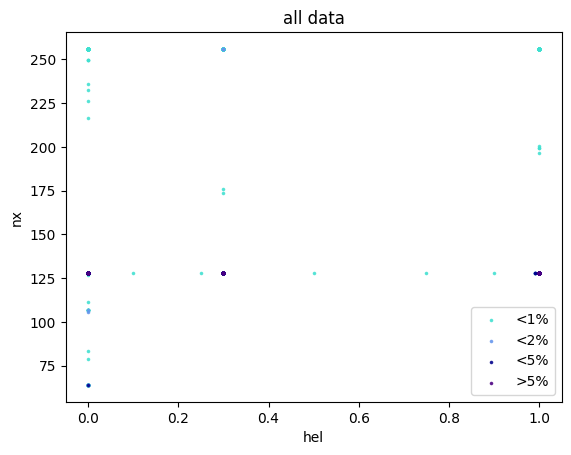

saved all data to /home/julian/BAoffline/img/all_data_hel_nx_2Dfiterr.png




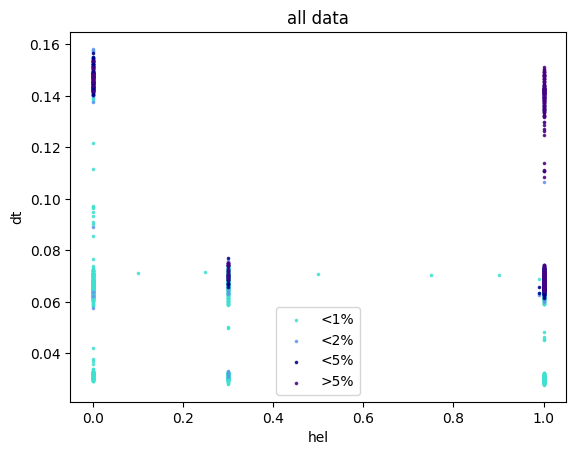

saved all data to /home/julian/BAoffline/img/all_data_hel_dt_2Dfiterr.png




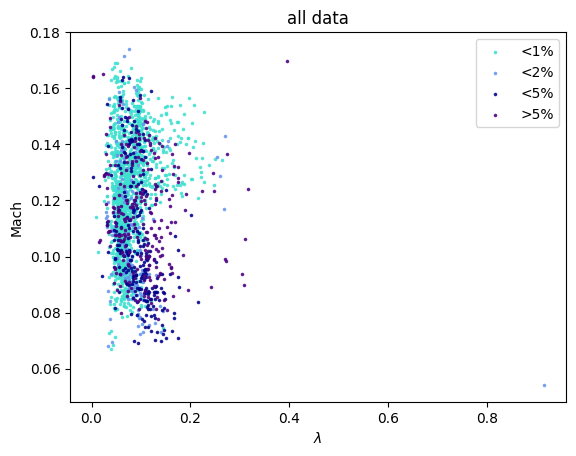

saved all data to /home/julian/BAoffline/img/all_data_lmb_urms_2Dfiterr.png




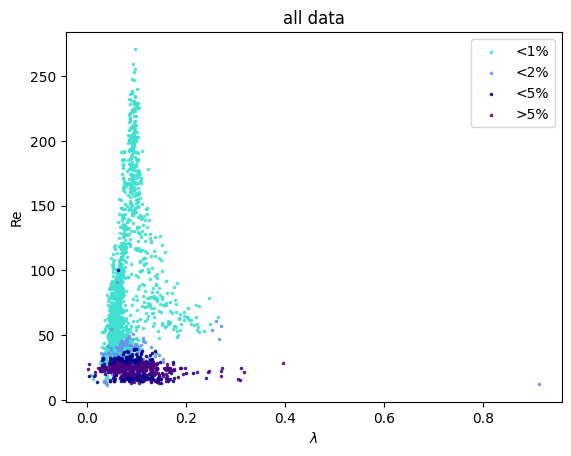

saved all data to /home/julian/BAoffline/img/all_data_lmb_re_2Dfiterr.png




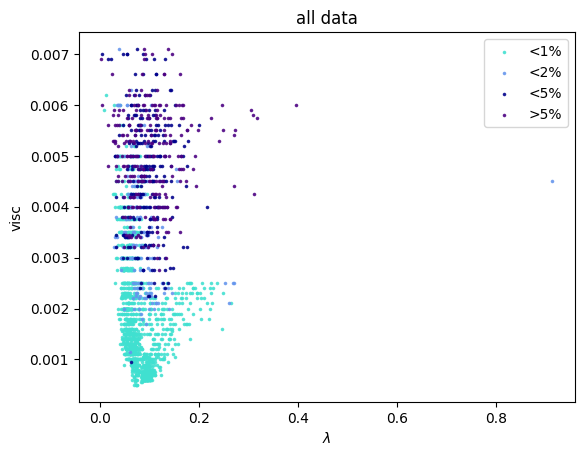

saved all data to /home/julian/BAoffline/img/all_data_lmb_v_2Dfiterr.png




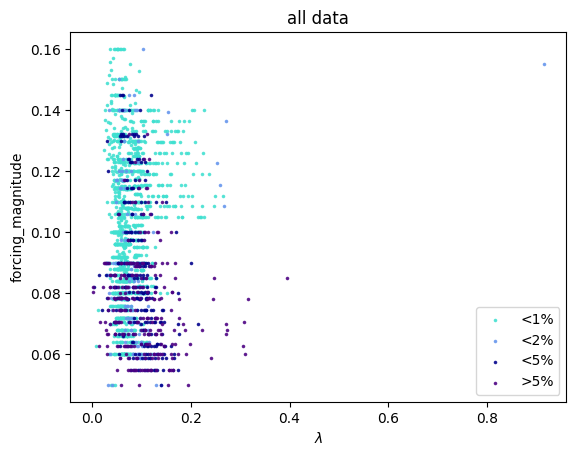

saved all data to /home/julian/BAoffline/img/all_data_lmb_f_2Dfiterr.png




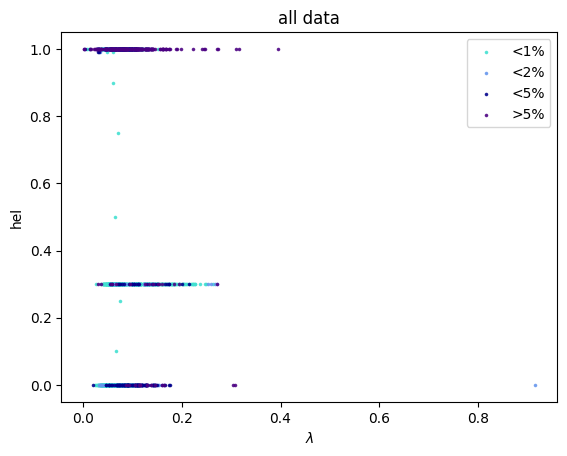

saved all data to /home/julian/BAoffline/img/all_data_lmb_hel_2Dfiterr.png




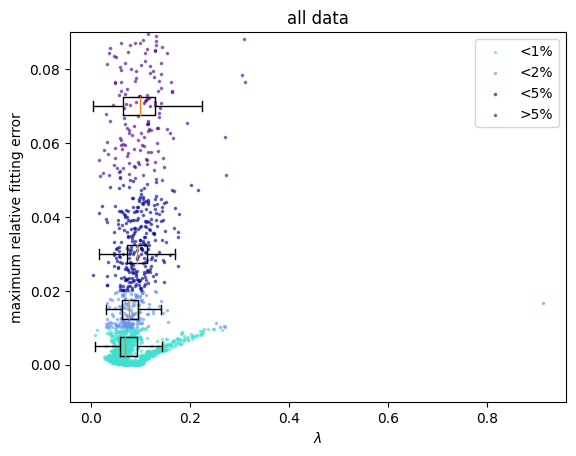

saved all data to /home/julian/BAoffline/img/all_data_lmb_1Dfiterr.png




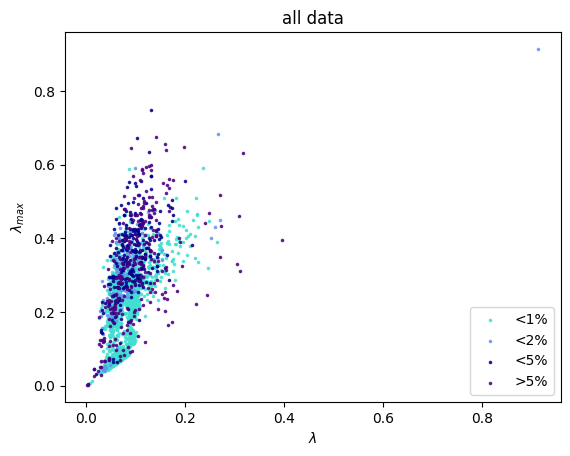

saved all data to /home/julian/BAoffline/img/all_data_lmb_lmb_max_2Dfiterr.png




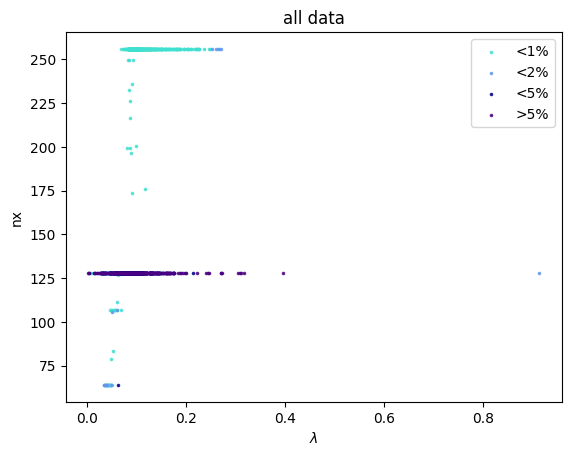

saved all data to /home/julian/BAoffline/img/all_data_lmb_nx_2Dfiterr.png




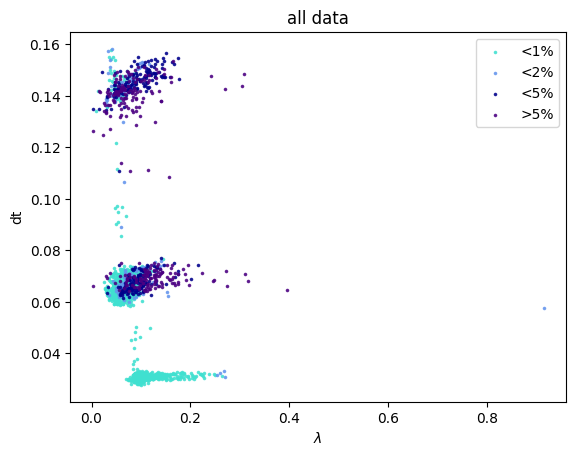

saved all data to /home/julian/BAoffline/img/all_data_lmb_dt_2Dfiterr.png




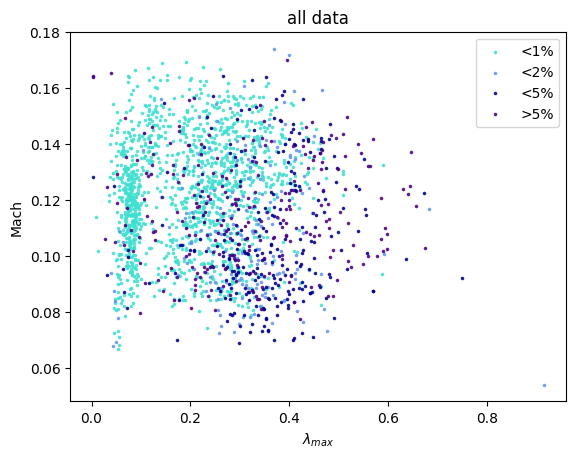

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_urms_2Dfiterr.png




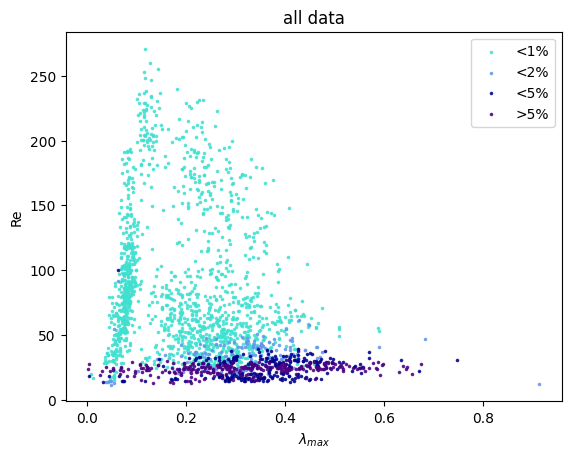

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_re_2Dfiterr.png




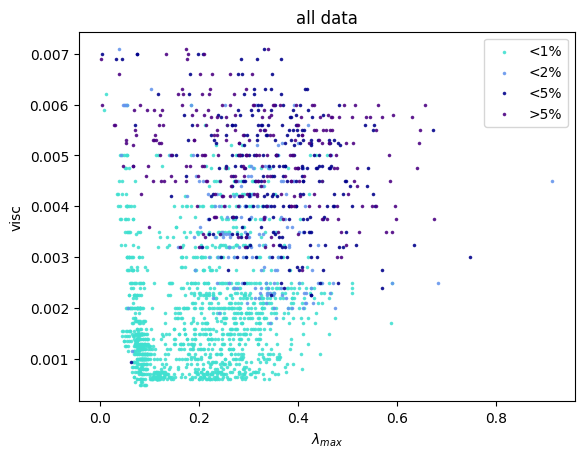

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_v_2Dfiterr.png




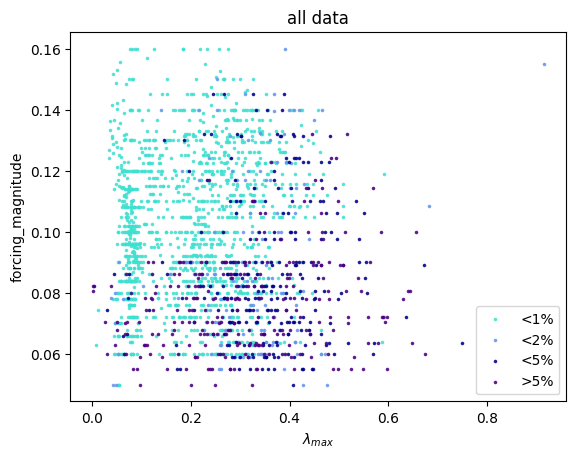

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_f_2Dfiterr.png




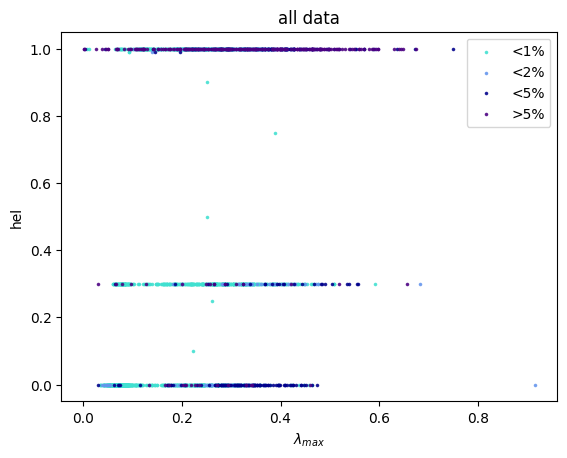

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_hel_2Dfiterr.png




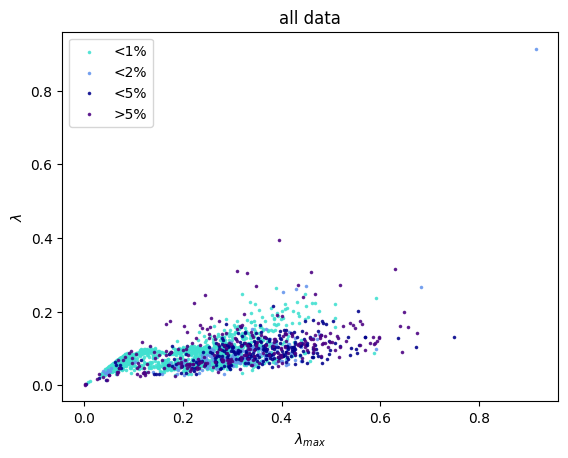

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_lmb_2Dfiterr.png




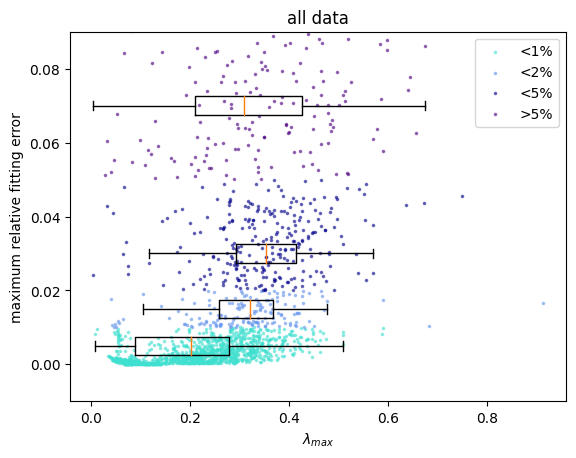

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_1Dfiterr.png




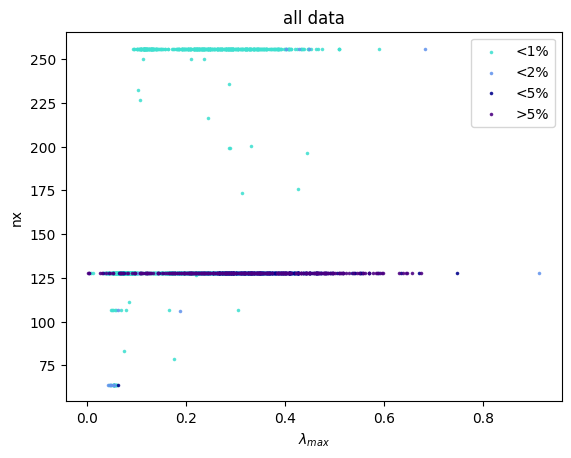

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_nx_2Dfiterr.png




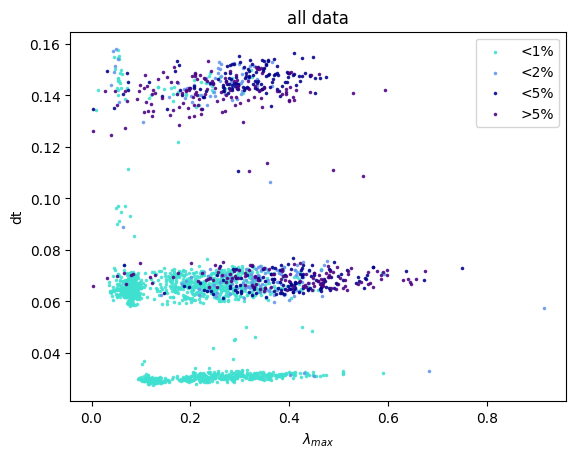

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_dt_2Dfiterr.png




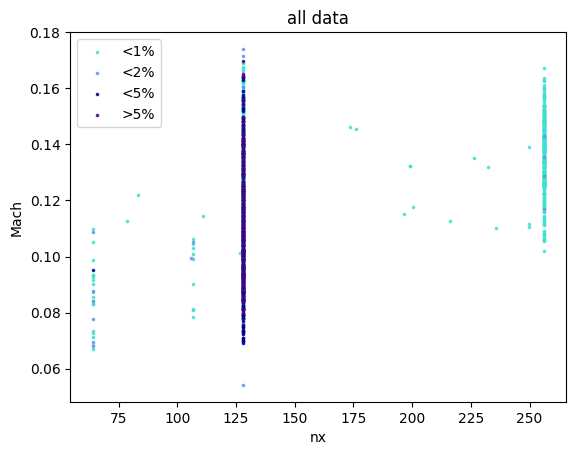

saved all data to /home/julian/BAoffline/img/all_data_nx_urms_2Dfiterr.png




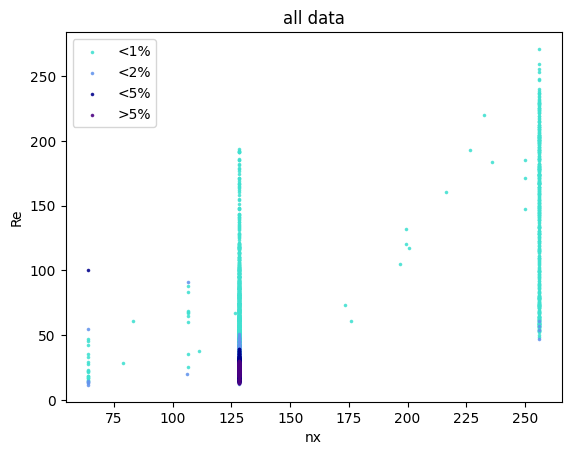

saved all data to /home/julian/BAoffline/img/all_data_nx_re_2Dfiterr.png




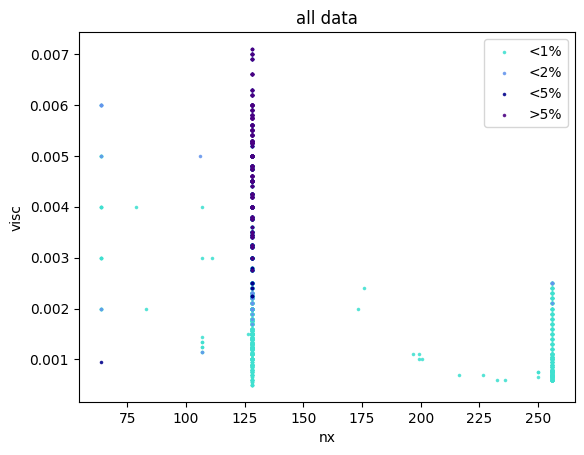

saved all data to /home/julian/BAoffline/img/all_data_nx_v_2Dfiterr.png




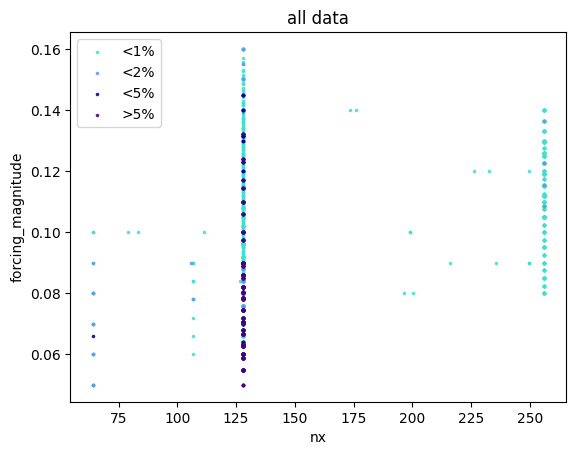

saved all data to /home/julian/BAoffline/img/all_data_nx_f_2Dfiterr.png




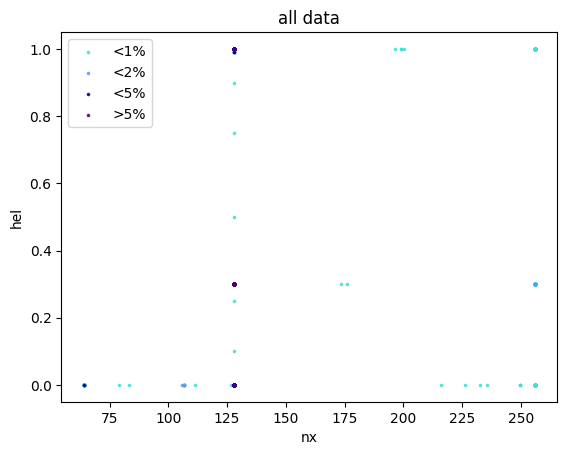

saved all data to /home/julian/BAoffline/img/all_data_nx_hel_2Dfiterr.png




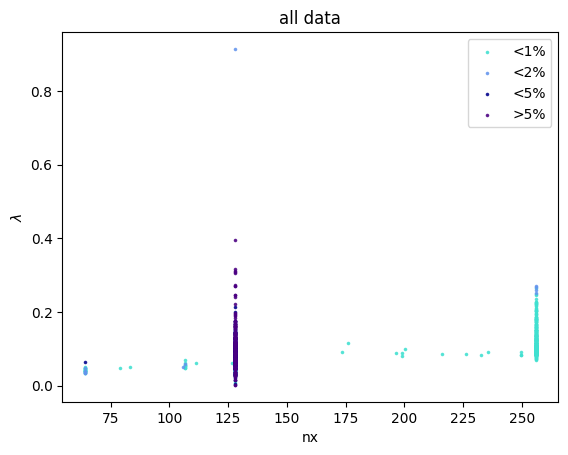

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_2Dfiterr.png




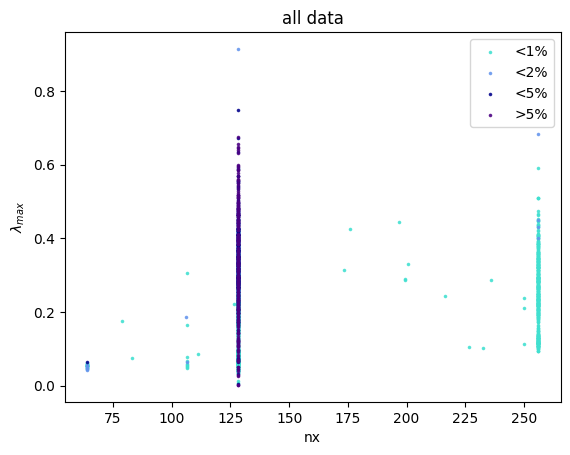

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_max_2Dfiterr.png




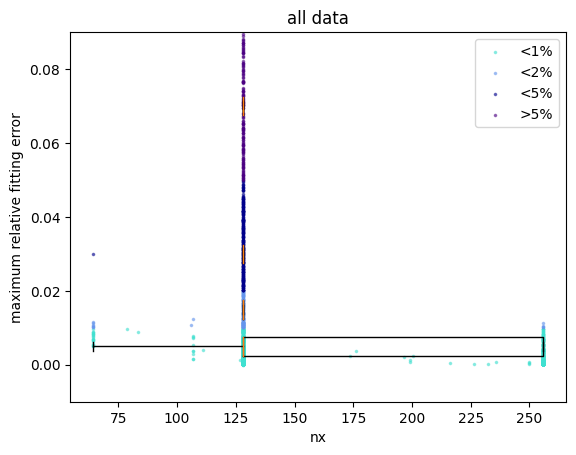

saved all data to /home/julian/BAoffline/img/all_data_nx_1Dfiterr.png




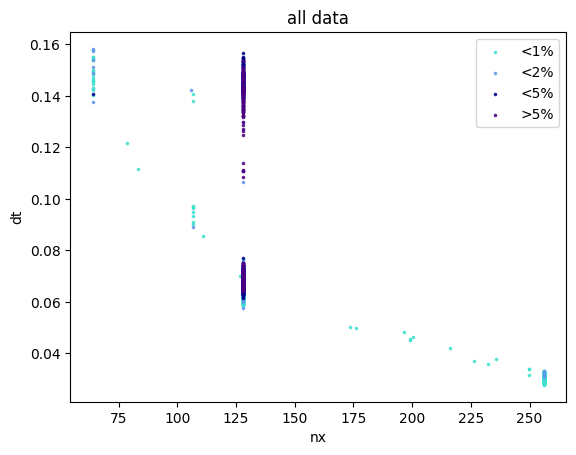

saved all data to /home/julian/BAoffline/img/all_data_nx_dt_2Dfiterr.png




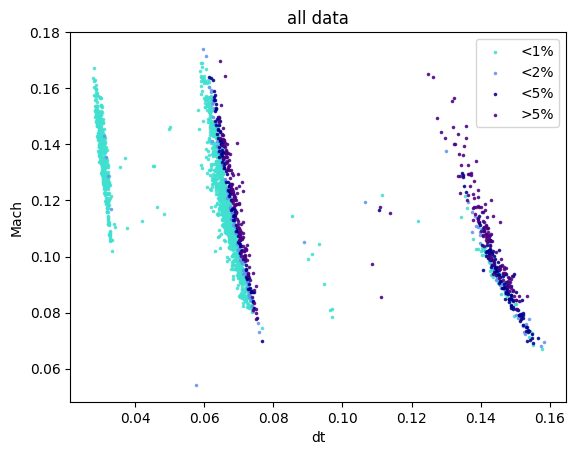

saved all data to /home/julian/BAoffline/img/all_data_dt_urms_2Dfiterr.png




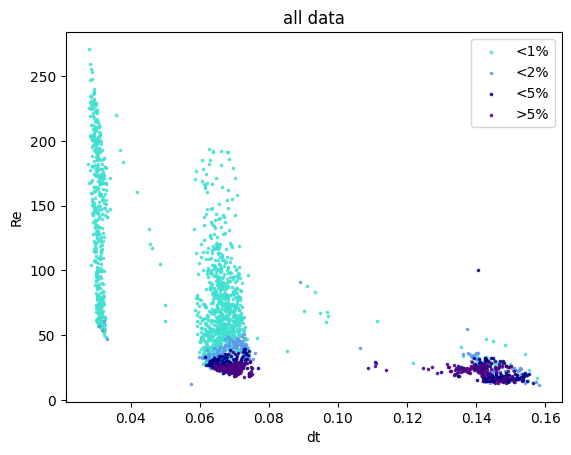

saved all data to /home/julian/BAoffline/img/all_data_dt_re_2Dfiterr.png




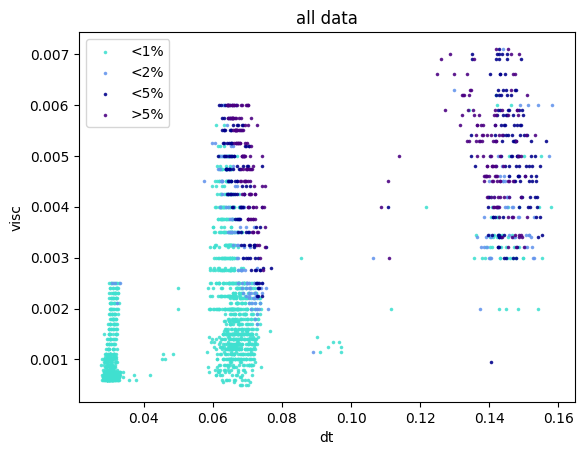

saved all data to /home/julian/BAoffline/img/all_data_dt_v_2Dfiterr.png




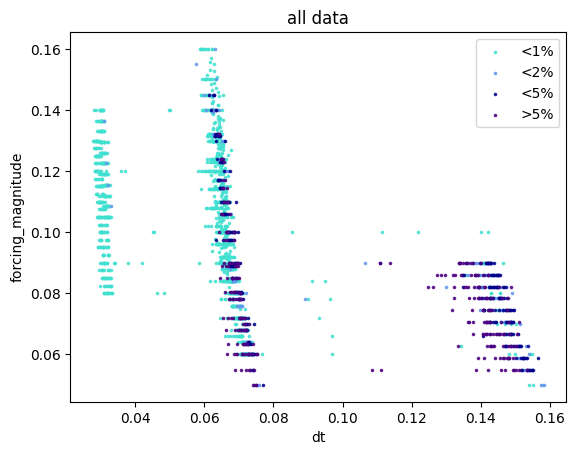

saved all data to /home/julian/BAoffline/img/all_data_dt_f_2Dfiterr.png




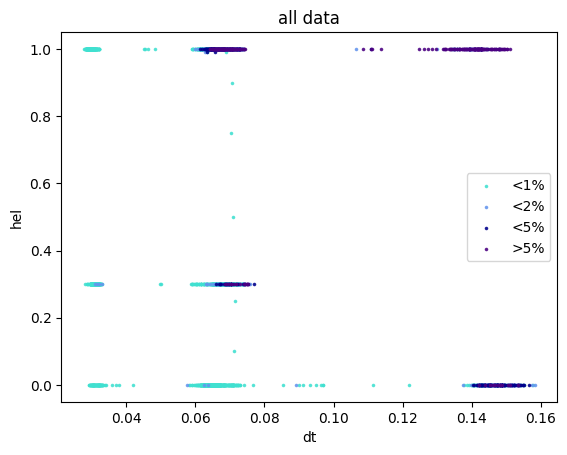

saved all data to /home/julian/BAoffline/img/all_data_dt_hel_2Dfiterr.png




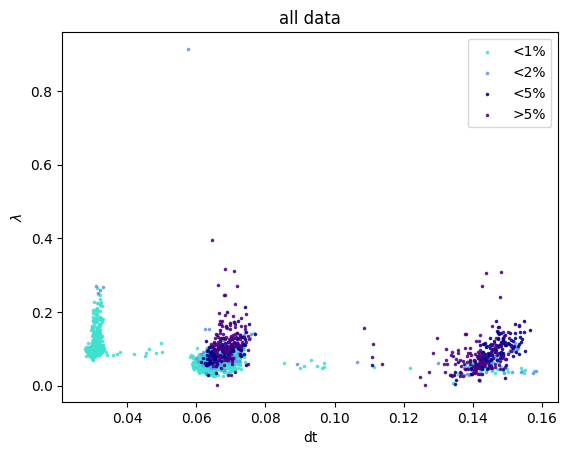

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_2Dfiterr.png




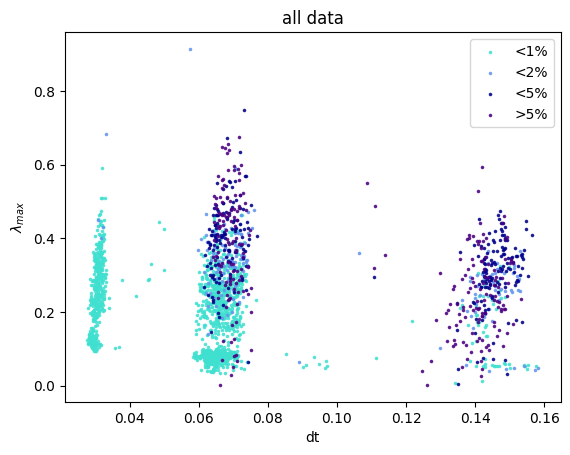

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_max_2Dfiterr.png




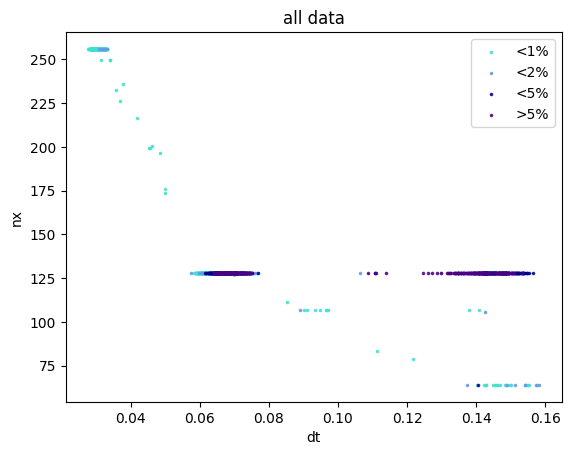

saved all data to /home/julian/BAoffline/img/all_data_dt_nx_2Dfiterr.png




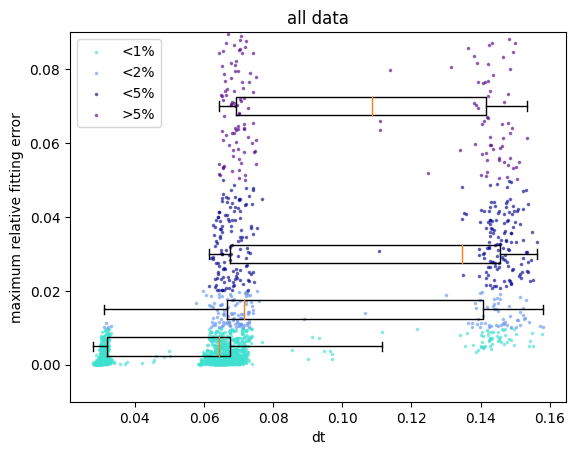

saved all data to /home/julian/BAoffline/img/all_data_dt_1Dfiterr.png




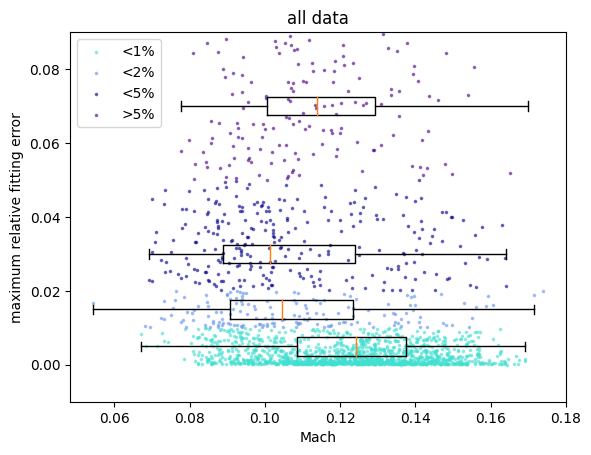

saved all data to /home/julian/BAoffline/img/all_data_urms_1Dfiterr.png




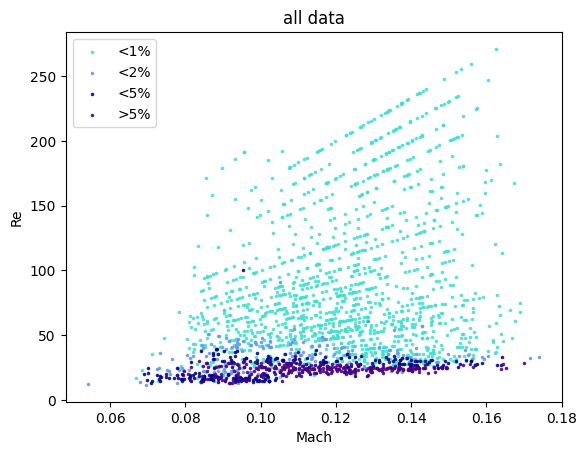

saved all data to /home/julian/BAoffline/img/all_data_urms_re_2Dfiterr.png




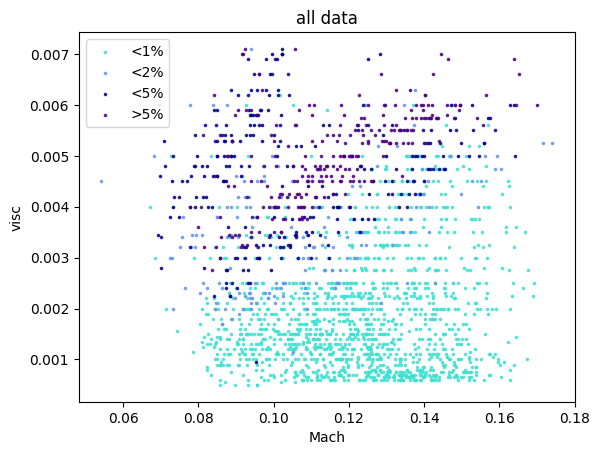

saved all data to /home/julian/BAoffline/img/all_data_urms_v_2Dfiterr.png




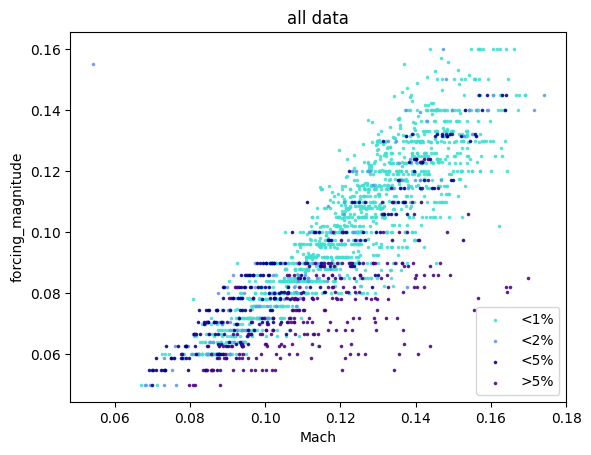

saved all data to /home/julian/BAoffline/img/all_data_urms_f_2Dfiterr.png




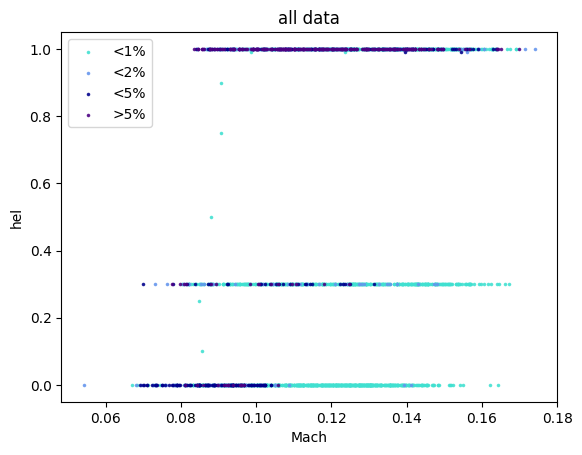

saved all data to /home/julian/BAoffline/img/all_data_urms_hel_2Dfiterr.png




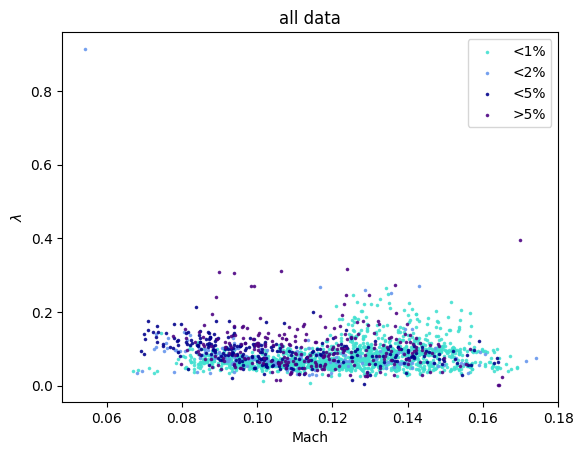

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_2Dfiterr.png




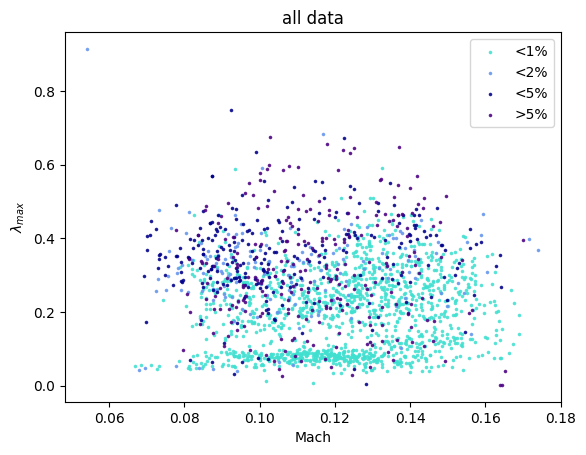

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_max_2Dfiterr.png




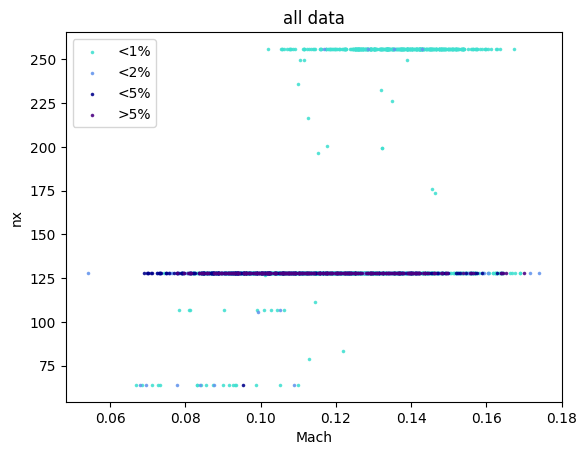

saved all data to /home/julian/BAoffline/img/all_data_urms_nx_2Dfiterr.png




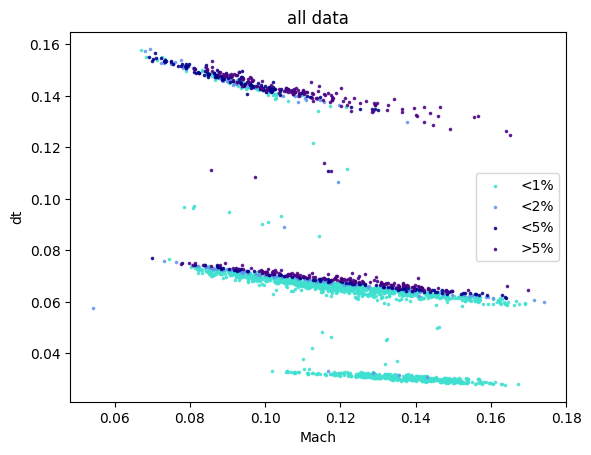

saved all data to /home/julian/BAoffline/img/all_data_urms_dt_2Dfiterr.png




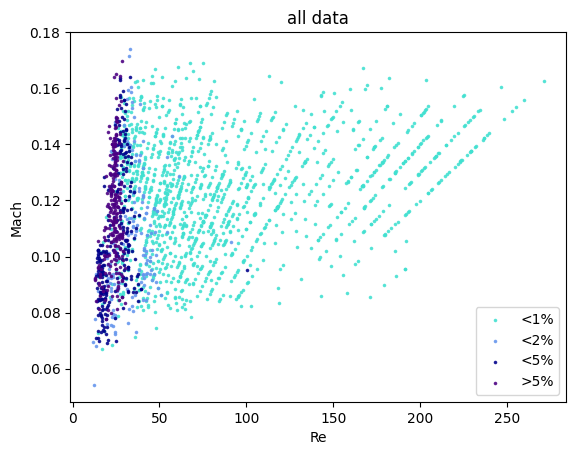

saved all data to /home/julian/BAoffline/img/all_data_re_urms_2Dfiterr.png




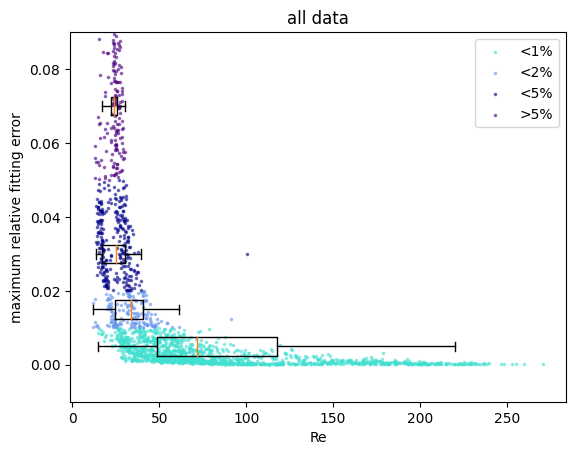

saved all data to /home/julian/BAoffline/img/all_data_re_1Dfiterr.png




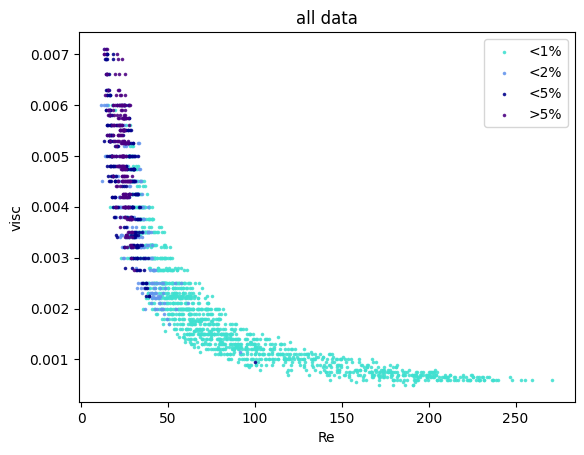

saved all data to /home/julian/BAoffline/img/all_data_re_v_2Dfiterr.png




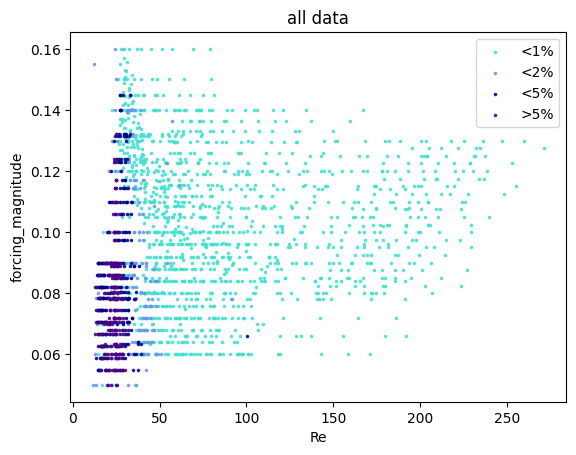

saved all data to /home/julian/BAoffline/img/all_data_re_f_2Dfiterr.png




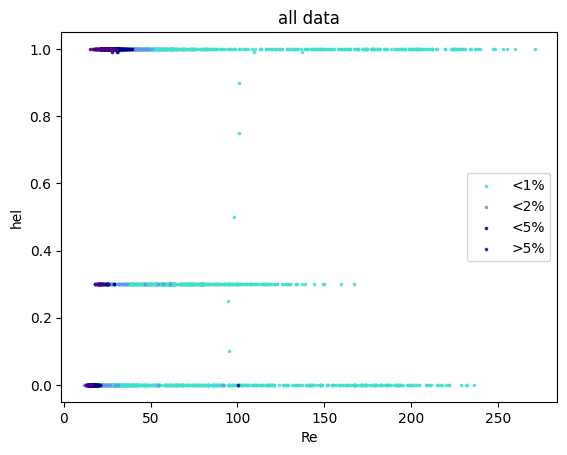

saved all data to /home/julian/BAoffline/img/all_data_re_hel_2Dfiterr.png




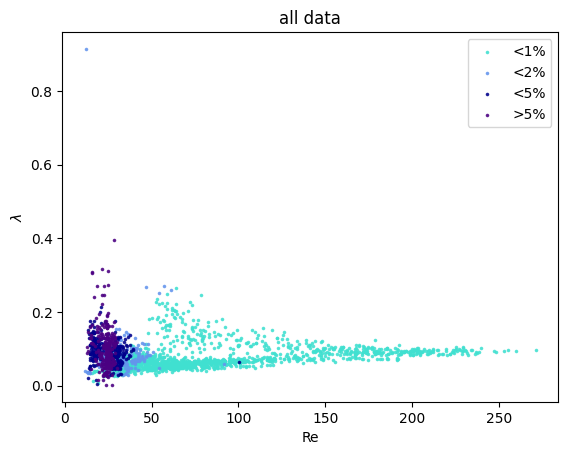

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_2Dfiterr.png




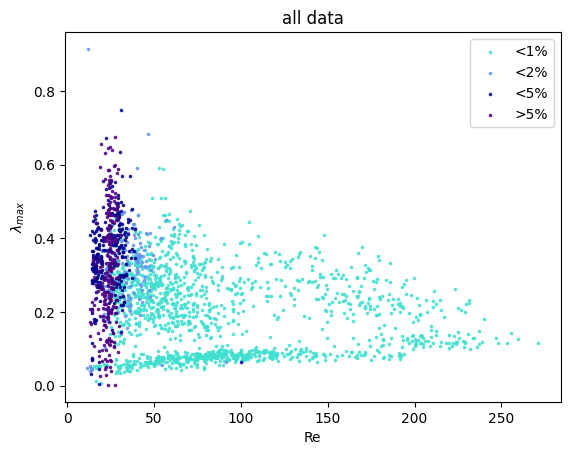

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_max_2Dfiterr.png




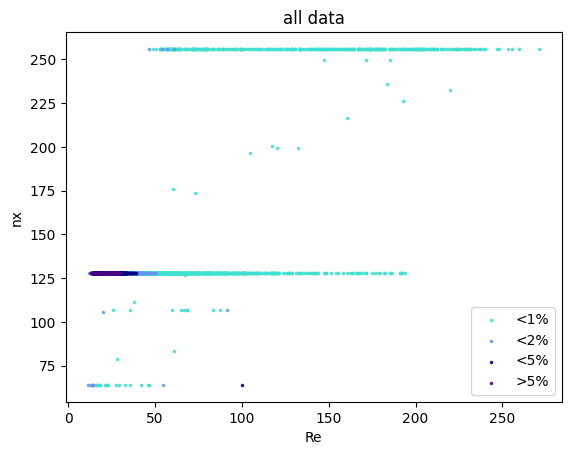

saved all data to /home/julian/BAoffline/img/all_data_re_nx_2Dfiterr.png




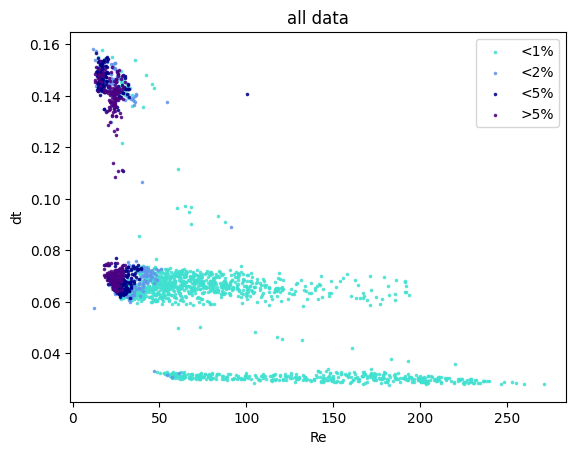

saved all data to /home/julian/BAoffline/img/all_data_re_dt_2Dfiterr.png




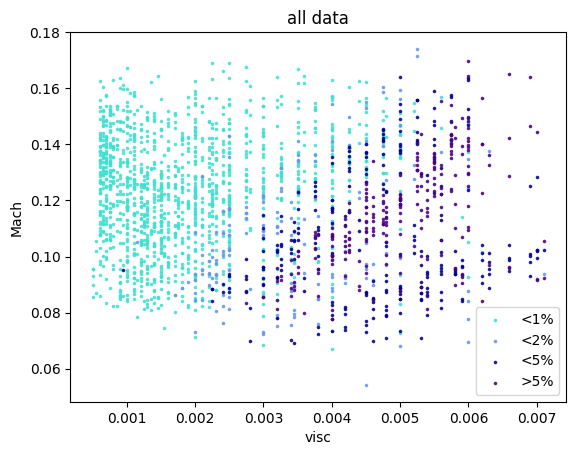

saved all data to /home/julian/BAoffline/img/all_data_v_urms_2Dfiterr.png




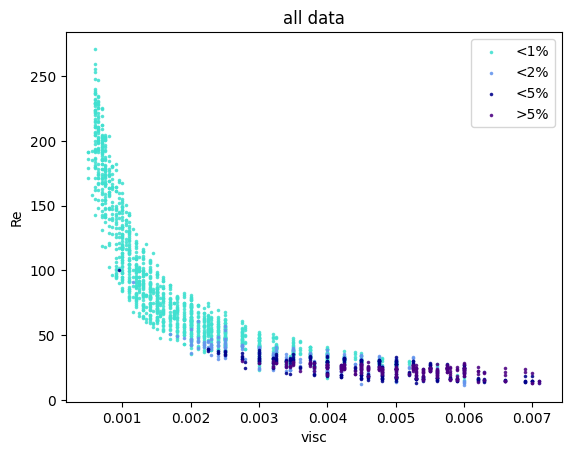

saved all data to /home/julian/BAoffline/img/all_data_v_re_2Dfiterr.png




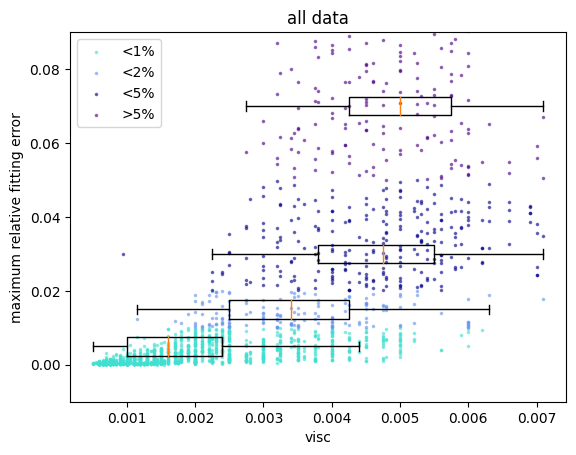

saved all data to /home/julian/BAoffline/img/all_data_v_1Dfiterr.png




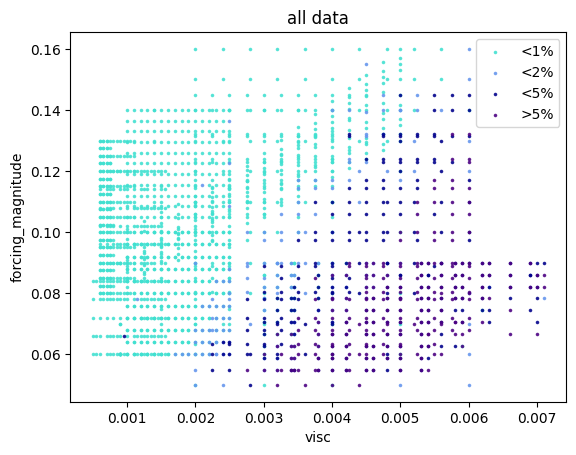

saved all data to /home/julian/BAoffline/img/all_data_v_f_2Dfiterr.png




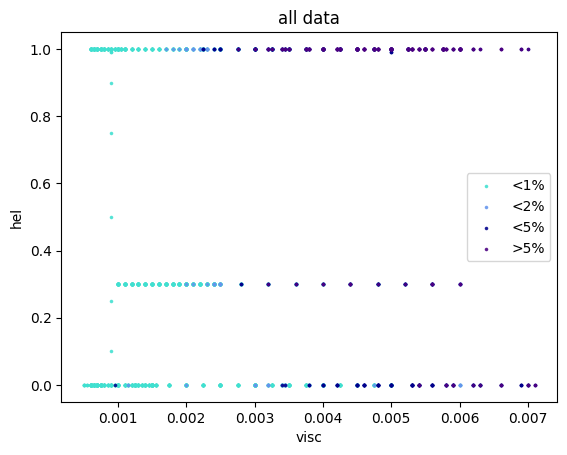

saved all data to /home/julian/BAoffline/img/all_data_v_hel_2Dfiterr.png




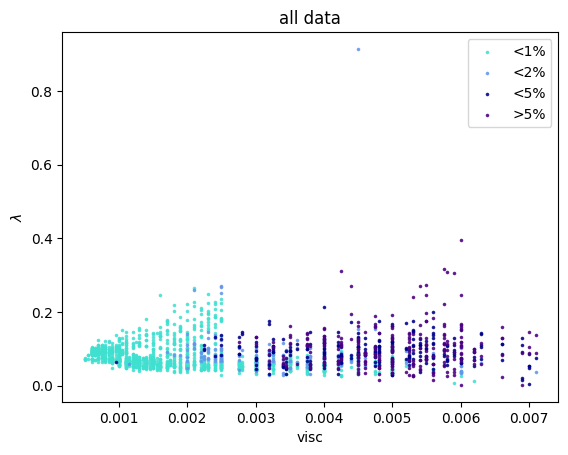

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_2Dfiterr.png




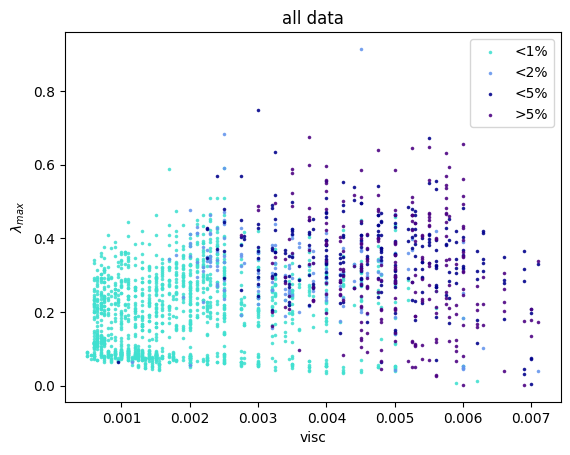

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_max_2Dfiterr.png




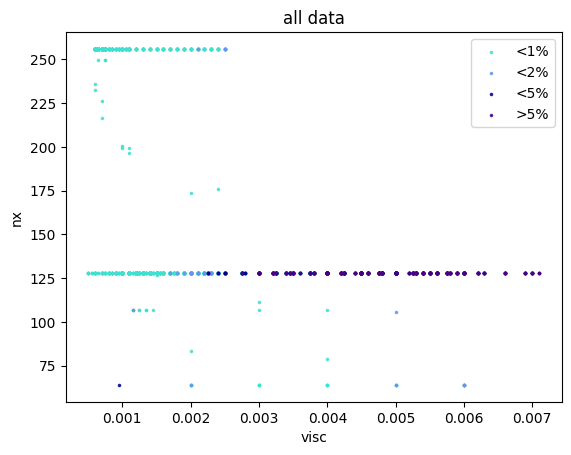

saved all data to /home/julian/BAoffline/img/all_data_v_nx_2Dfiterr.png




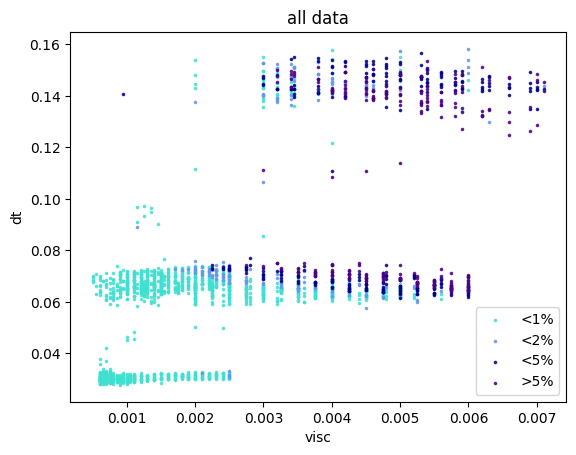

saved all data to /home/julian/BAoffline/img/all_data_v_dt_2Dfiterr.png




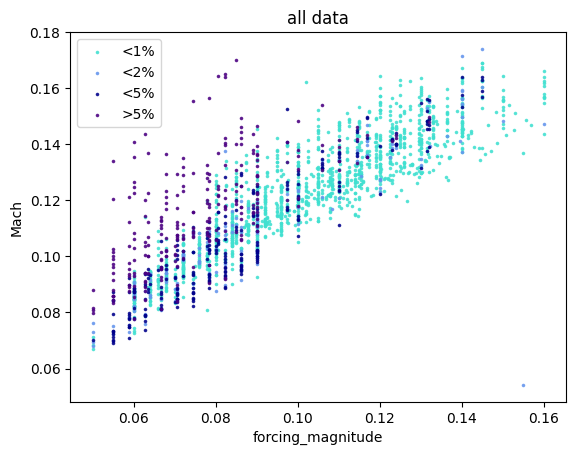

saved all data to /home/julian/BAoffline/img/all_data_f_urms_2Dfiterr.png




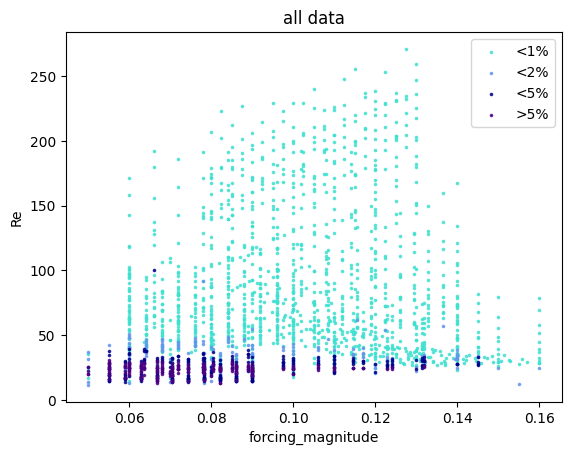

saved all data to /home/julian/BAoffline/img/all_data_f_re_2Dfiterr.png




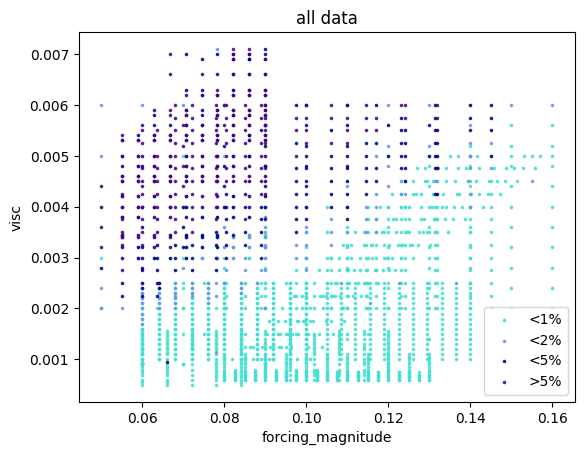

saved all data to /home/julian/BAoffline/img/all_data_f_v_2Dfiterr.png




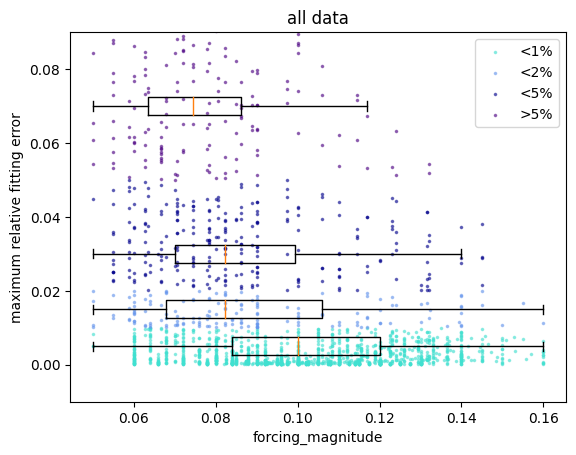

saved all data to /home/julian/BAoffline/img/all_data_f_1Dfiterr.png




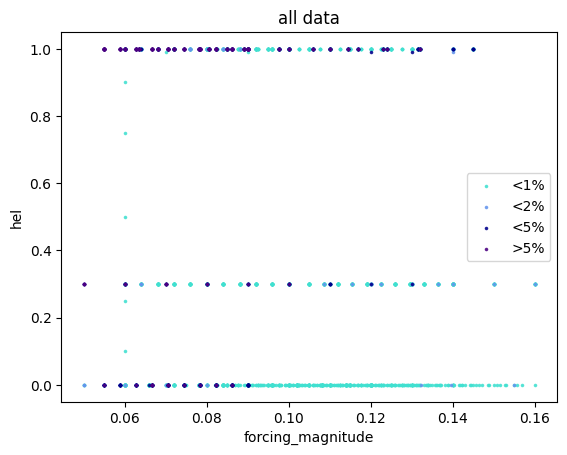

saved all data to /home/julian/BAoffline/img/all_data_f_hel_2Dfiterr.png




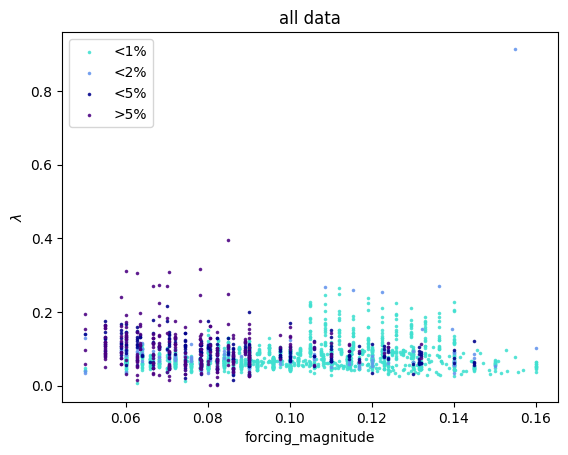

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_2Dfiterr.png




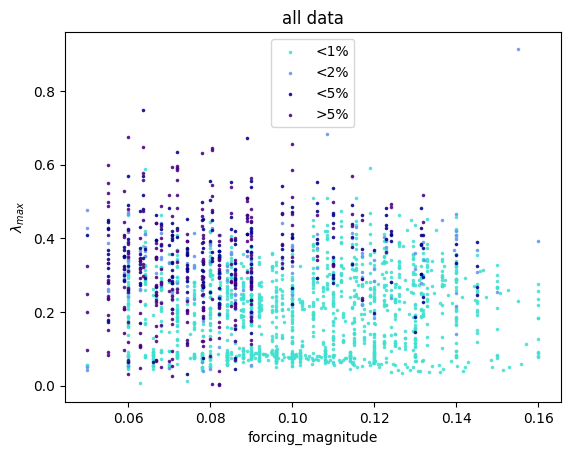

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_max_2Dfiterr.png




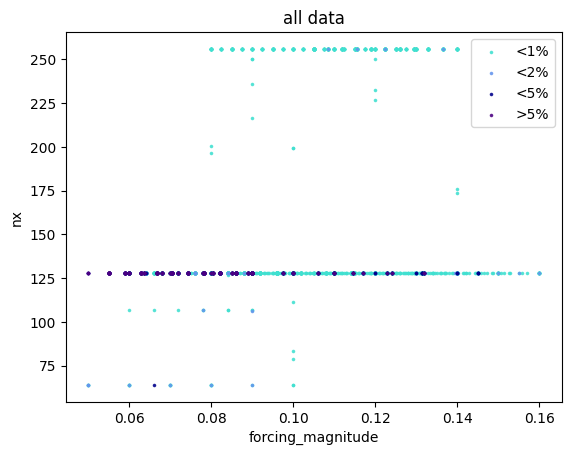

saved all data to /home/julian/BAoffline/img/all_data_f_nx_2Dfiterr.png




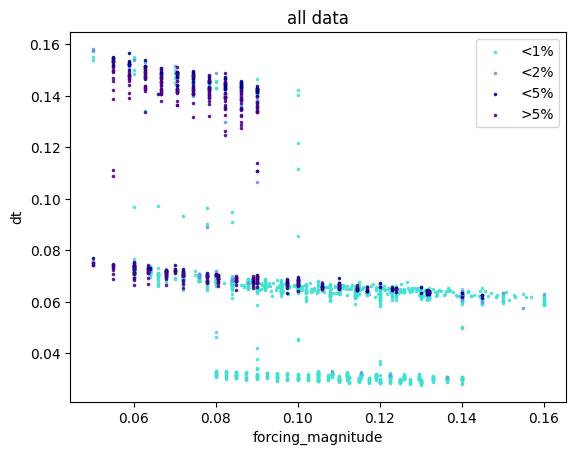

saved all data to /home/julian/BAoffline/img/all_data_f_dt_2Dfiterr.png




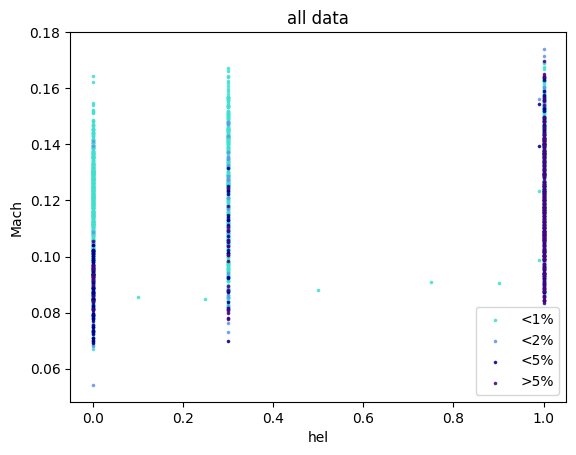

saved all data to /home/julian/BAoffline/img/all_data_hel_urms_2Dfiterr.png




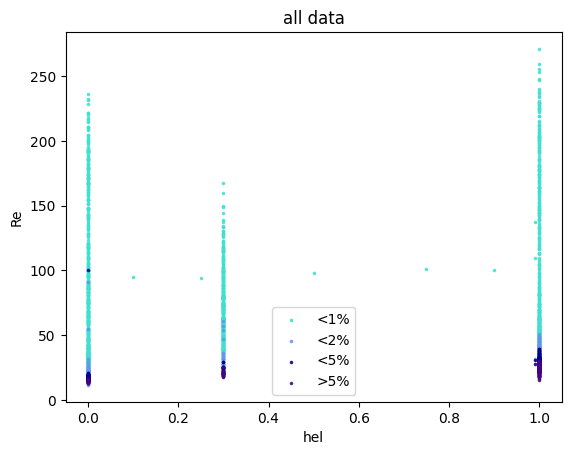

saved all data to /home/julian/BAoffline/img/all_data_hel_re_2Dfiterr.png




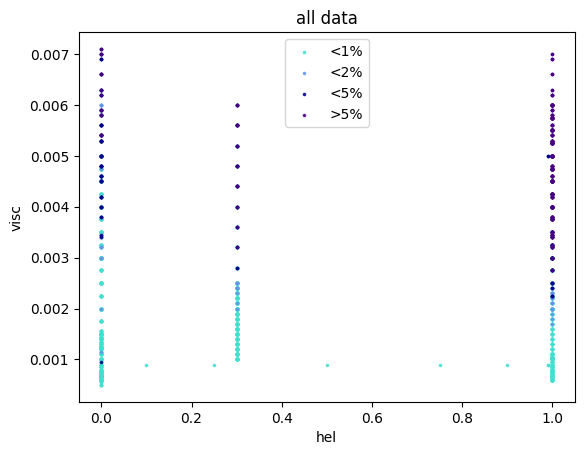

saved all data to /home/julian/BAoffline/img/all_data_hel_v_2Dfiterr.png




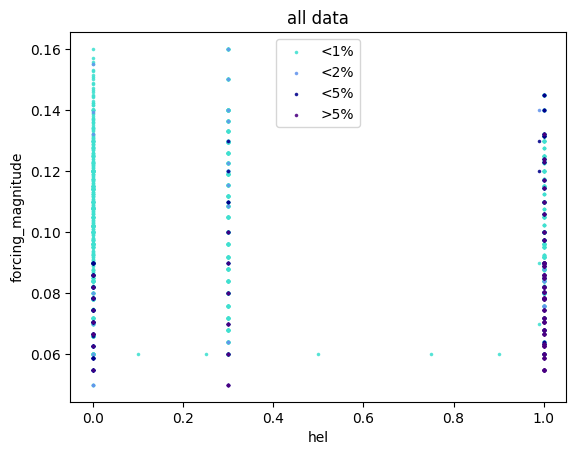

saved all data to /home/julian/BAoffline/img/all_data_hel_f_2Dfiterr.png




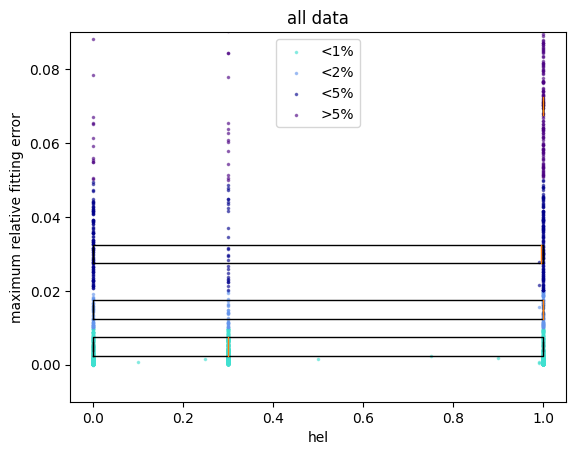

saved all data to /home/julian/BAoffline/img/all_data_hel_1Dfiterr.png




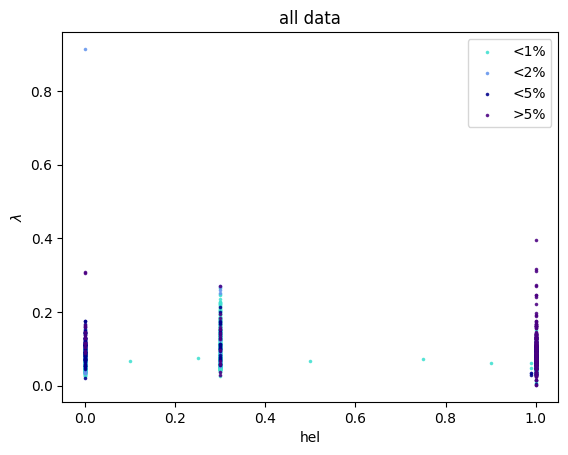

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_2Dfiterr.png




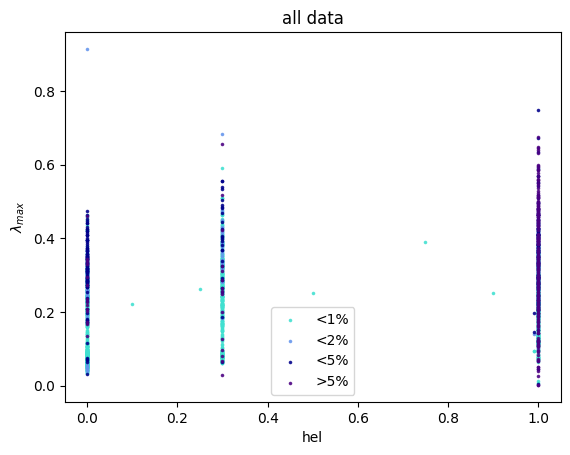

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_max_2Dfiterr.png




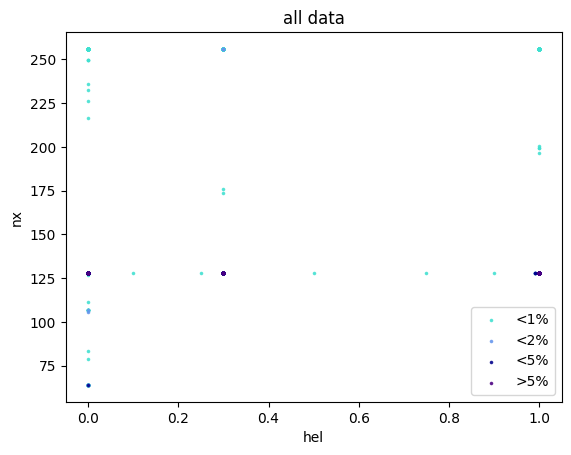

saved all data to /home/julian/BAoffline/img/all_data_hel_nx_2Dfiterr.png




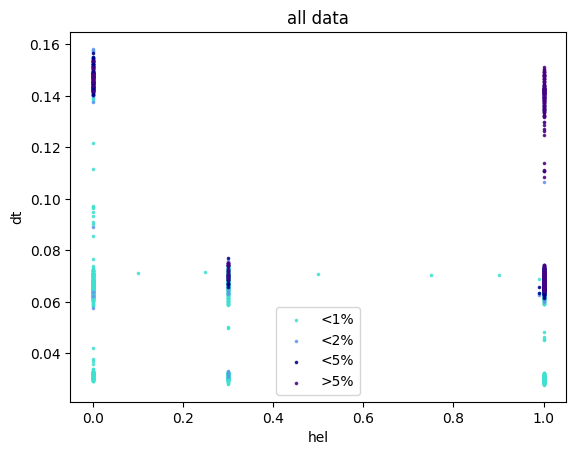

saved all data to /home/julian/BAoffline/img/all_data_hel_dt_2Dfiterr.png




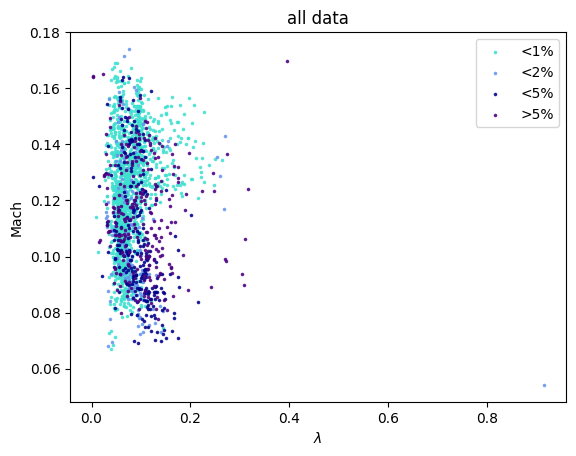

saved all data to /home/julian/BAoffline/img/all_data_lmb_urms_2Dfiterr.png




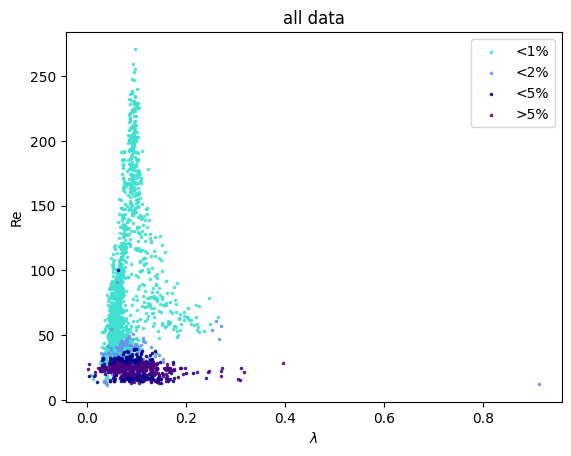

saved all data to /home/julian/BAoffline/img/all_data_lmb_re_2Dfiterr.png




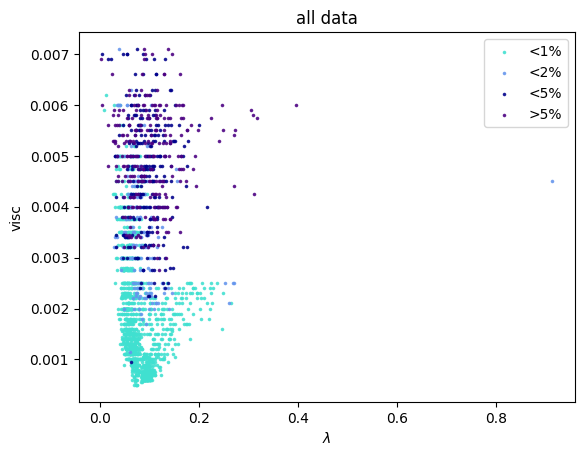

saved all data to /home/julian/BAoffline/img/all_data_lmb_v_2Dfiterr.png




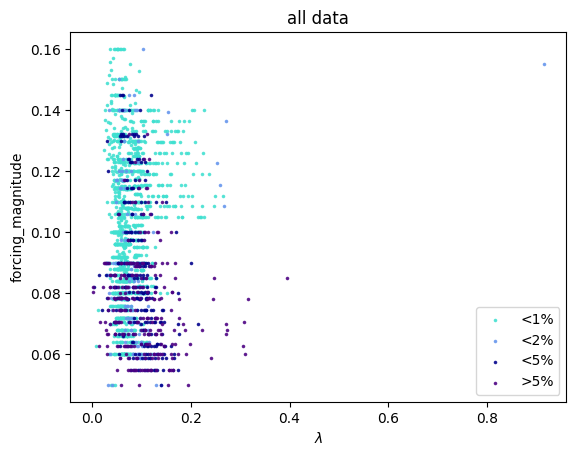

saved all data to /home/julian/BAoffline/img/all_data_lmb_f_2Dfiterr.png




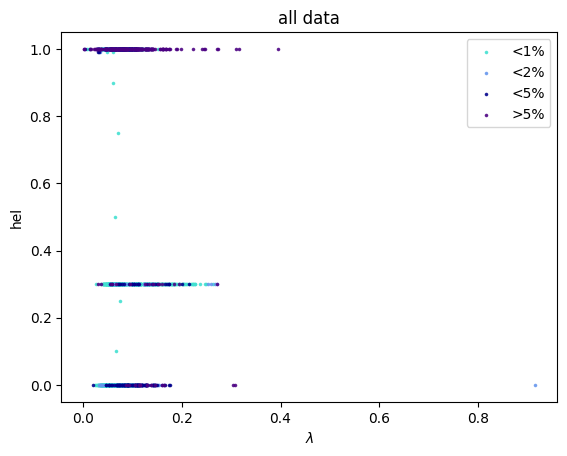

saved all data to /home/julian/BAoffline/img/all_data_lmb_hel_2Dfiterr.png




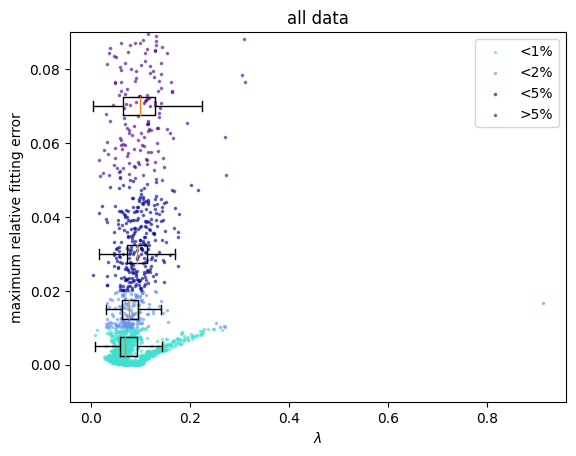

saved all data to /home/julian/BAoffline/img/all_data_lmb_1Dfiterr.png




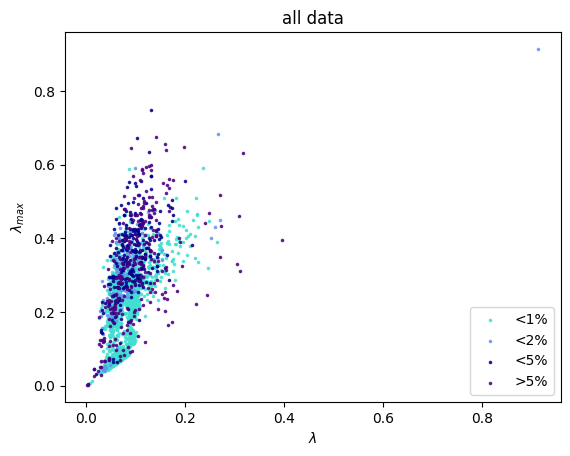

saved all data to /home/julian/BAoffline/img/all_data_lmb_lmb_max_2Dfiterr.png




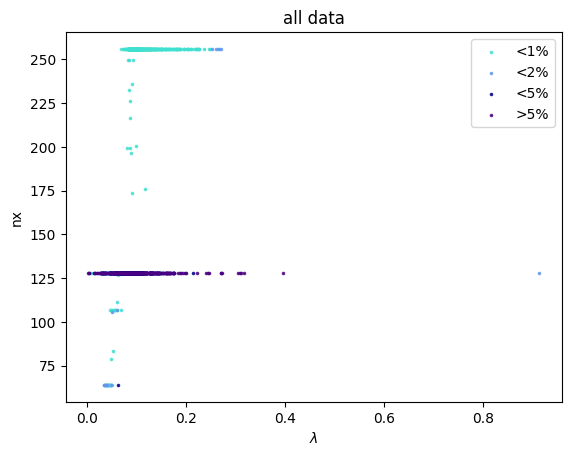

saved all data to /home/julian/BAoffline/img/all_data_lmb_nx_2Dfiterr.png




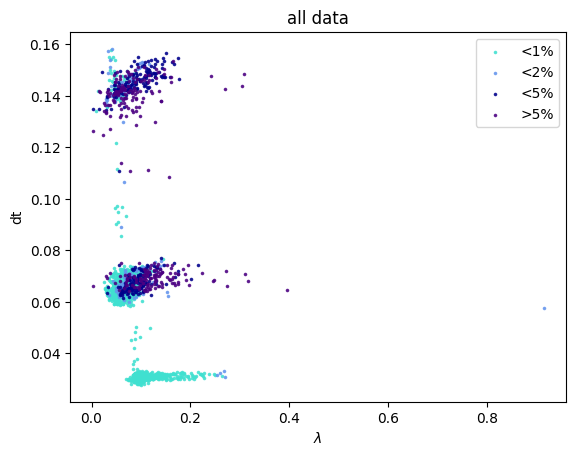

saved all data to /home/julian/BAoffline/img/all_data_lmb_dt_2Dfiterr.png




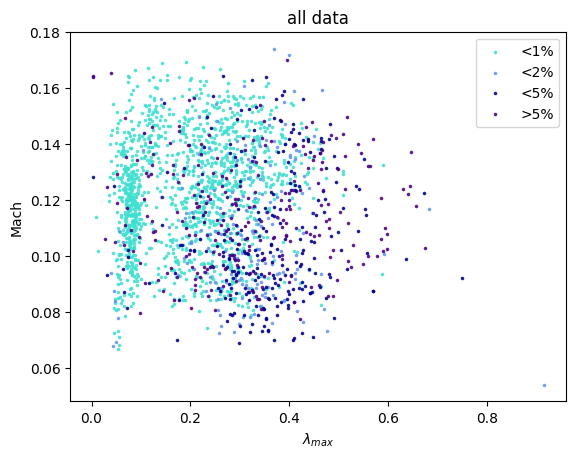

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_urms_2Dfiterr.png




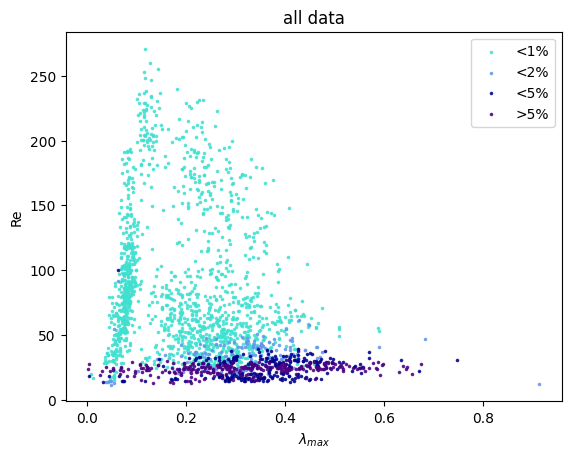

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_re_2Dfiterr.png




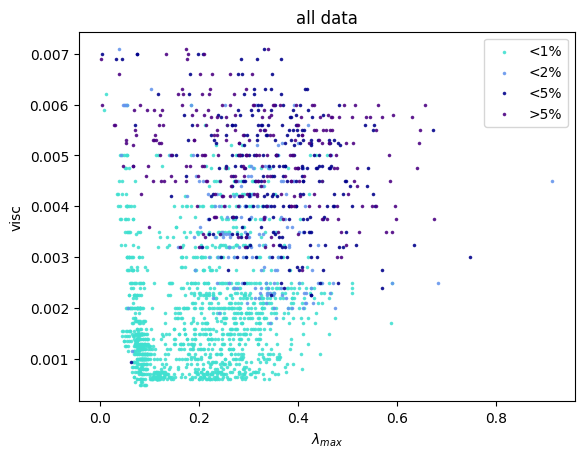

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_v_2Dfiterr.png




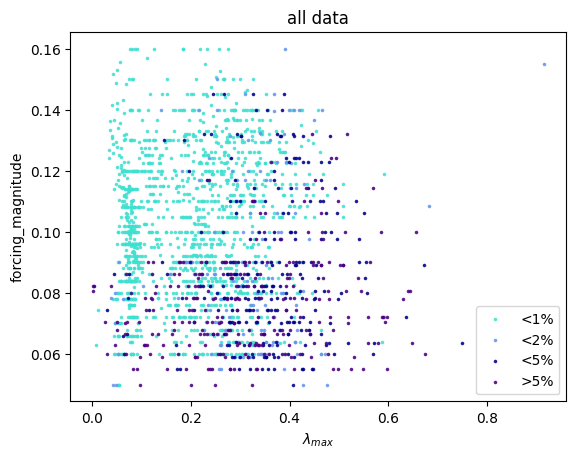

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_f_2Dfiterr.png




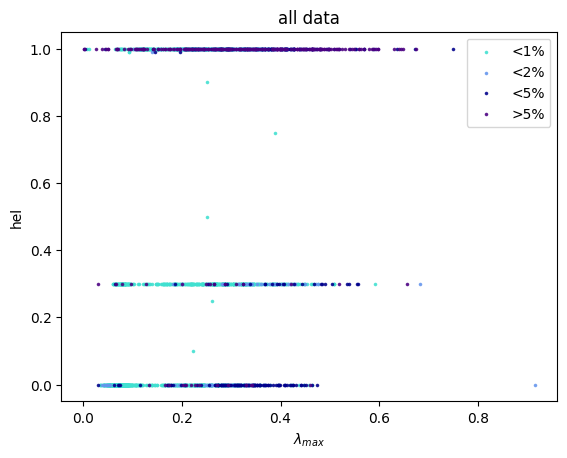

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_hel_2Dfiterr.png




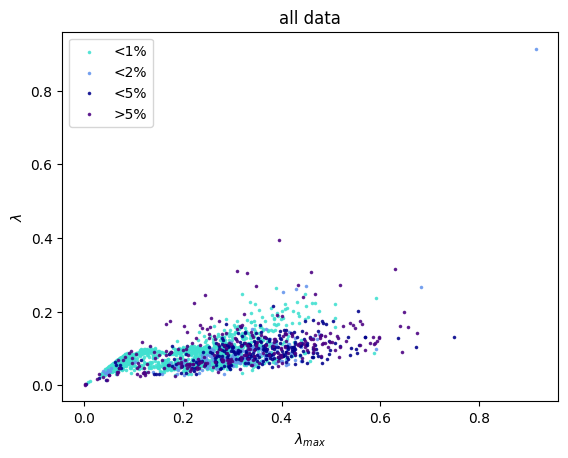

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_lmb_2Dfiterr.png




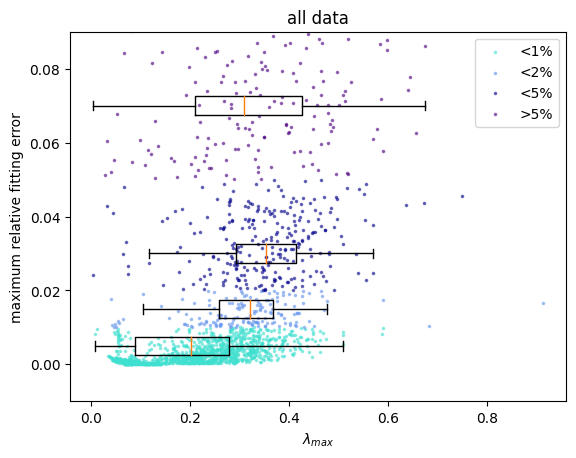

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_1Dfiterr.png




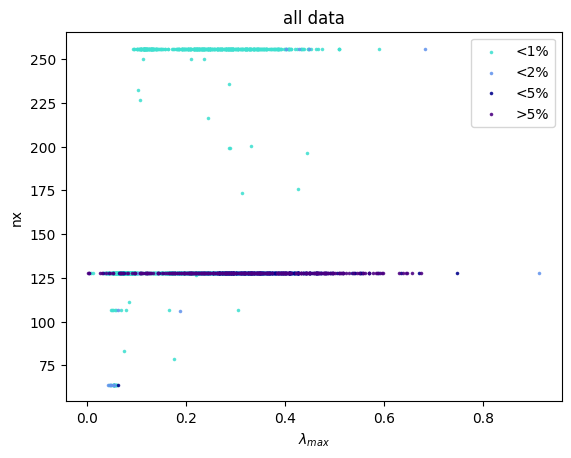

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_nx_2Dfiterr.png




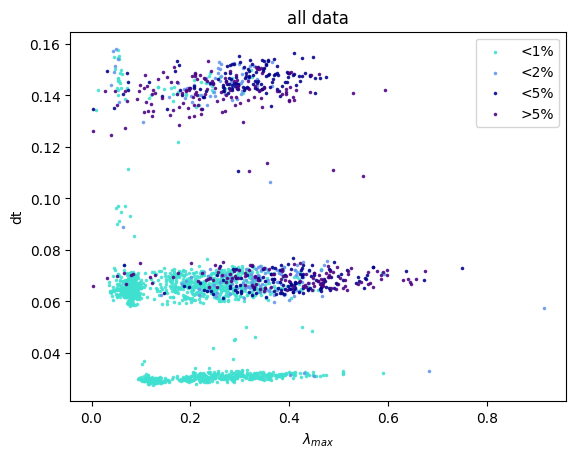

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_dt_2Dfiterr.png




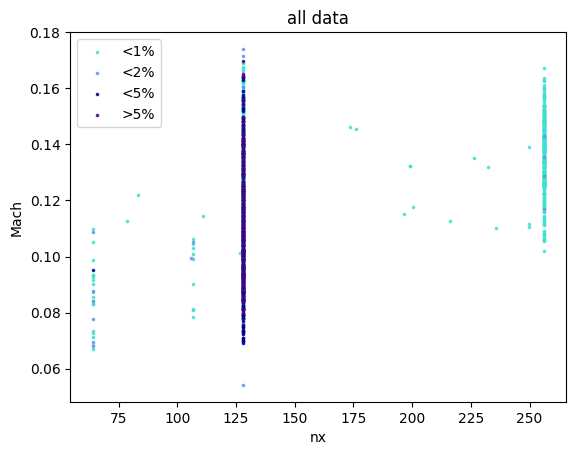

saved all data to /home/julian/BAoffline/img/all_data_nx_urms_2Dfiterr.png




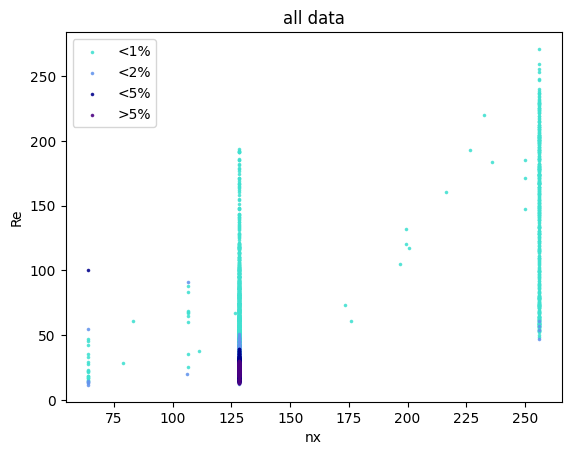

saved all data to /home/julian/BAoffline/img/all_data_nx_re_2Dfiterr.png




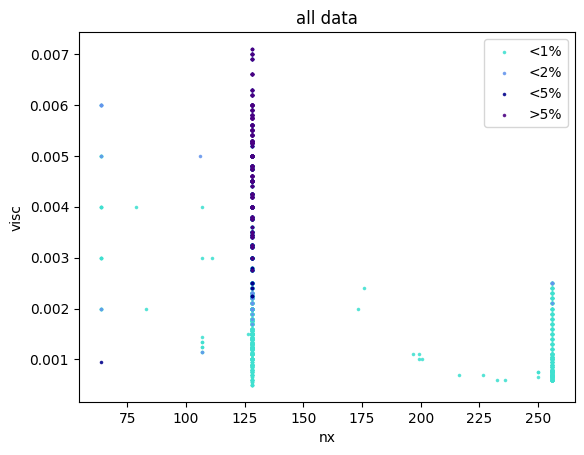

saved all data to /home/julian/BAoffline/img/all_data_nx_v_2Dfiterr.png




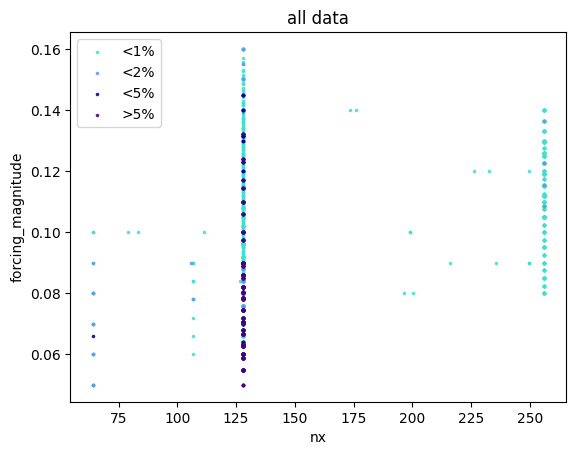

saved all data to /home/julian/BAoffline/img/all_data_nx_f_2Dfiterr.png




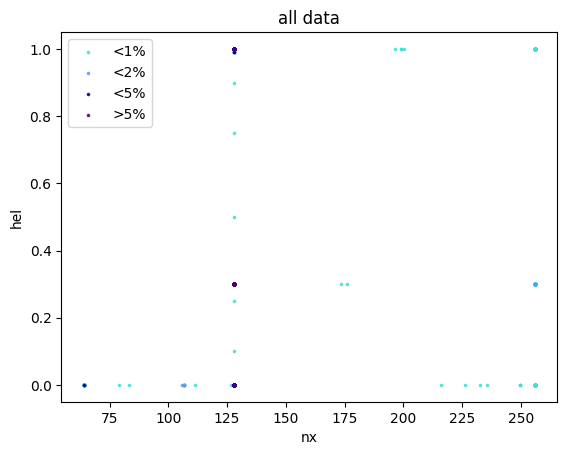

saved all data to /home/julian/BAoffline/img/all_data_nx_hel_2Dfiterr.png




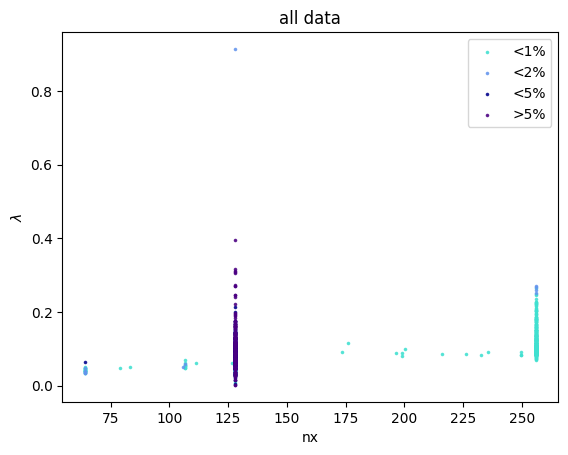

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_2Dfiterr.png




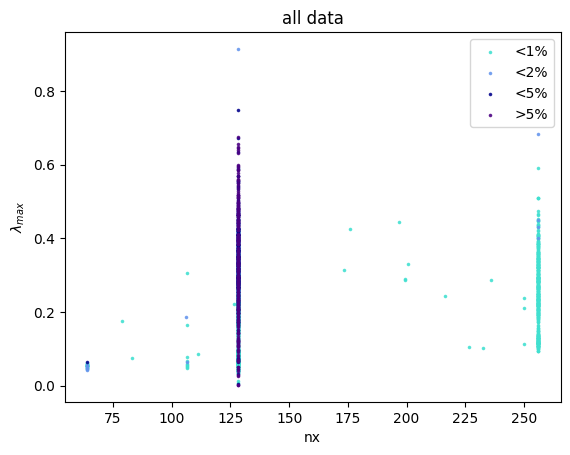

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_max_2Dfiterr.png




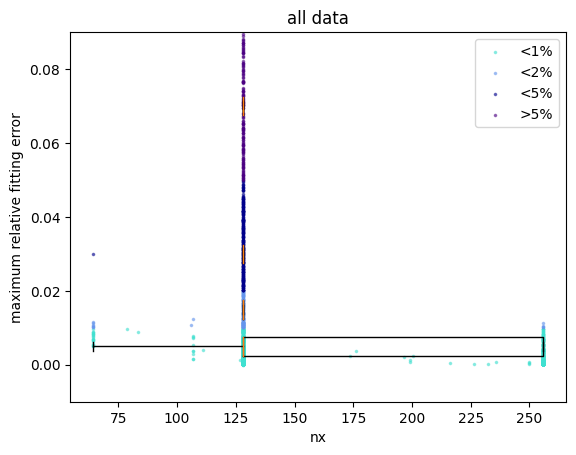

saved all data to /home/julian/BAoffline/img/all_data_nx_1Dfiterr.png




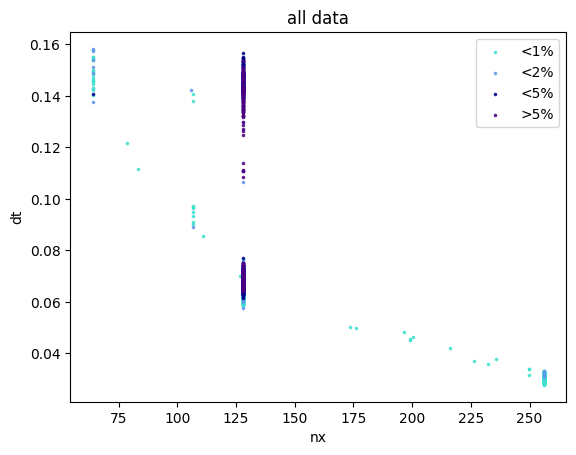

saved all data to /home/julian/BAoffline/img/all_data_nx_dt_2Dfiterr.png




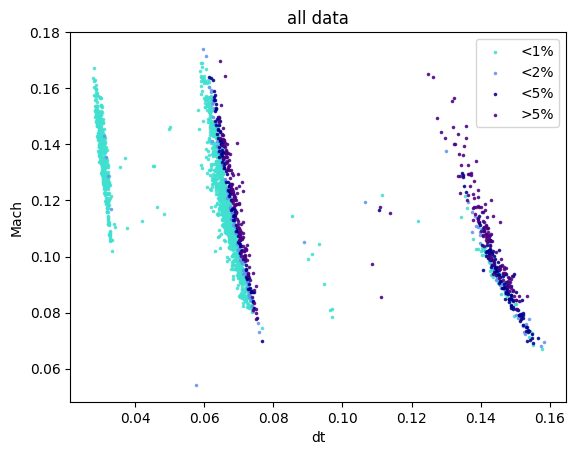

saved all data to /home/julian/BAoffline/img/all_data_dt_urms_2Dfiterr.png




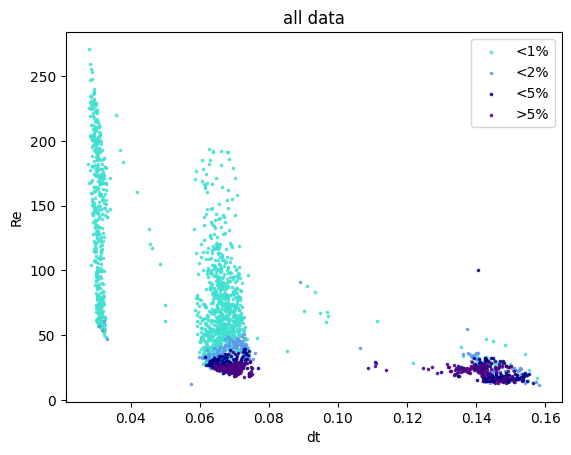

saved all data to /home/julian/BAoffline/img/all_data_dt_re_2Dfiterr.png




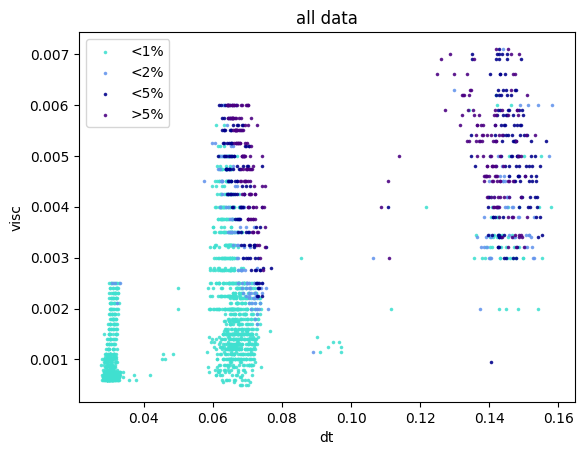

saved all data to /home/julian/BAoffline/img/all_data_dt_v_2Dfiterr.png




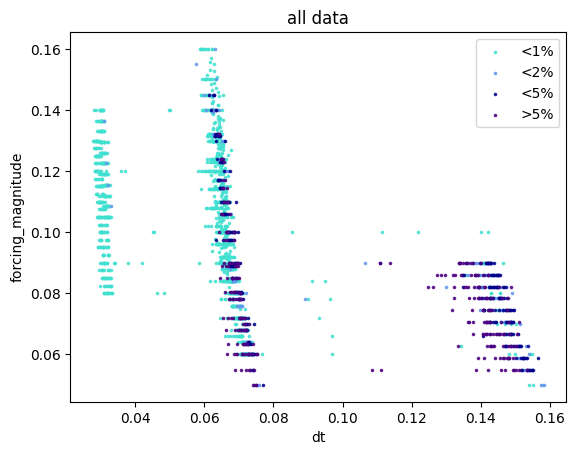

saved all data to /home/julian/BAoffline/img/all_data_dt_f_2Dfiterr.png




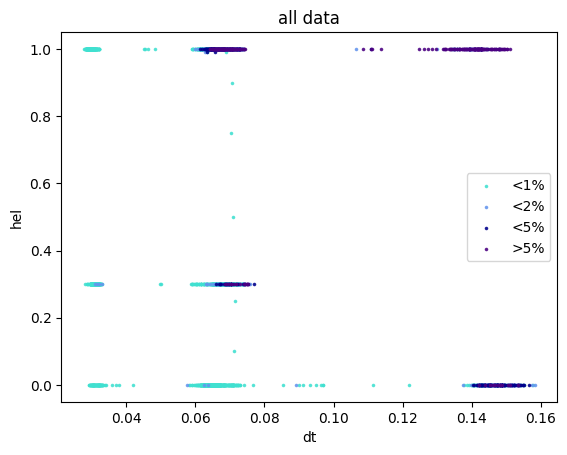

saved all data to /home/julian/BAoffline/img/all_data_dt_hel_2Dfiterr.png




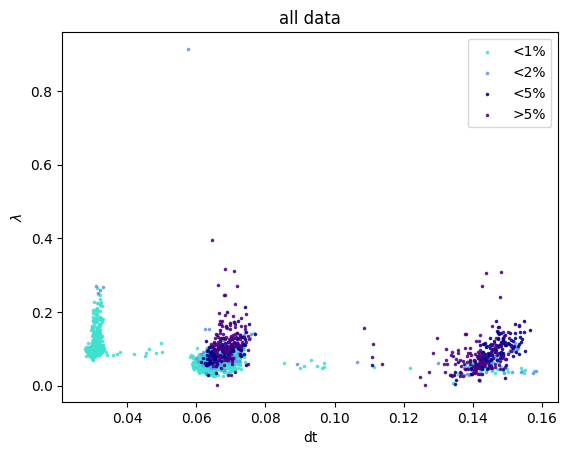

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_2Dfiterr.png




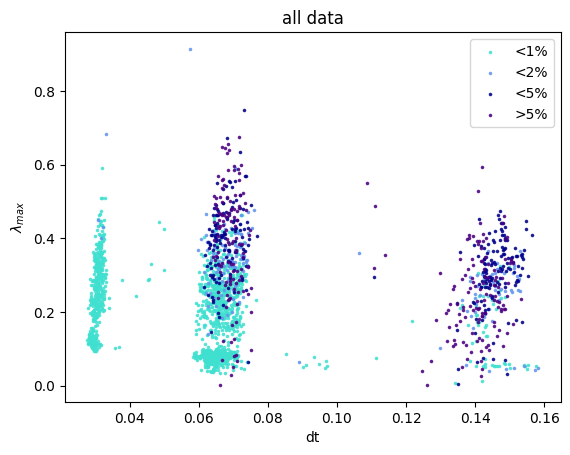

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_max_2Dfiterr.png




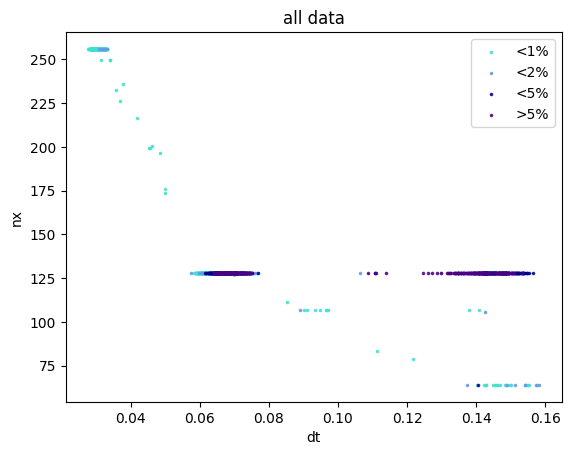

saved all data to /home/julian/BAoffline/img/all_data_dt_nx_2Dfiterr.png




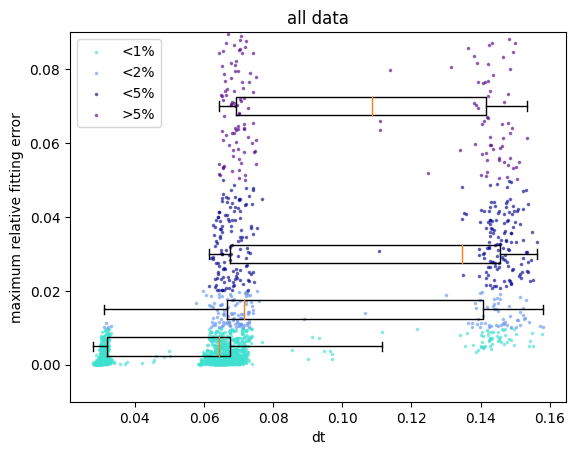

saved all data to /home/julian/BAoffline/img/all_data_dt_1Dfiterr.png




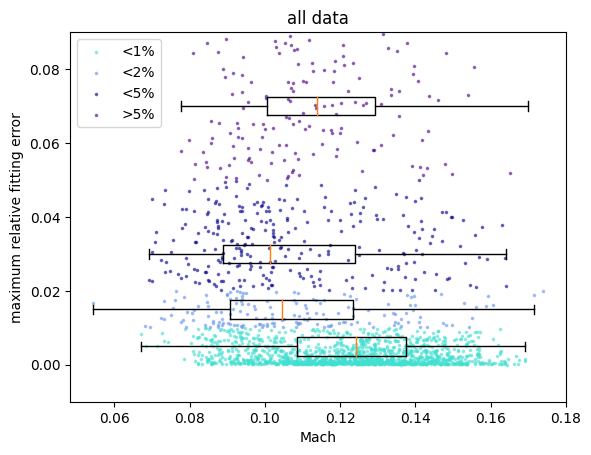

saved all data to /home/julian/BAoffline/img/all_data_urms_1Dfiterr.png




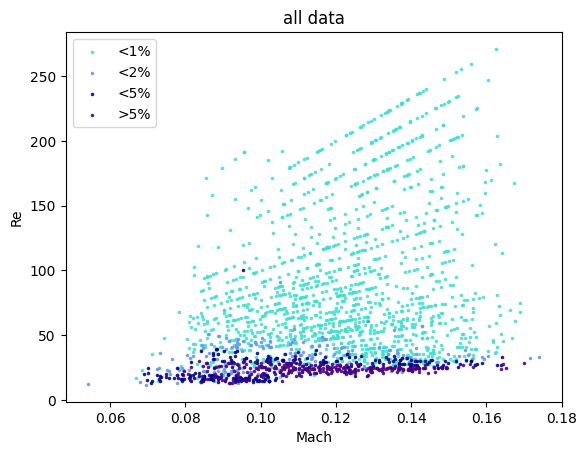

saved all data to /home/julian/BAoffline/img/all_data_urms_re_2Dfiterr.png




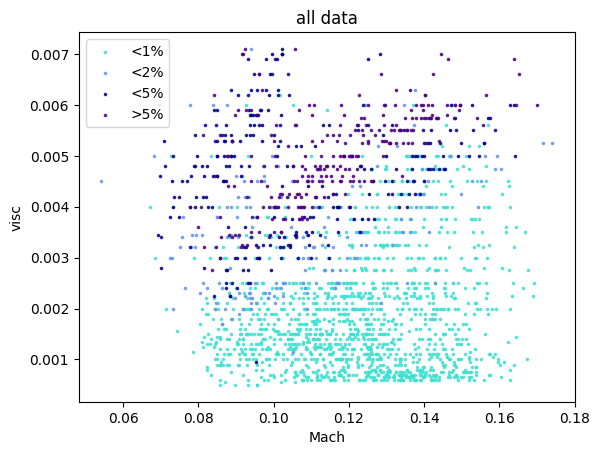

saved all data to /home/julian/BAoffline/img/all_data_urms_v_2Dfiterr.png




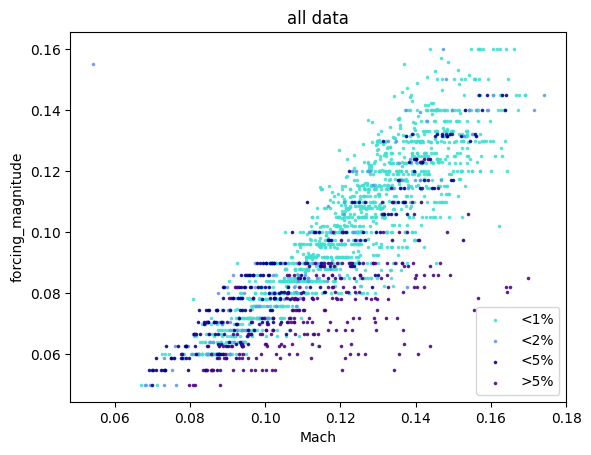

saved all data to /home/julian/BAoffline/img/all_data_urms_f_2Dfiterr.png




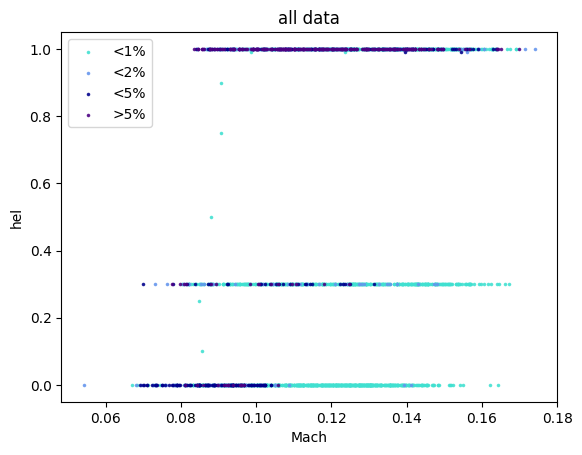

saved all data to /home/julian/BAoffline/img/all_data_urms_hel_2Dfiterr.png




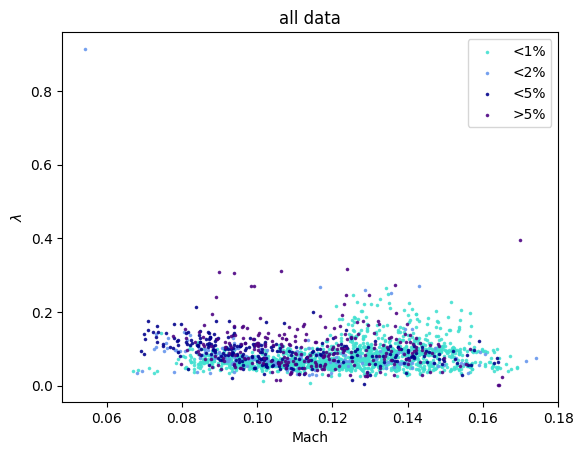

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_2Dfiterr.png




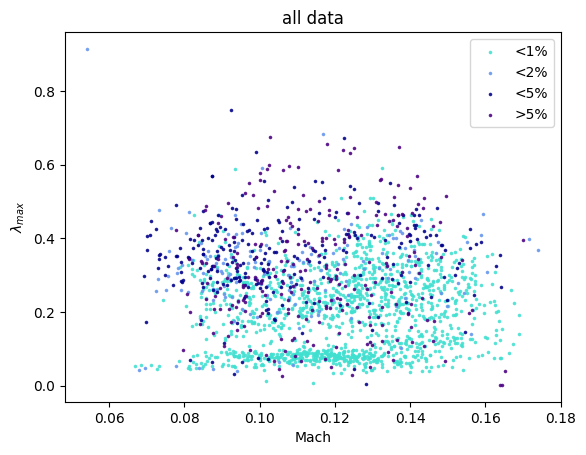

saved all data to /home/julian/BAoffline/img/all_data_urms_lmb_max_2Dfiterr.png




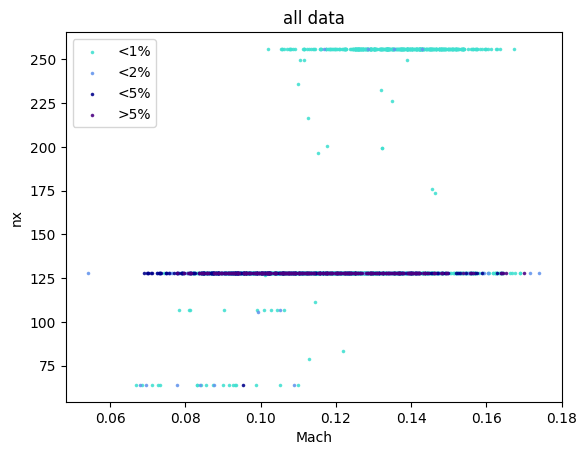

saved all data to /home/julian/BAoffline/img/all_data_urms_nx_2Dfiterr.png




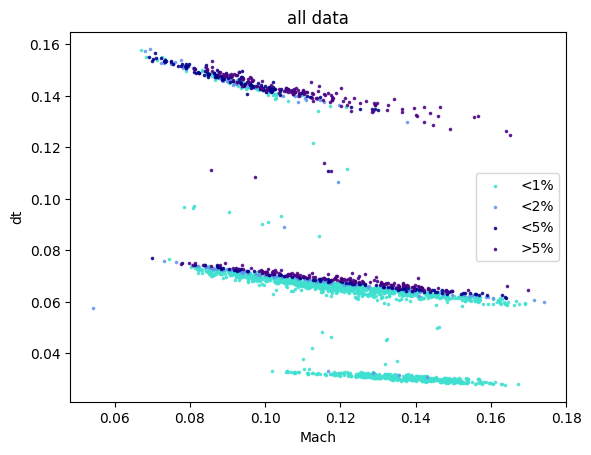

saved all data to /home/julian/BAoffline/img/all_data_urms_dt_2Dfiterr.png




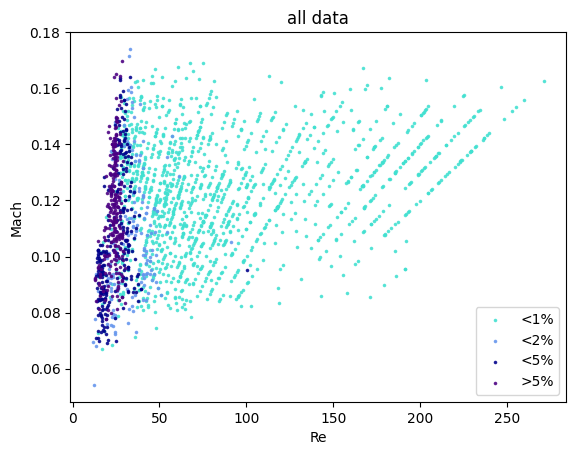

saved all data to /home/julian/BAoffline/img/all_data_re_urms_2Dfiterr.png




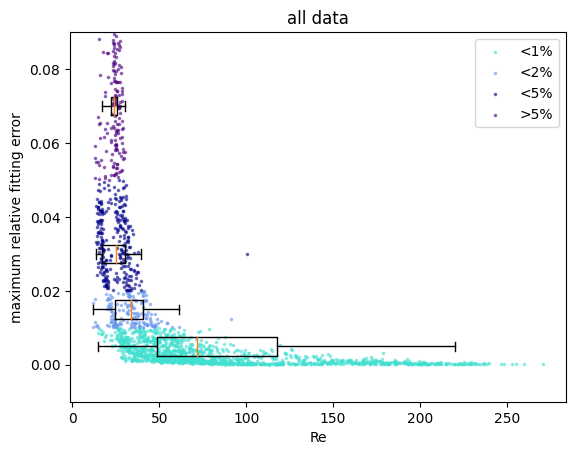

saved all data to /home/julian/BAoffline/img/all_data_re_1Dfiterr.png




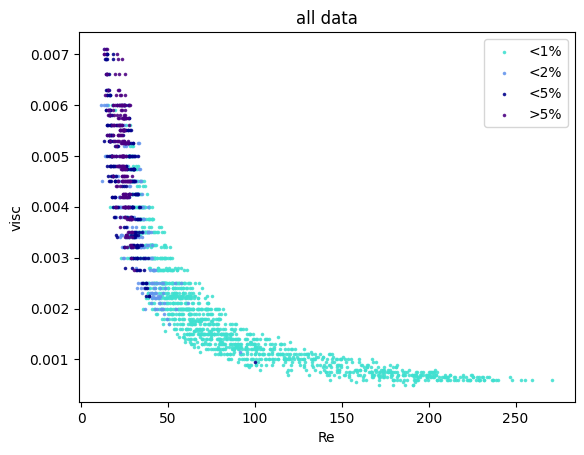

saved all data to /home/julian/BAoffline/img/all_data_re_v_2Dfiterr.png




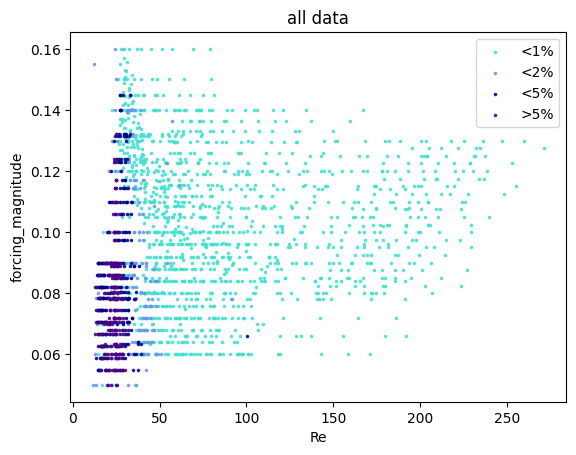

saved all data to /home/julian/BAoffline/img/all_data_re_f_2Dfiterr.png




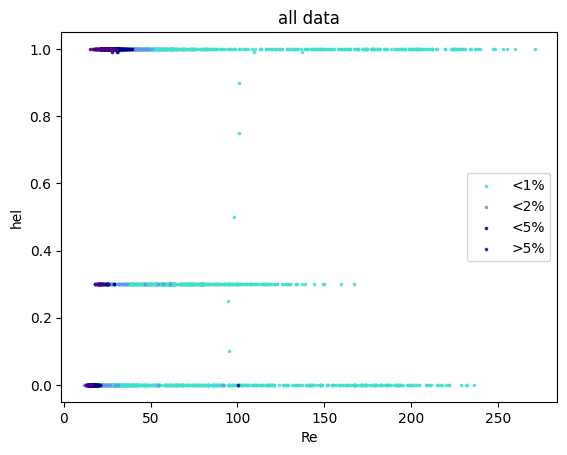

saved all data to /home/julian/BAoffline/img/all_data_re_hel_2Dfiterr.png




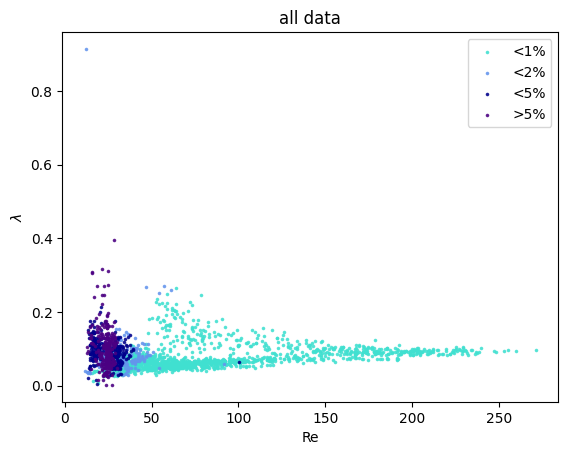

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_2Dfiterr.png




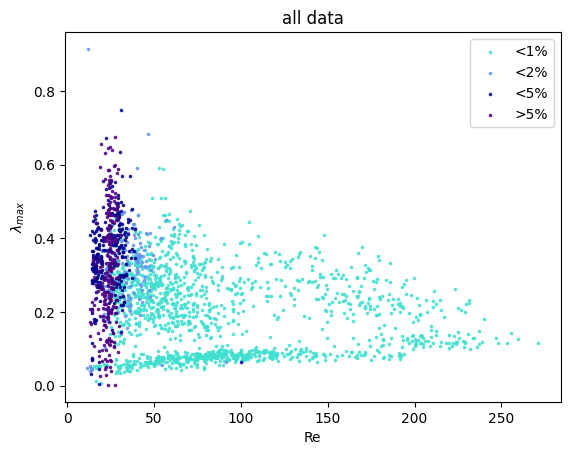

saved all data to /home/julian/BAoffline/img/all_data_re_lmb_max_2Dfiterr.png




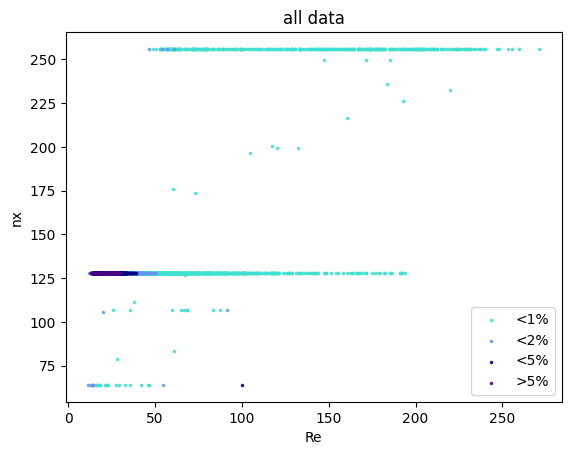

saved all data to /home/julian/BAoffline/img/all_data_re_nx_2Dfiterr.png




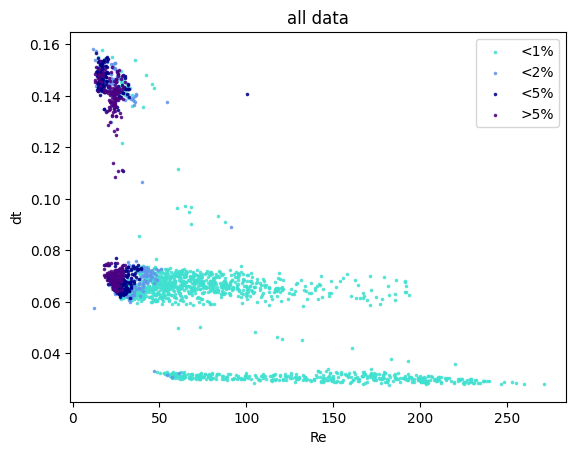

saved all data to /home/julian/BAoffline/img/all_data_re_dt_2Dfiterr.png




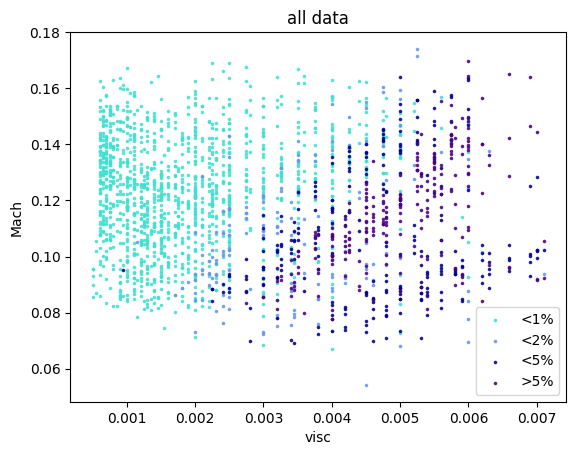

saved all data to /home/julian/BAoffline/img/all_data_v_urms_2Dfiterr.png




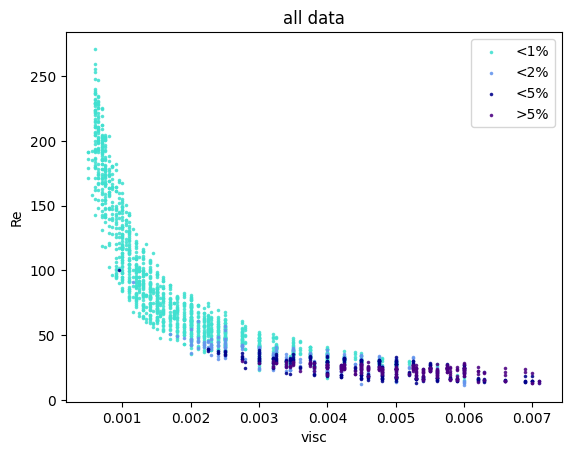

saved all data to /home/julian/BAoffline/img/all_data_v_re_2Dfiterr.png




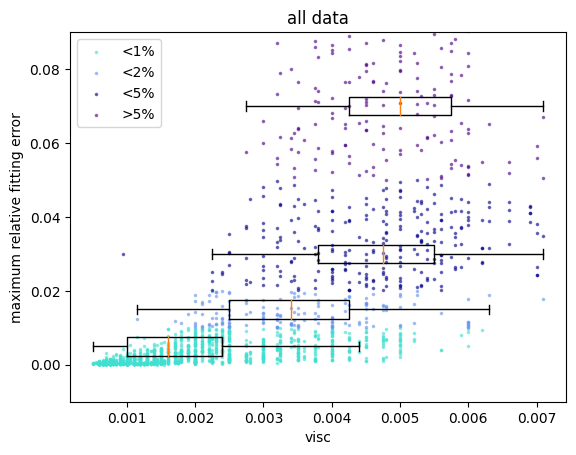

saved all data to /home/julian/BAoffline/img/all_data_v_1Dfiterr.png




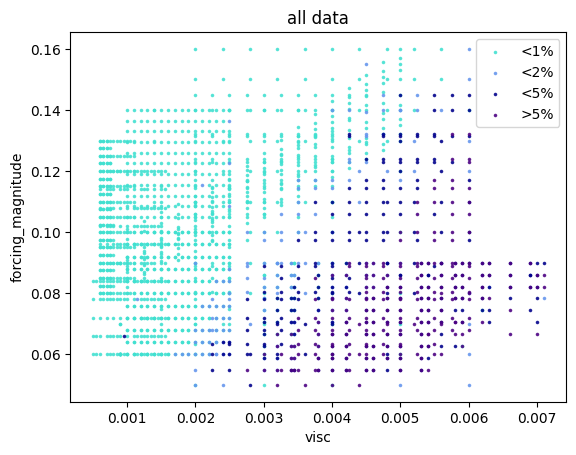

saved all data to /home/julian/BAoffline/img/all_data_v_f_2Dfiterr.png




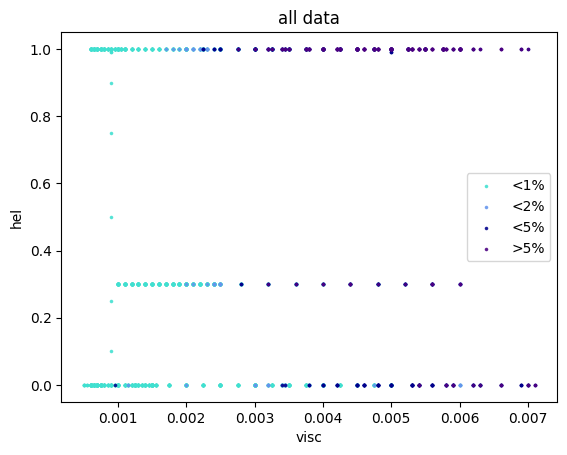

saved all data to /home/julian/BAoffline/img/all_data_v_hel_2Dfiterr.png




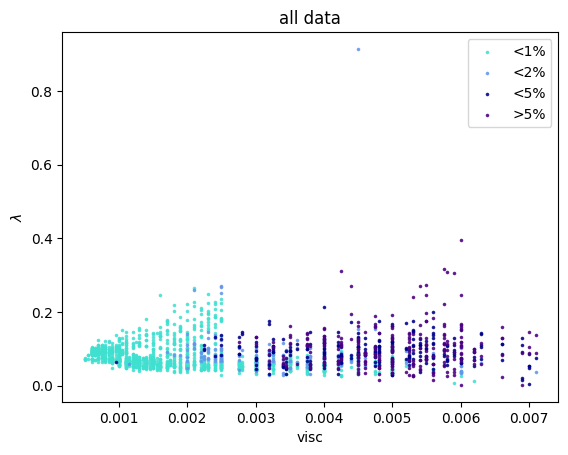

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_2Dfiterr.png




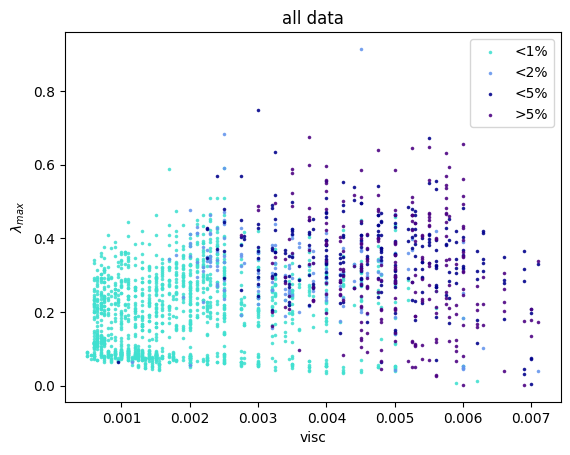

saved all data to /home/julian/BAoffline/img/all_data_v_lmb_max_2Dfiterr.png




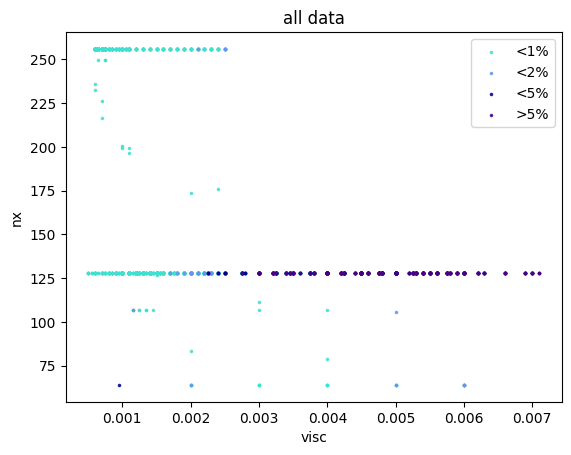

saved all data to /home/julian/BAoffline/img/all_data_v_nx_2Dfiterr.png




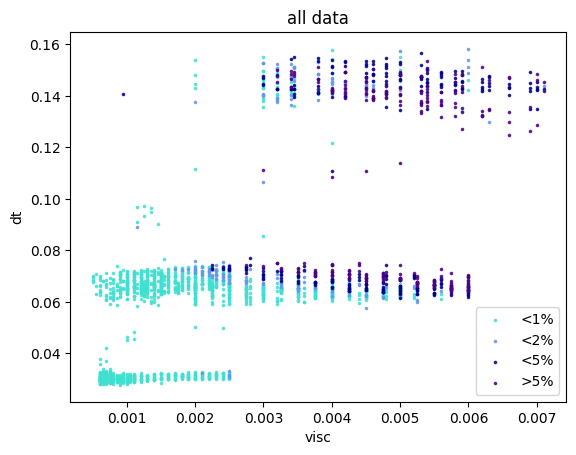

saved all data to /home/julian/BAoffline/img/all_data_v_dt_2Dfiterr.png




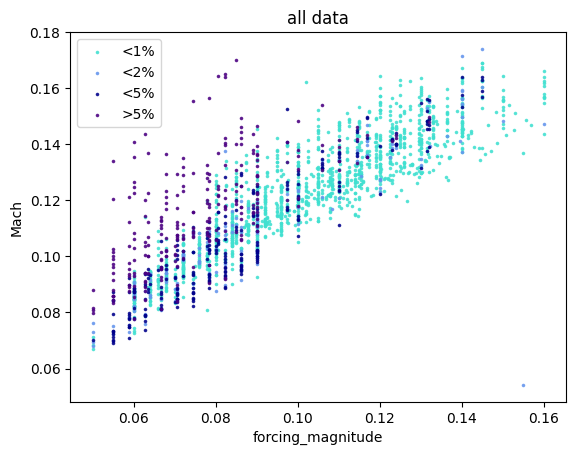

saved all data to /home/julian/BAoffline/img/all_data_f_urms_2Dfiterr.png




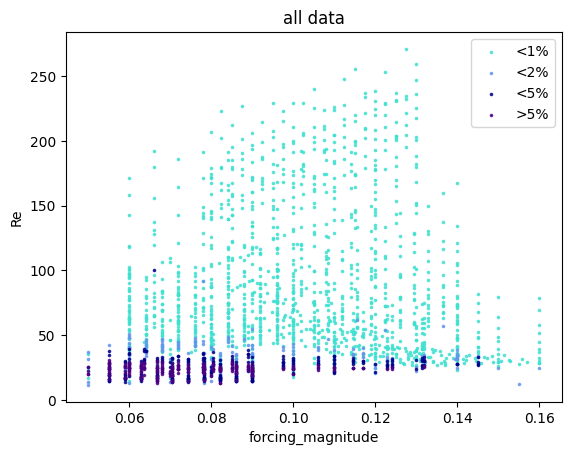

saved all data to /home/julian/BAoffline/img/all_data_f_re_2Dfiterr.png




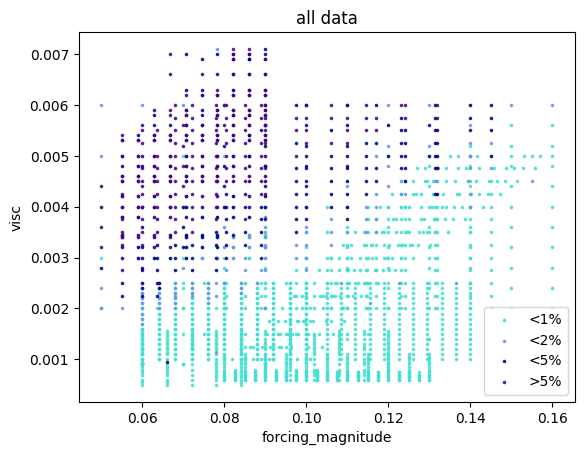

saved all data to /home/julian/BAoffline/img/all_data_f_v_2Dfiterr.png




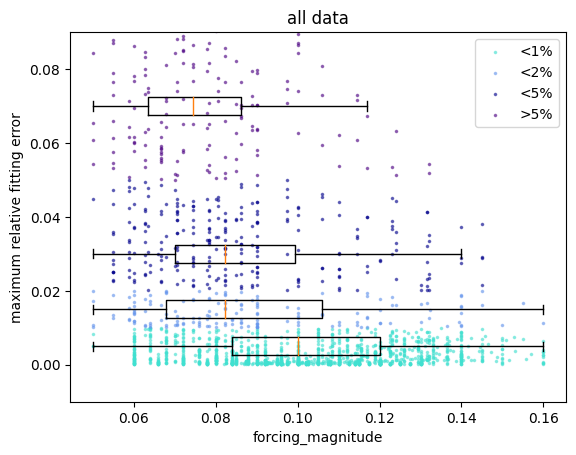

saved all data to /home/julian/BAoffline/img/all_data_f_1Dfiterr.png




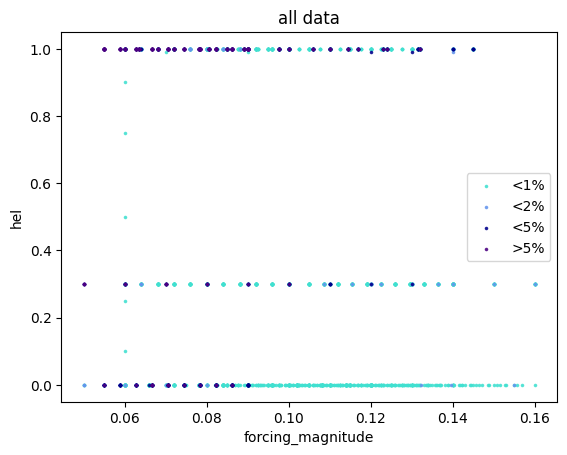

saved all data to /home/julian/BAoffline/img/all_data_f_hel_2Dfiterr.png




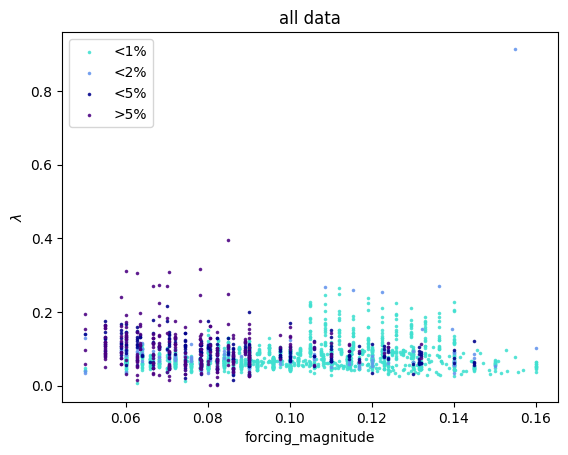

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_2Dfiterr.png




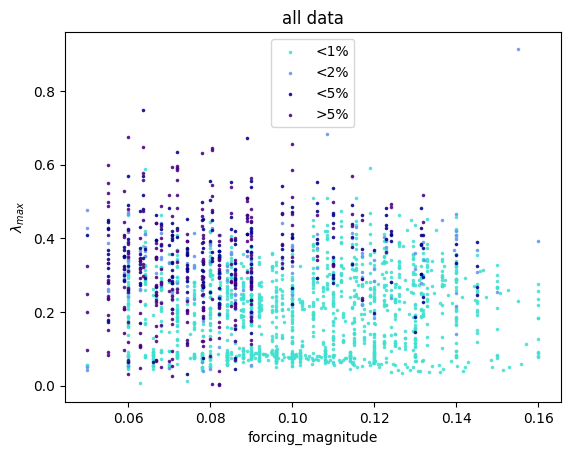

saved all data to /home/julian/BAoffline/img/all_data_f_lmb_max_2Dfiterr.png




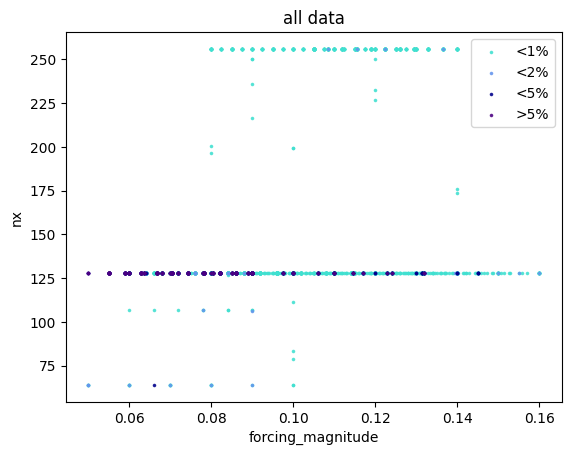

saved all data to /home/julian/BAoffline/img/all_data_f_nx_2Dfiterr.png




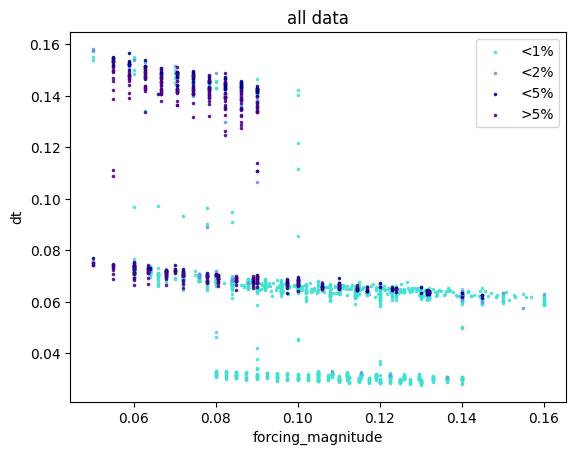

saved all data to /home/julian/BAoffline/img/all_data_f_dt_2Dfiterr.png




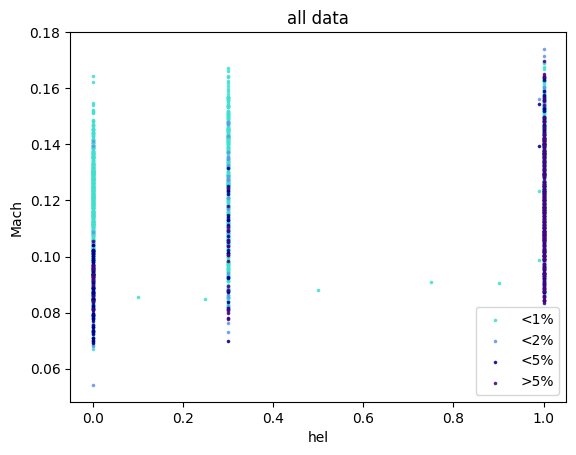

saved all data to /home/julian/BAoffline/img/all_data_hel_urms_2Dfiterr.png




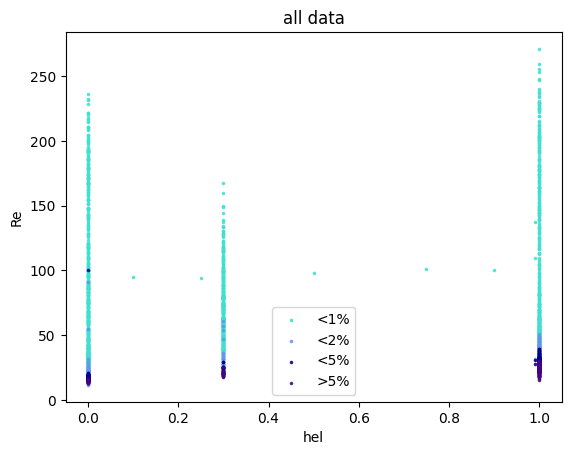

saved all data to /home/julian/BAoffline/img/all_data_hel_re_2Dfiterr.png




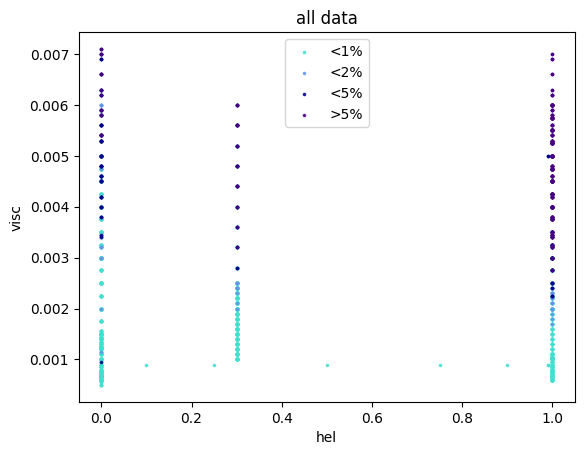

saved all data to /home/julian/BAoffline/img/all_data_hel_v_2Dfiterr.png




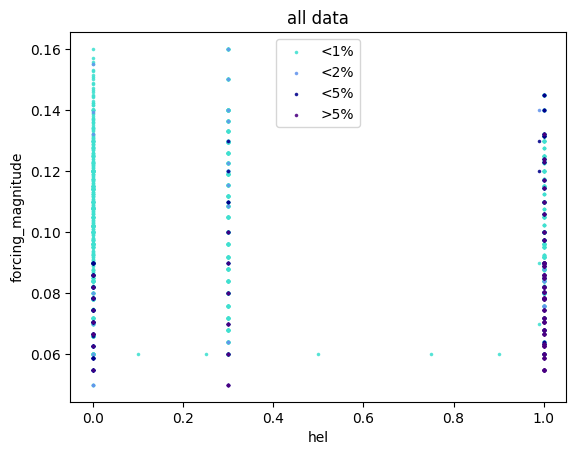

saved all data to /home/julian/BAoffline/img/all_data_hel_f_2Dfiterr.png




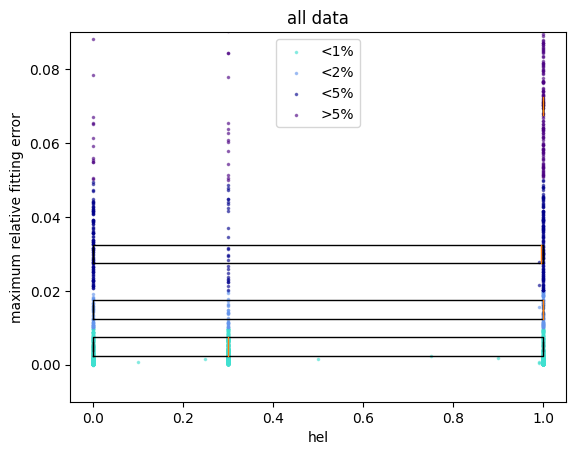

saved all data to /home/julian/BAoffline/img/all_data_hel_1Dfiterr.png




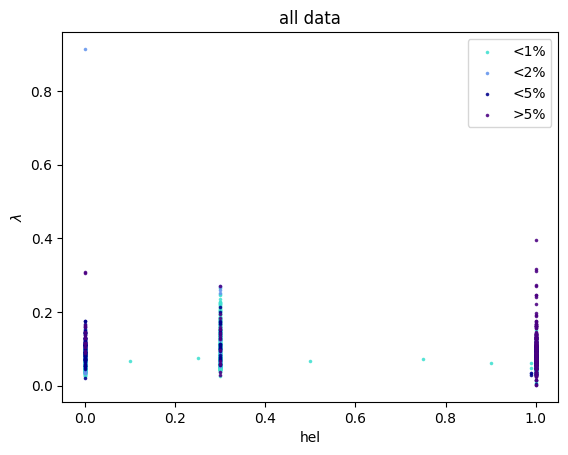

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_2Dfiterr.png




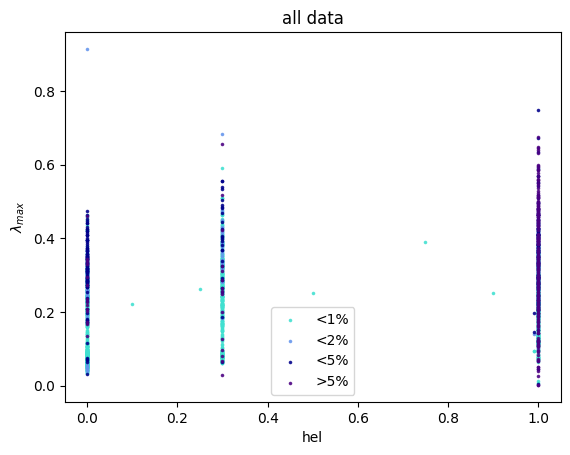

saved all data to /home/julian/BAoffline/img/all_data_hel_lmb_max_2Dfiterr.png




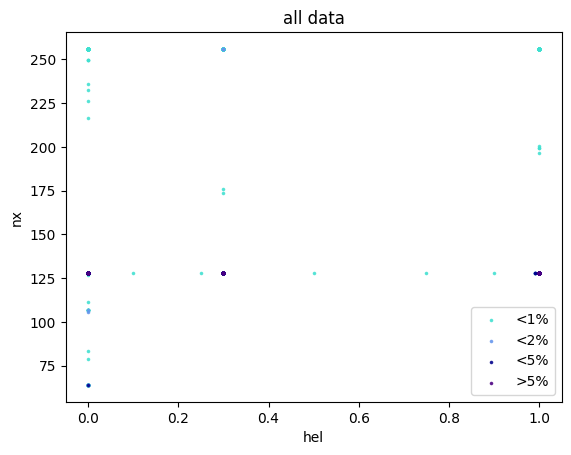

saved all data to /home/julian/BAoffline/img/all_data_hel_nx_2Dfiterr.png




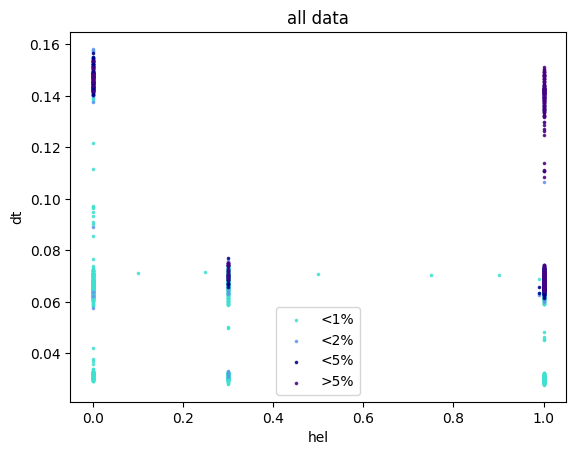

saved all data to /home/julian/BAoffline/img/all_data_hel_dt_2Dfiterr.png




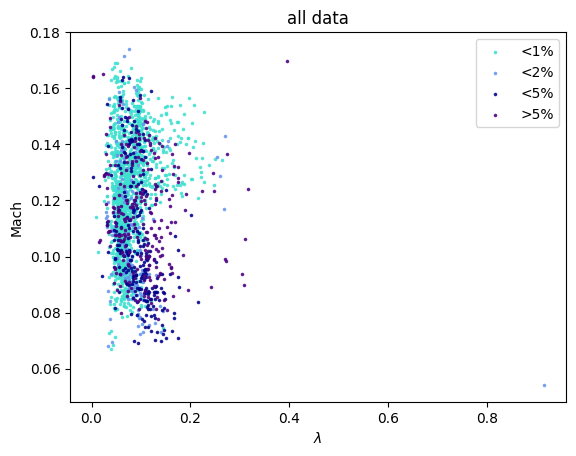

saved all data to /home/julian/BAoffline/img/all_data_lmb_urms_2Dfiterr.png




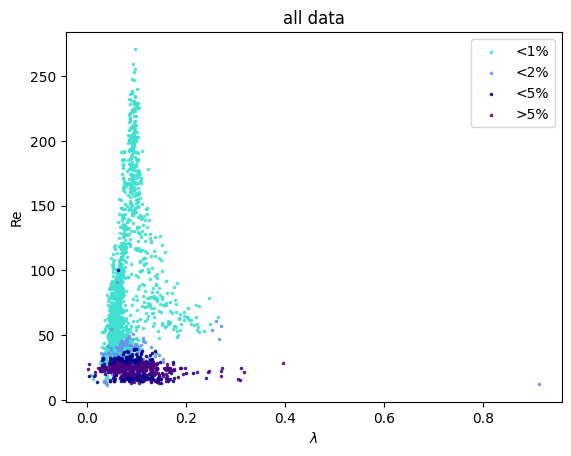

saved all data to /home/julian/BAoffline/img/all_data_lmb_re_2Dfiterr.png




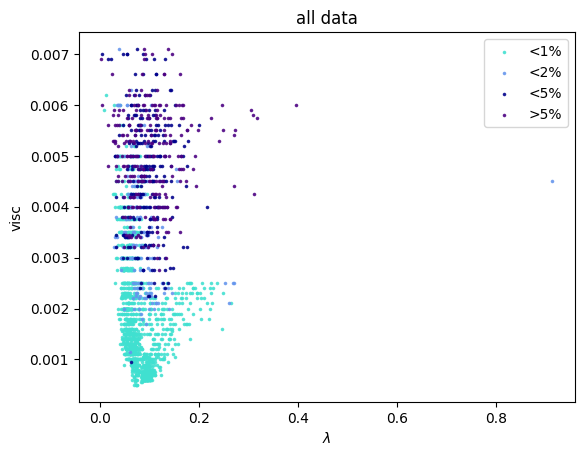

saved all data to /home/julian/BAoffline/img/all_data_lmb_v_2Dfiterr.png




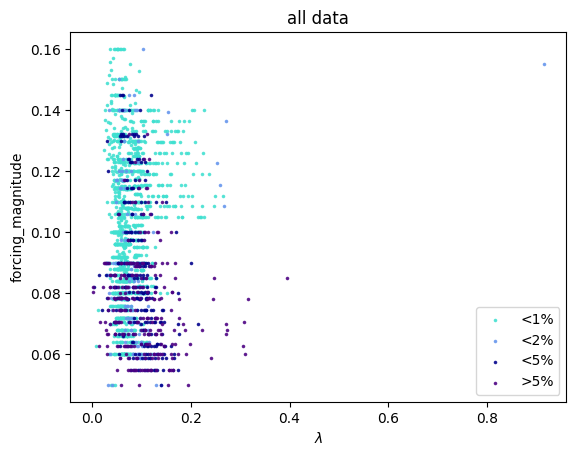

saved all data to /home/julian/BAoffline/img/all_data_lmb_f_2Dfiterr.png




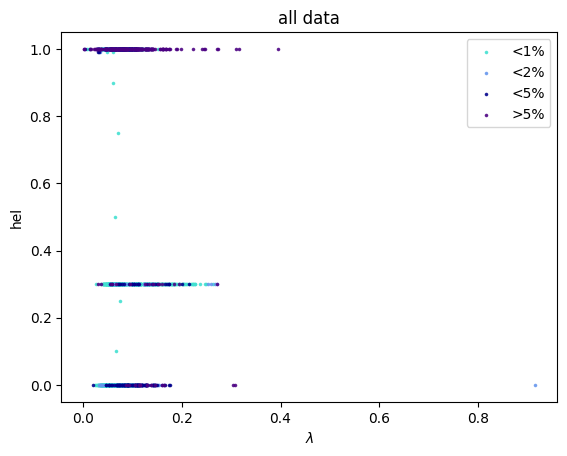

saved all data to /home/julian/BAoffline/img/all_data_lmb_hel_2Dfiterr.png




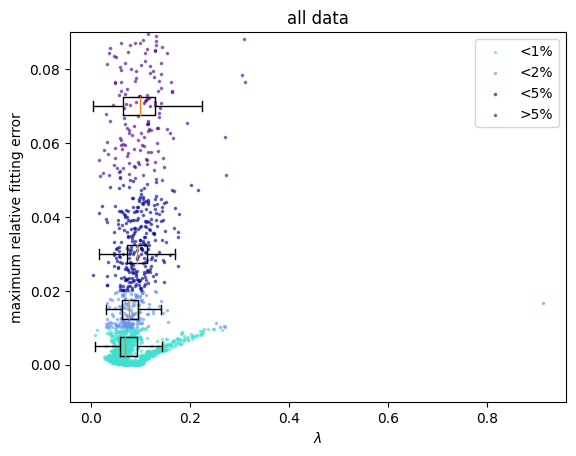

saved all data to /home/julian/BAoffline/img/all_data_lmb_1Dfiterr.png




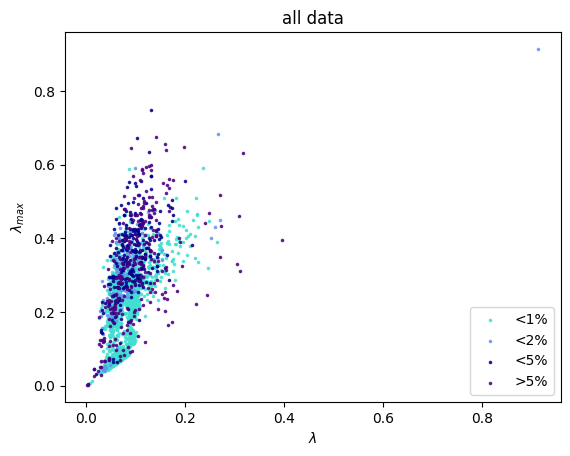

saved all data to /home/julian/BAoffline/img/all_data_lmb_lmb_max_2Dfiterr.png




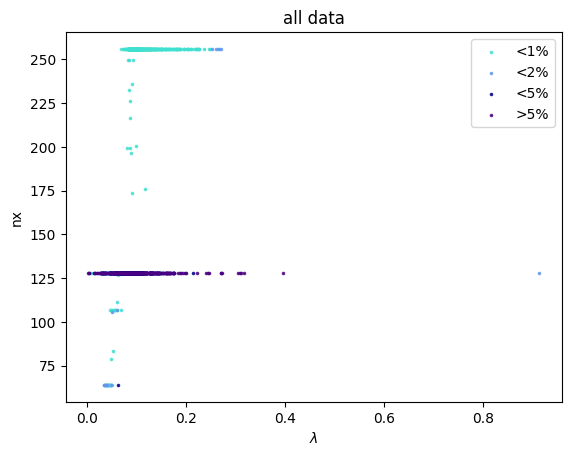

saved all data to /home/julian/BAoffline/img/all_data_lmb_nx_2Dfiterr.png




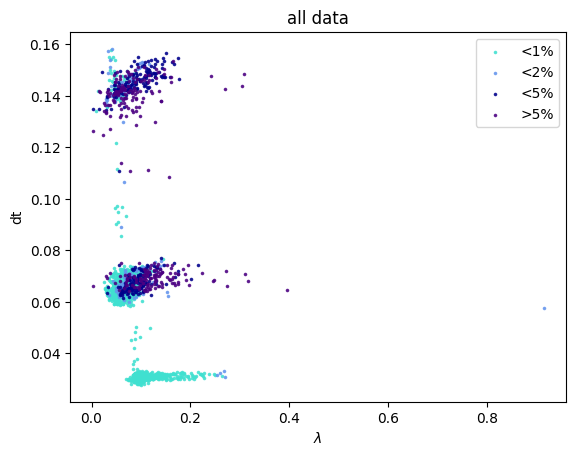

saved all data to /home/julian/BAoffline/img/all_data_lmb_dt_2Dfiterr.png




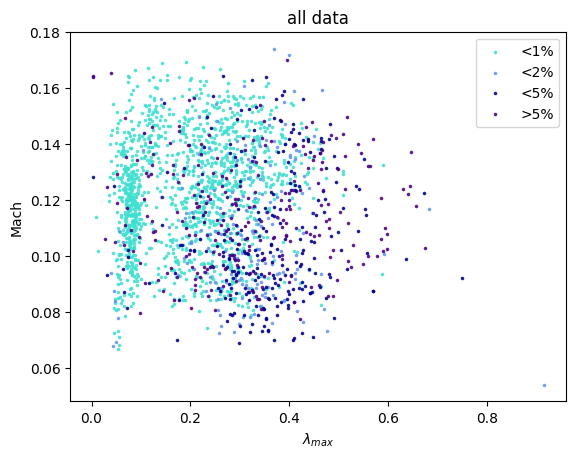

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_urms_2Dfiterr.png




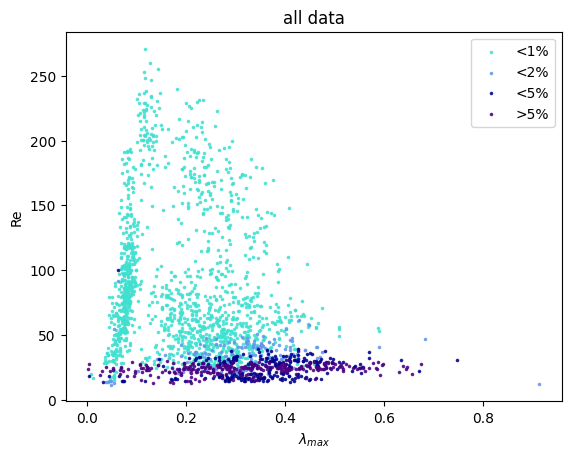

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_re_2Dfiterr.png




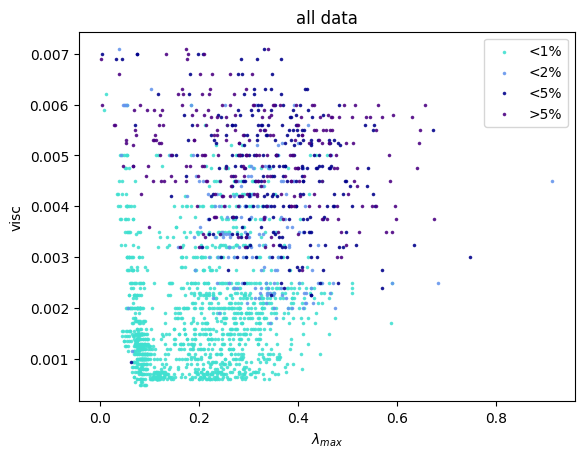

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_v_2Dfiterr.png




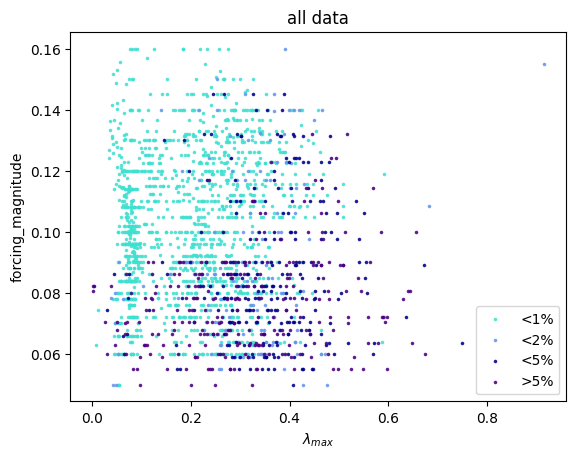

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_f_2Dfiterr.png




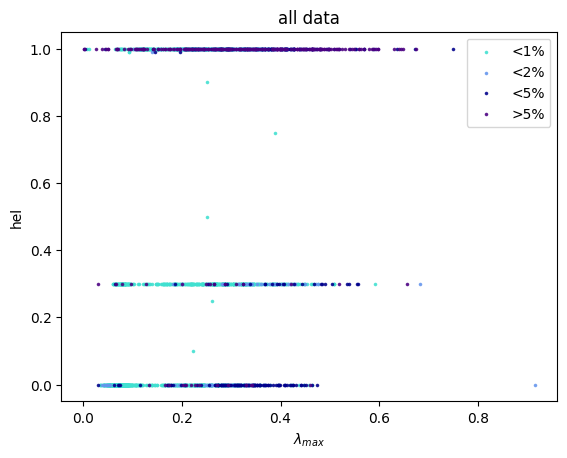

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_hel_2Dfiterr.png




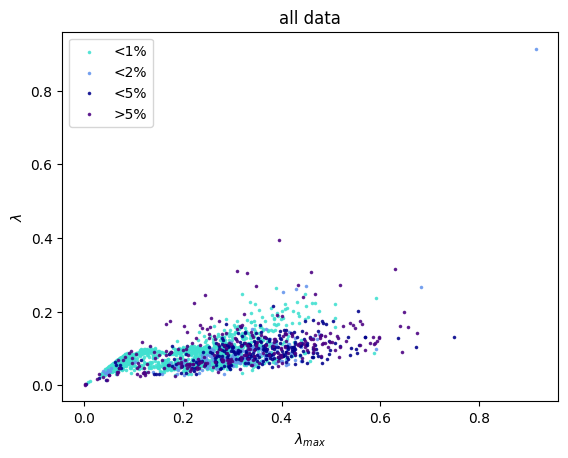

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_lmb_2Dfiterr.png




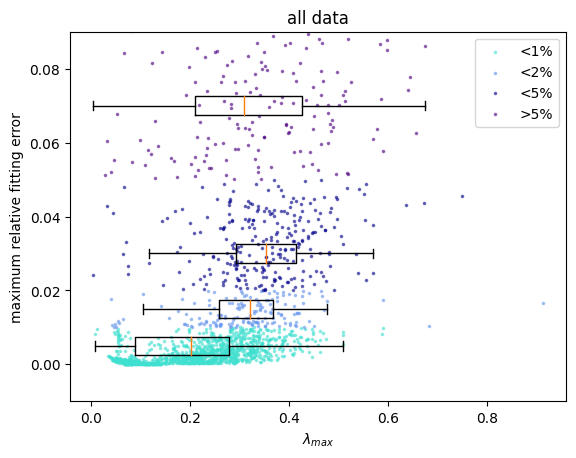

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_1Dfiterr.png




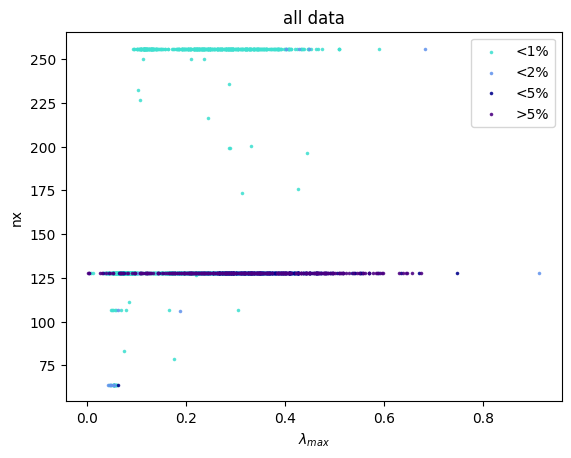

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_nx_2Dfiterr.png




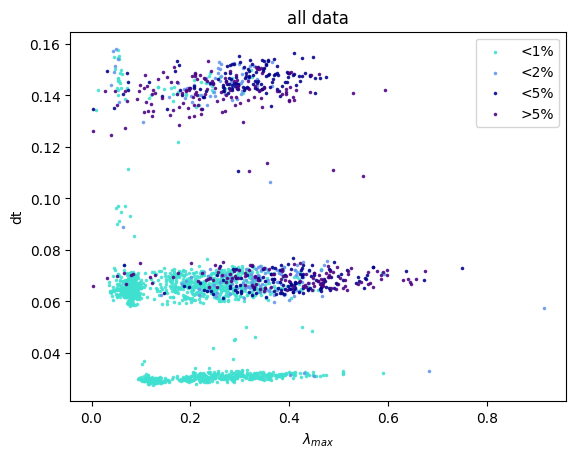

saved all data to /home/julian/BAoffline/img/all_data_lmb_max_dt_2Dfiterr.png




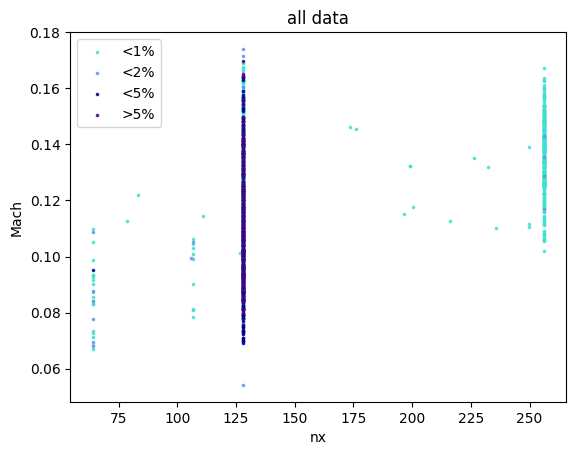

saved all data to /home/julian/BAoffline/img/all_data_nx_urms_2Dfiterr.png




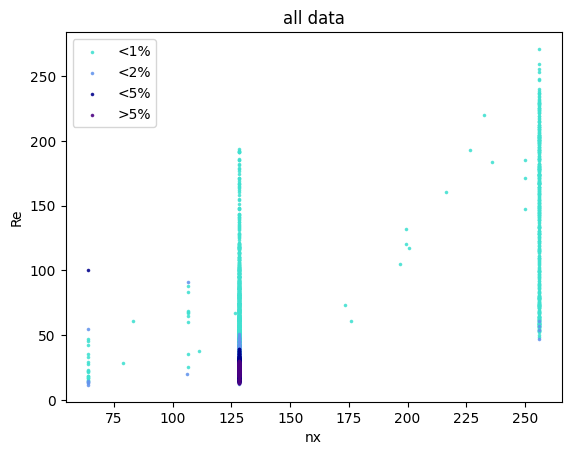

saved all data to /home/julian/BAoffline/img/all_data_nx_re_2Dfiterr.png




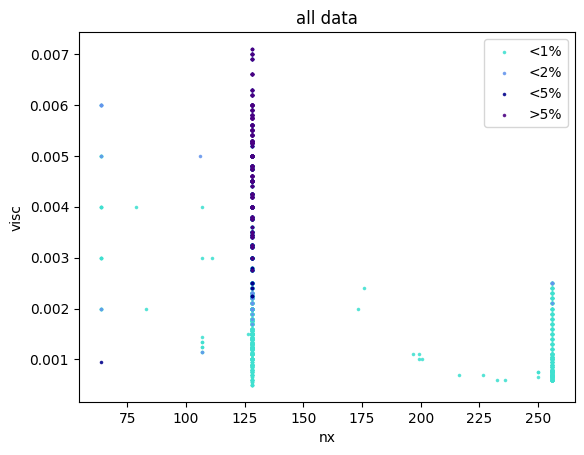

saved all data to /home/julian/BAoffline/img/all_data_nx_v_2Dfiterr.png




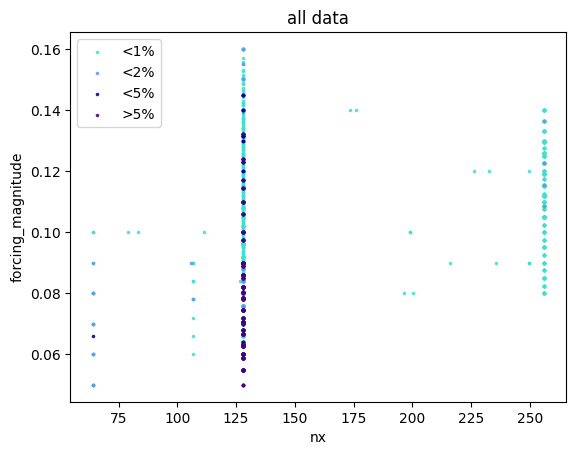

saved all data to /home/julian/BAoffline/img/all_data_nx_f_2Dfiterr.png




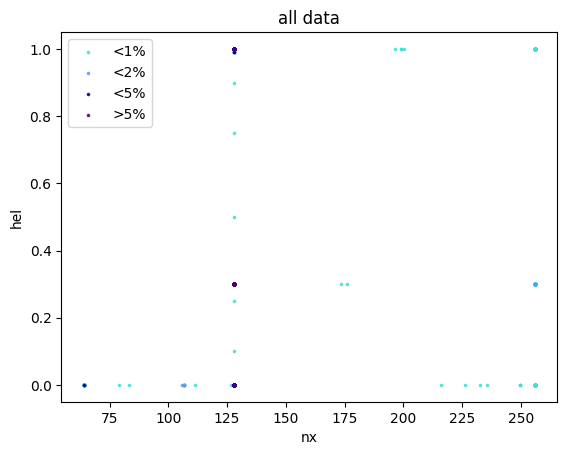

saved all data to /home/julian/BAoffline/img/all_data_nx_hel_2Dfiterr.png




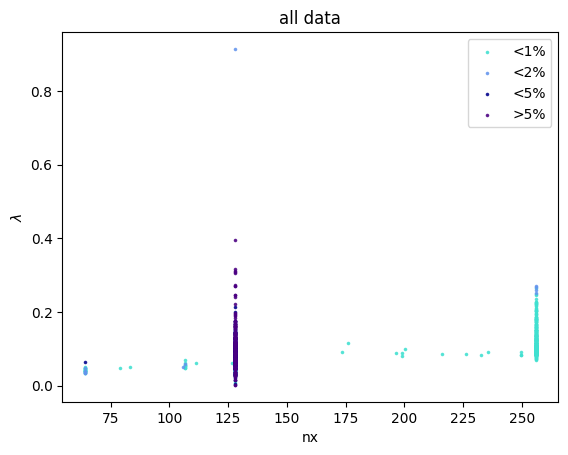

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_2Dfiterr.png




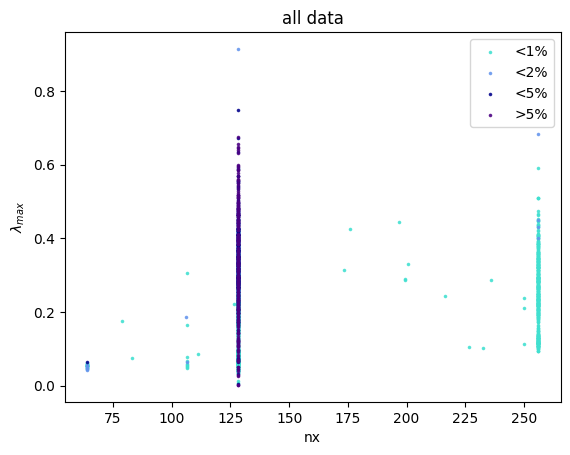

saved all data to /home/julian/BAoffline/img/all_data_nx_lmb_max_2Dfiterr.png




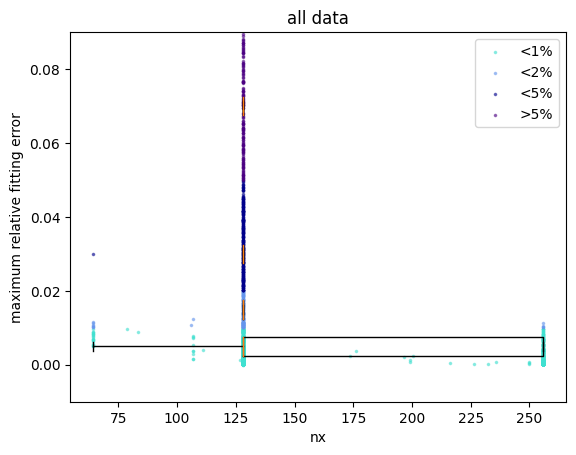

saved all data to /home/julian/BAoffline/img/all_data_nx_1Dfiterr.png




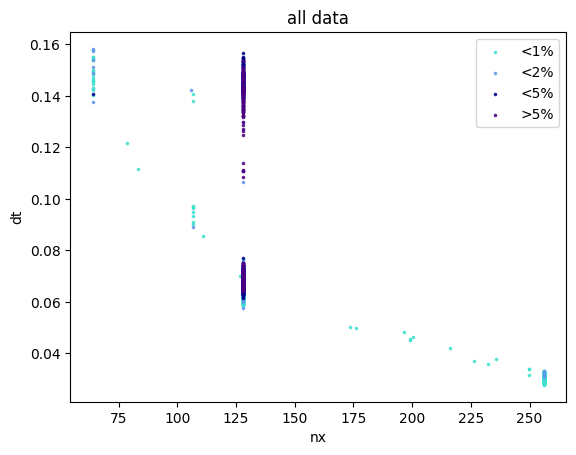

saved all data to /home/julian/BAoffline/img/all_data_nx_dt_2Dfiterr.png




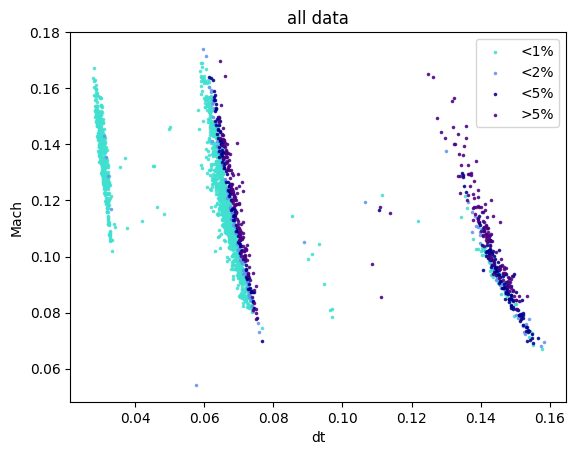

saved all data to /home/julian/BAoffline/img/all_data_dt_urms_2Dfiterr.png




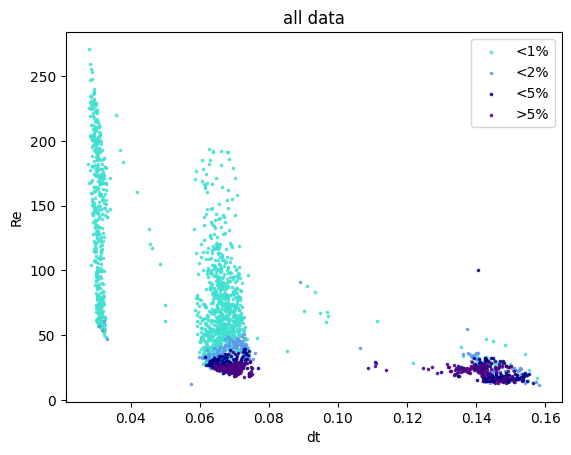

saved all data to /home/julian/BAoffline/img/all_data_dt_re_2Dfiterr.png




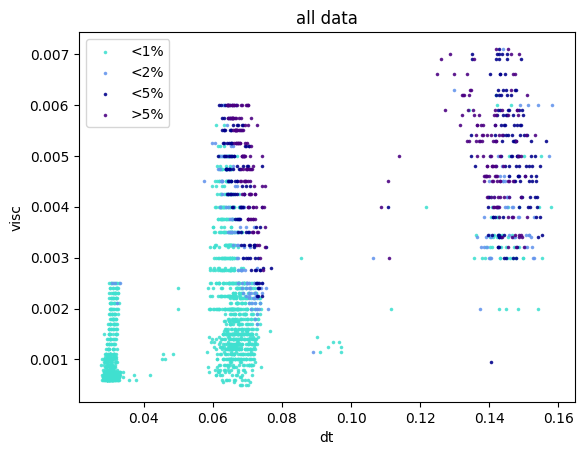

saved all data to /home/julian/BAoffline/img/all_data_dt_v_2Dfiterr.png




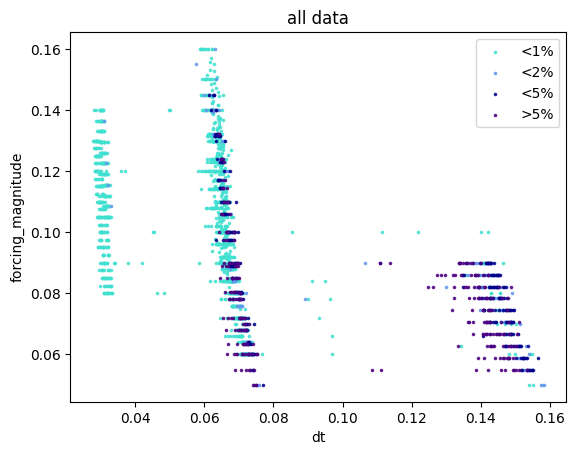

saved all data to /home/julian/BAoffline/img/all_data_dt_f_2Dfiterr.png




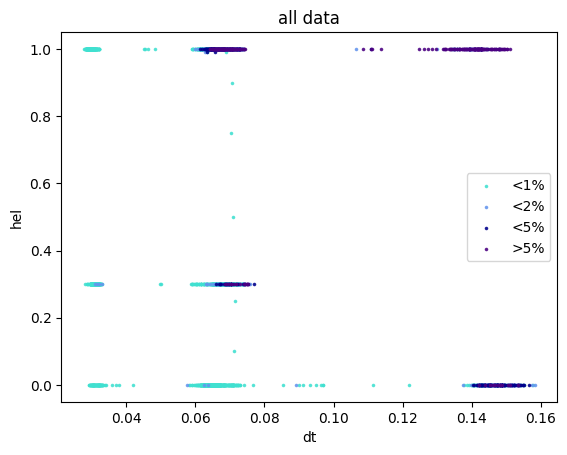

saved all data to /home/julian/BAoffline/img/all_data_dt_hel_2Dfiterr.png




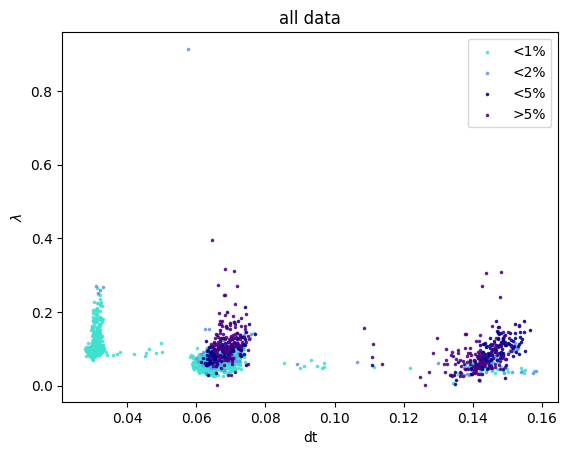

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_2Dfiterr.png




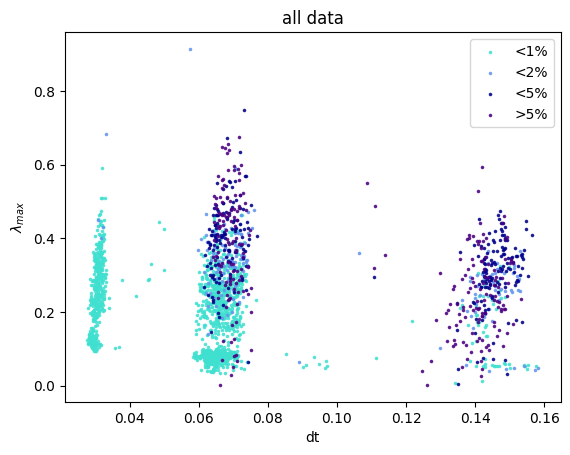

saved all data to /home/julian/BAoffline/img/all_data_dt_lmb_max_2Dfiterr.png




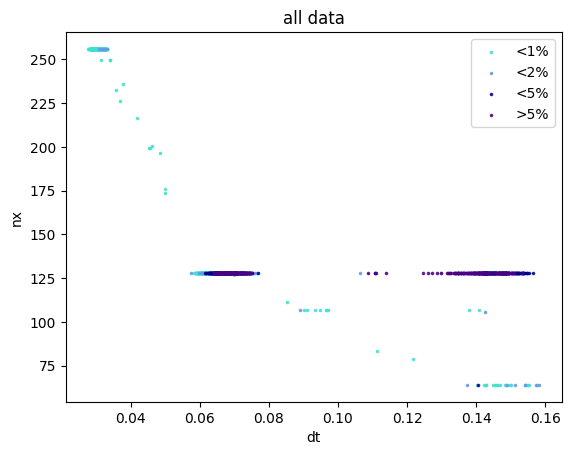

saved all data to /home/julian/BAoffline/img/all_data_dt_nx_2Dfiterr.png




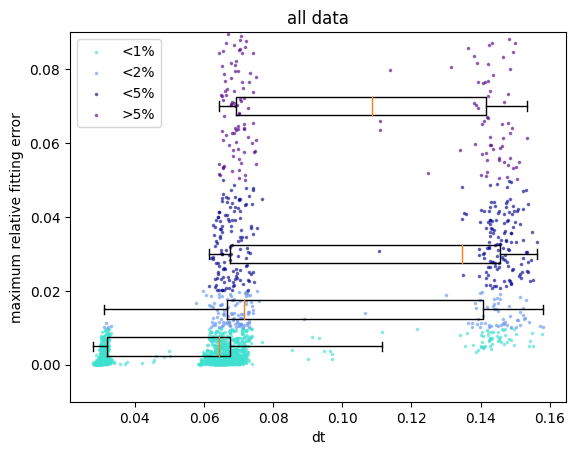

saved all data to /home/julian/BAoffline/img/all_data_dt_1Dfiterr.png




In [19]:
obs_list = ["urms", "re", "v", "f", "hel", "lmb", "lmb_max", "nx", "dt"]
for data in [subset_data(al), subset_data(hel_one), subset_data(hel_zero)]:
    for o1, o2 in it.product(obs_list, repeat=2):
        map_2D_to_fiterr(all_data, o1, o2)

created subset << hel=1.0 >> with  852  datapoints


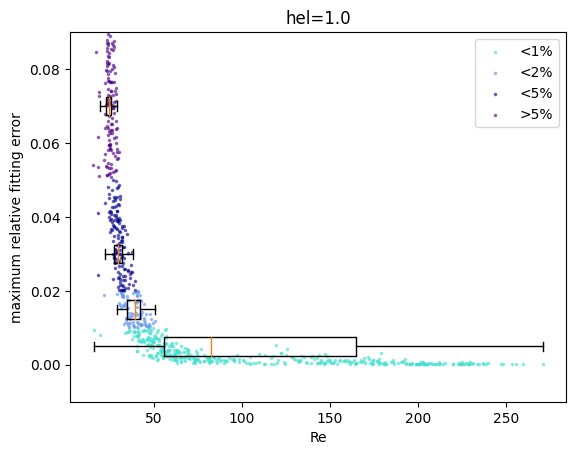

saved hel=1.0 to /home/julian/BAoffline/img/heleq1p0_re_1Dfiterr.png


created subset << hel=0.0 >> with  728  datapoints


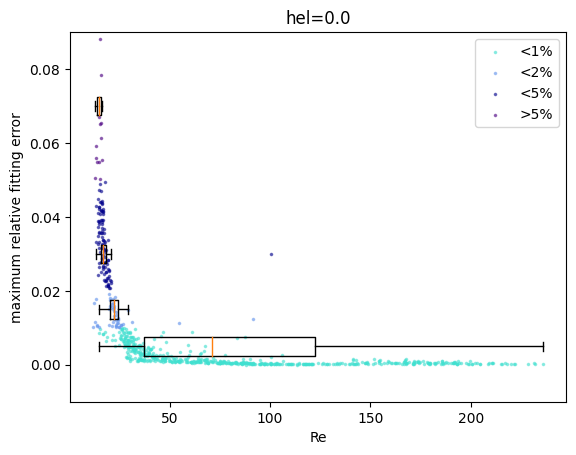

saved hel=0.0 to /home/julian/BAoffline/img/heleq0p0_re_1Dfiterr.png


created subset << hel=1.0 and nx=256 >> with  166  datapoints


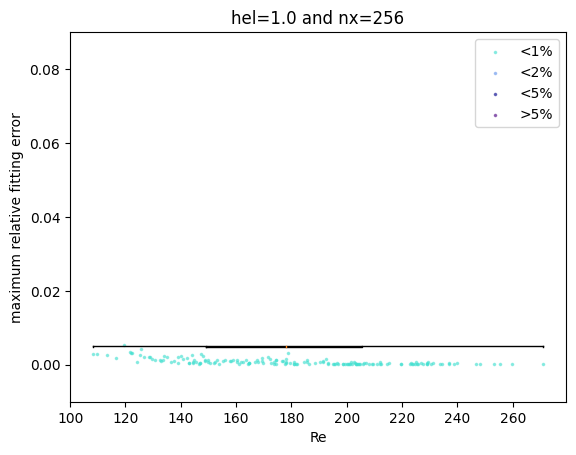

saved hel=1.0 and nx=256 to /home/julian/BAoffline/img/heleq1p0_and_nxeq256_re_1Dfiterr.png




In [20]:
map_1D_to_fiterr(subset_data(hel_one), "re")
map_1D_to_fiterr(subset_data(hel_zero), "re")
map_1D_to_fiterr(subset_data(hel_one, nx_256), "re")

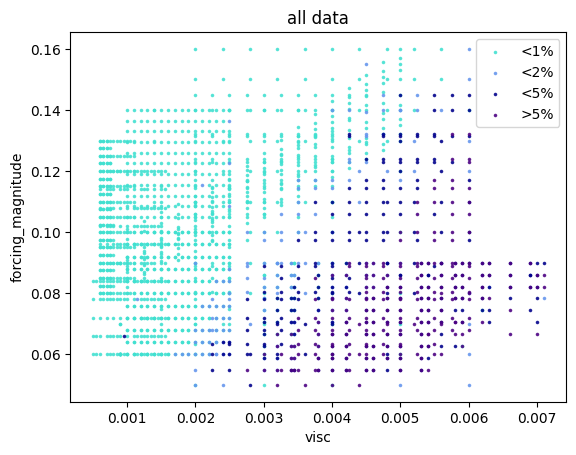

saved all data to /home/julian/BAoffline/img/all_data_v_f_2Dfiterr.png




In [21]:
map_2D_to_fiterr(all_data, "v", "f")

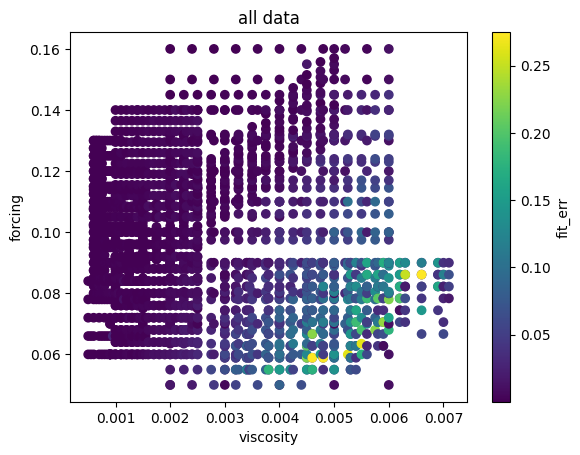

saved all data to /home/julian/BAoffline/img/all_data_fit_err_map_from_input.png




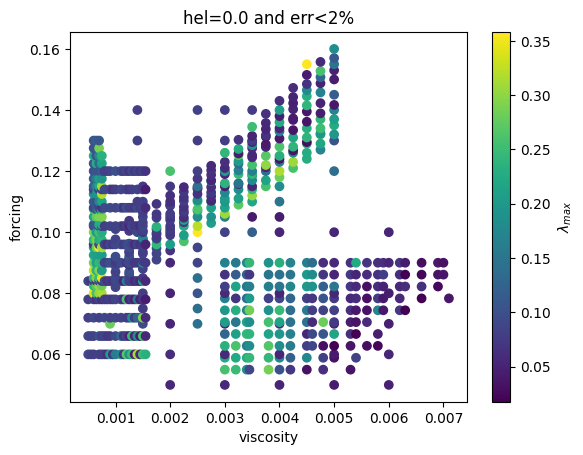

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_lmb_max_map_from_input.png




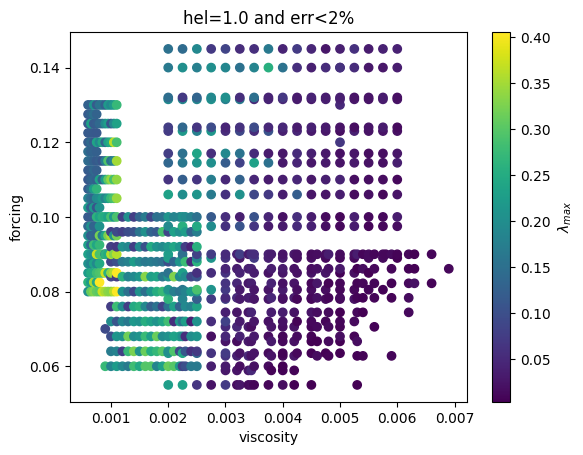

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_lmb_max_map_from_input.png




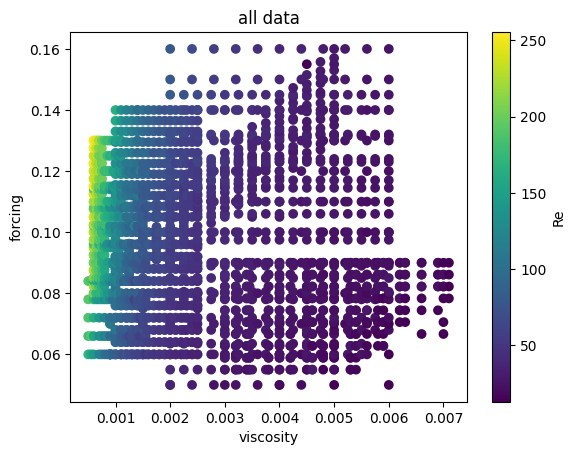

saved all data to /home/julian/BAoffline/img/all_data_re_map_from_input.png




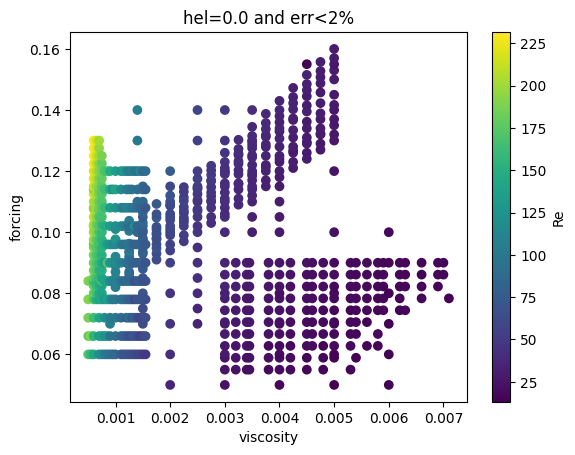

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_re_map_from_input.png




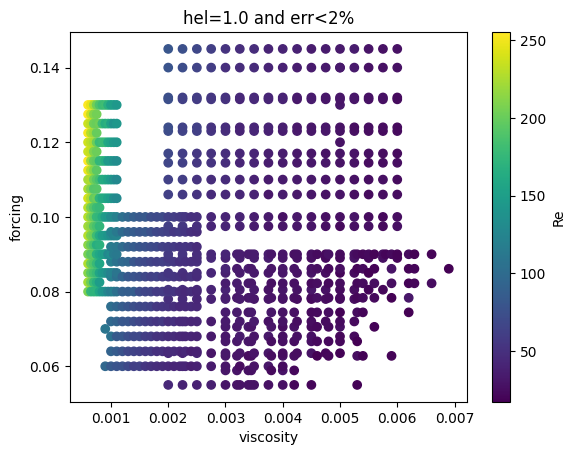

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_re_map_from_input.png




In [22]:
# plot mapping of input parameters to Re and mach

def map_from_input(ss, obs):
    data = ss[obs]
    sorted_data = np.sort(data)
    vmin = sorted_data[3]
    vmax = sorted_data[-3]
    plt.scatter(ss.v,ss.f,c=data,vmin=vmin, vmax=vmax)
    #plt.plot(v,v*17+0.07)
    #plt.plot(v,v*11+0.085)
    #plt.plot(v,v*17+0.065)
    plt.ylabel("forcing")
    plt.xlabel("viscosity")
    ticks = np.linspace(int(vmin), int(vmax+1), 10)
    ticks = np.array([round(tick,3) for tick in ticks])
    cbar = plt.colorbar()
    cbar.set_label(beautify(obs))
    #cbar.set_ticks(ticks)
    #cbar.set_ticklabels(ticks)
    fin(ss.desc, f"{ss.desc}_{obs}_map_from_input")

map_from_input(all_data, "fit_err")
#map_from_input(h0, "re")
map_from_input(h0, "lmb_max")
#map_from_input(h1, "re")
map_from_input(h1, "lmb_max")

map_from_input(all_data, "re")
map_from_input(h0, "re")
map_from_input(h1, "re")

In [23]:
def make_re_mach_plot(ss,obs_z,**kwargs):
    return make_averaged_scatter_plot(ss,obs_x="re",obs_y="urms",obs_z=obs_z, **kwargs)
def make_averaged_scatter_plot(ss,obs_x,obs_y,obs_z,resolution=50):
    
    ox = ss[obs_x]
    oy = ss[obs_y] # use this definition of mach-number
    scatter = ss[obs_z]
    weights = ss.weights
    map2o = anh.LocalAvg(ox,oy,scatter,weights)
    name=obs_z
    
    xmin = np.min(ox)*0.8
    xmax = np.max(ox)*1.05
    ymin = np.min(oy)*0.8
    ymax = np.max(oy)*1.05
    
    def finalize_plot(name):
        cbar = plt.colorbar()
        cbar.set_label(beautify(obs_z))
        plt.xlim(xmin, xmax)
        plt.ylim(ymin, ymax)
        plt.title(name)
        plt.xlabel(beautify(obs_x))
        plt.ylabel(beautify(obs_y))
        fin(name, f"{name}_x{obs_x}_y{obs_y}_avg_scatter")

    xgrid =np.linspace(xmin, xmax, resolution)
    ygrid =np.linspace(ymin, ymax, resolution)
    x1 = map2o.calc_on_grid(xgrid,ygrid,r=0.2,min_weight=10,max_r_inc=0)
    x1 = npma.masked_array(x1, x1==-11)
    
    datacopy = np.copy(scatter)
    k = 10
    vmin = datacopy[np.argpartition(datacopy, k)[k]]
    vmax = datacopy[np.argpartition(datacopy, len(datacopy)-k)[-k]]
    print(vmin, vmax)
    #vmin, vmax = np.min(x1), np.max(x1)
    
    plt.pcolormesh(xgrid,ygrid,x1.T, cmap="rainbow", vmin=vmin, vmax=vmax)
    
    #data
    #plt.scatter(re[filt],mach[filt], c="black", marker='+', cmap="rainbow", vmin=vmin, vmax=vmax)
    plt.scatter(ox,oy,c="white", marker='o', s=9)
    plt.scatter(ox,oy,c="black", marker='o', s=5)
    plt.scatter(ox,oy,c=scatter, marker='o', s=3, cmap="rainbow", vmin=vmin, vmax=vmax)
    
    finalize_plot(beautify(name)+" from data: " +ss.desc)
    
    #map

# make horizontal cuts through a

0.023502291515489722 0.10304304114609704


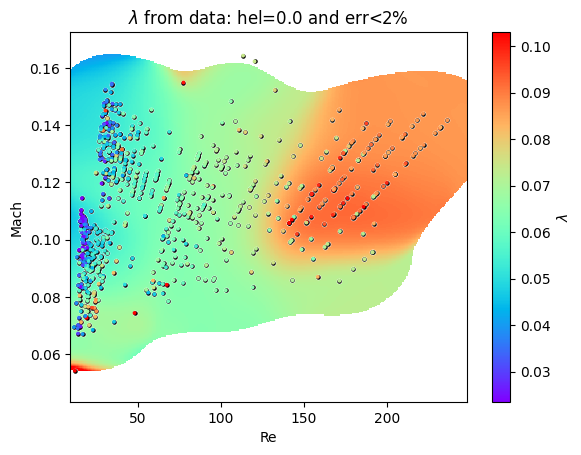

saved $\lambda$ from data: hel=0.0 and err<2% to /home/julian/BAoffline/img/lambda_from_data__heleq0p0_and_errlt2perc_xre_yurms_avg_scatter.png


0.004074302825365104 0.12022688457864109


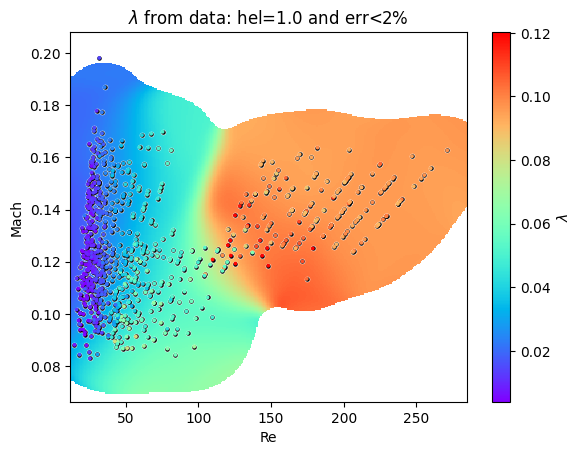

saved $\lambda$ from data: hel=1.0 and err<2% to /home/julian/BAoffline/img/lambda_from_data__heleq1p0_and_errlt2perc_xre_yurms_avg_scatter.png


0.030183667477674724 0.31494523011516207
Cant handle character: "{"
Cant handle character: "}"


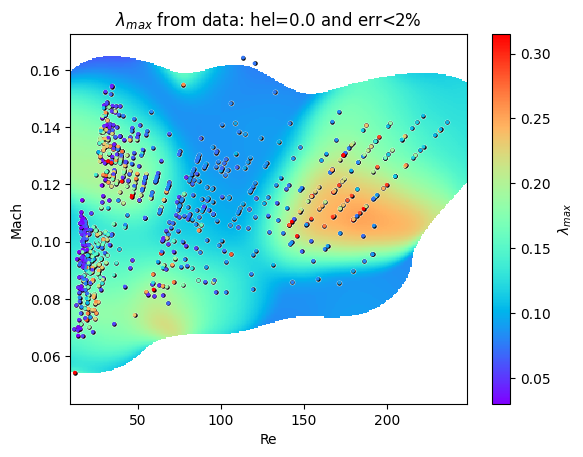

saved $\lambda$$_{max}$ from data: hel=0.0 and err<2% to /home/julian/BAoffline/img/lambda_max_from_data__heleq0p0_and_errlt2perc_xre_yurms_avg_scatter.png


0.004437459662941201 0.3612596923452815
Cant handle character: "{"
Cant handle character: "}"


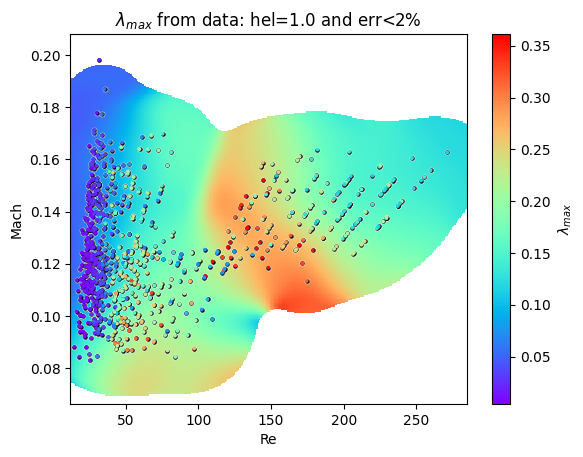

saved $\lambda$$_{max}$ from data: hel=1.0 and err<2% to /home/julian/BAoffline/img/lambda_max_from_data__heleq1p0_and_errlt2perc_xre_yurms_avg_scatter.png




In [24]:
reso = 300
for obs in ["lmb","lmb_max"]:
    for h in [h0,h1]:
        make_re_mach_plot(h,obs,resolution=reso)

0.023502291515489722 0.10304304114609704


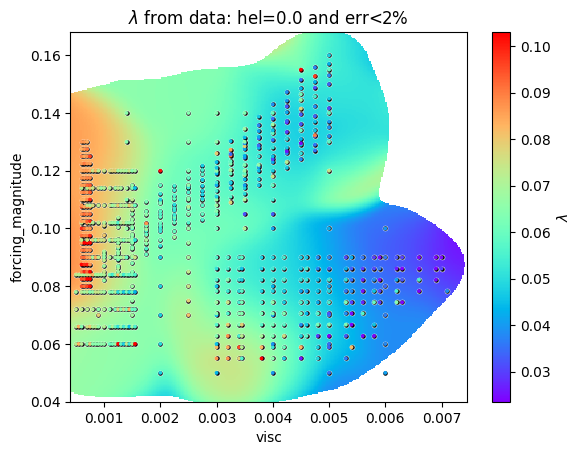

saved $\lambda$ from data: hel=0.0 and err<2% to /home/julian/BAoffline/img/lambda_from_data__heleq0p0_and_errlt2perc_xv_yf_avg_scatter.png


0.004074302825365104 0.12022688457864109


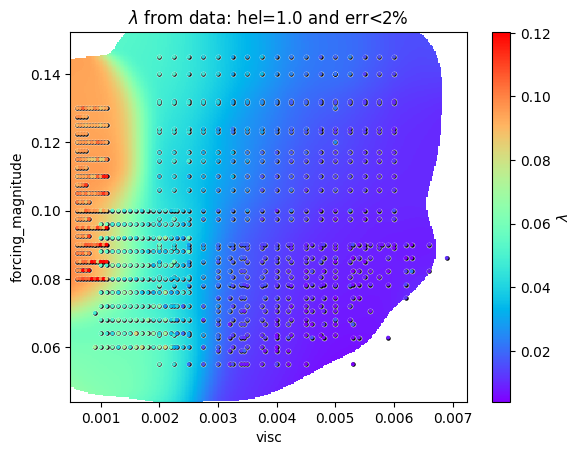

saved $\lambda$ from data: hel=1.0 and err<2% to /home/julian/BAoffline/img/lambda_from_data__heleq1p0_and_errlt2perc_xv_yf_avg_scatter.png


0.030183667477674724 0.31494523011516207
Cant handle character: "{"
Cant handle character: "}"


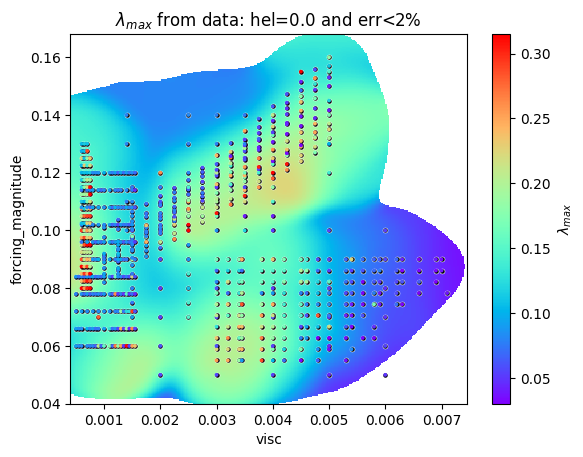

saved $\lambda$$_{max}$ from data: hel=0.0 and err<2% to /home/julian/BAoffline/img/lambda_max_from_data__heleq0p0_and_errlt2perc_xv_yf_avg_scatter.png


0.004437459662941201 0.3612596923452815
Cant handle character: "{"
Cant handle character: "}"


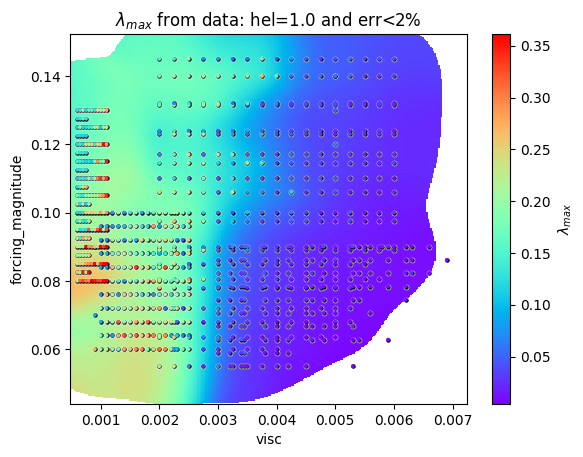

saved $\lambda$$_{max}$ from data: hel=1.0 and err<2% to /home/julian/BAoffline/img/lambda_max_from_data__heleq1p0_and_errlt2perc_xv_yf_avg_scatter.png




In [25]:
for obs in ["lmb","lmb_max"]:
    for h in [h0,h1]:
        make_averaged_scatter_plot(h,"v", "f", obs,resolution=reso)

In [26]:
def scatter_slices(ss,obs_x, obs_color, obs_y, n_colors=5):
    
    ydata = ss[obs_y]
    xdata = ss[obs_x]
    cdata = ss[obs_color]
    
    #Re_numbers = np.linspace(25,225,5)
    c_numbers = list(map(lambda c: round(c,4), np.linspace(np.min(cdata), np.max(cdata), n_colors)))
    for i in range(len(c_numbers)-1):
        cmin = c_numbers[i]
        cmax = c_numbers[i+1]
        c_filt = np.logical_and(cdata >=cmin, cdata < cmax )
        
        c_filtered = cdata[c_filt]
        x_filtered = xdata[c_filt]
        y_filtered = ydata[c_filt]
        
        plt.scatter(x_filtered, y_filtered, label=beautify(obs_color)+" $\in$ ["+str(cmin)+"-"+str(cmax)+")", marker="o",s=3,alpha=1.0)
        
    plt.legend(bbox_to_anchor=(1,1))
    plt.xlabel(beautify(obs_x))
    plt.ylabel(beautify(obs_y))
    ymax = np.quantile(ydata, [0.99])*1.06
    bott, _ = plt.ylim()
    plt.ylim(bottom=bott, top=ymax)
    fin(ss.desc, f"{ss.desc}_slices_{obs_x}xx{obs_y}_with_{obs_color}_slices")
    

def re_mach_slices(ss,obs_y, **kwargs):
    
    return scatter_slices(ss,"re","urms",obs_y,**kwargs)

def mach_re_slices(ss,obs_y,**kwargs):
    
    return scatter_slices(ss,"urms","re",obs_y,**kwargs)
# horizontal cuts

created subset << all data >> with  2054  datapoints


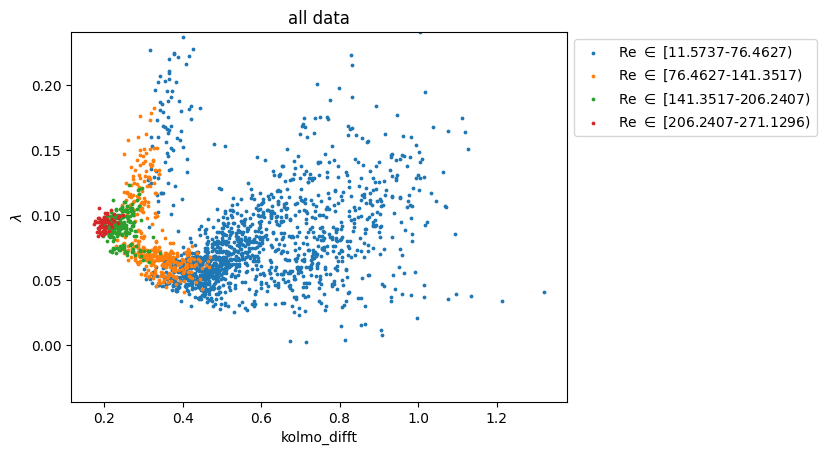

saved all data to /home/julian/BAoffline/img/all_data_slices_kolmo_difftxxlmb_with_re_slices.png




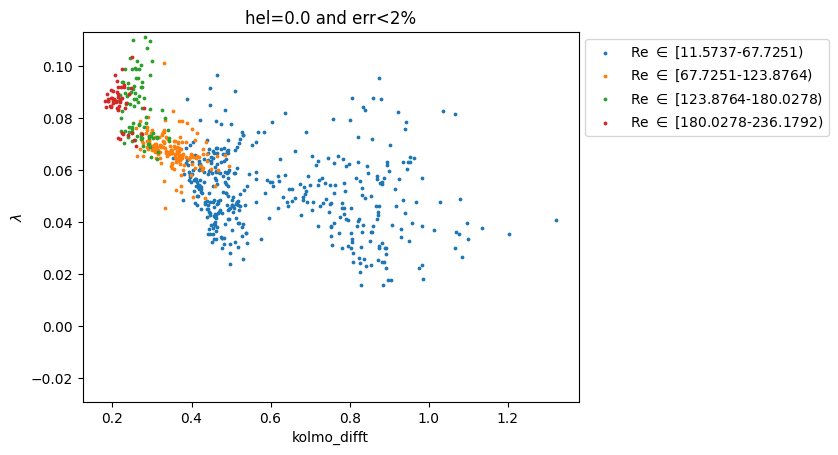

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_slices_kolmo_difftxxlmb_with_re_slices.png




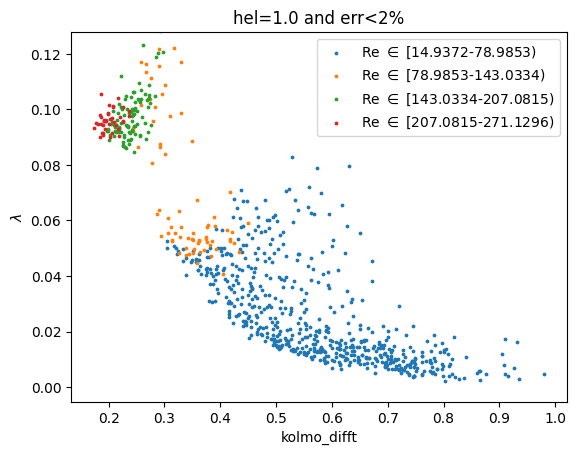

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_slices_kolmo_difftxxlmb_with_re_slices.png




In [27]:
scatter_slices(subset_data(al), "kolmo_difft", "re", "lmb" )
scatter_slices(h0, "kolmo_difft", "re", "lmb" )
scatter_slices(h1, "kolmo_difft", "re", "lmb" )

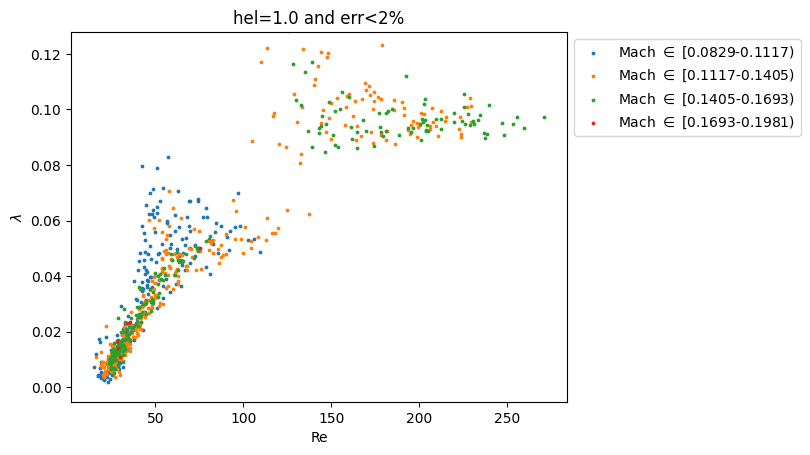

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_slices_rexxlmb_with_urms_slices.png




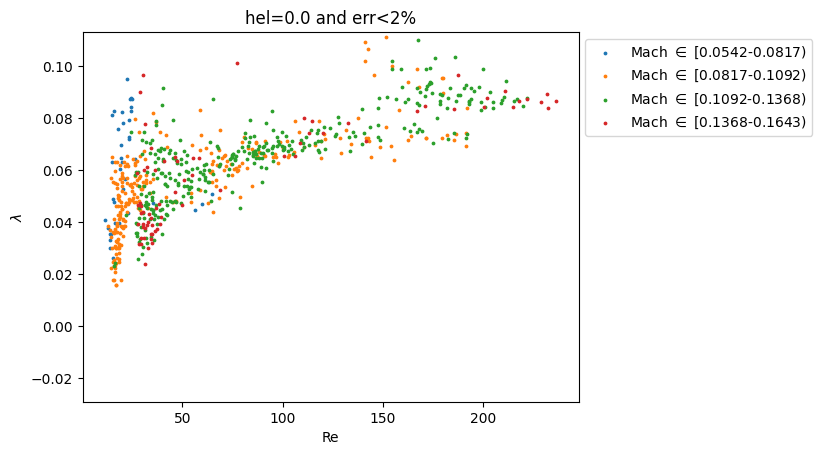

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_slices_rexxlmb_with_urms_slices.png


created subset << all data >> with  2054  datapoints


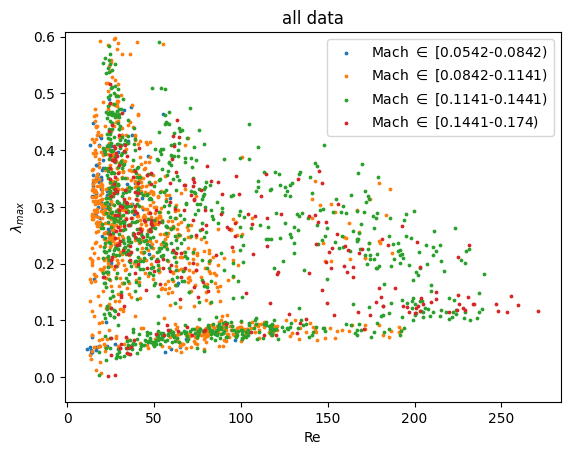

saved all data to /home/julian/BAoffline/img/all_data_slices_rexxlmb_max_with_urms_slices.png


created subset << all data >> with  2054  datapoints


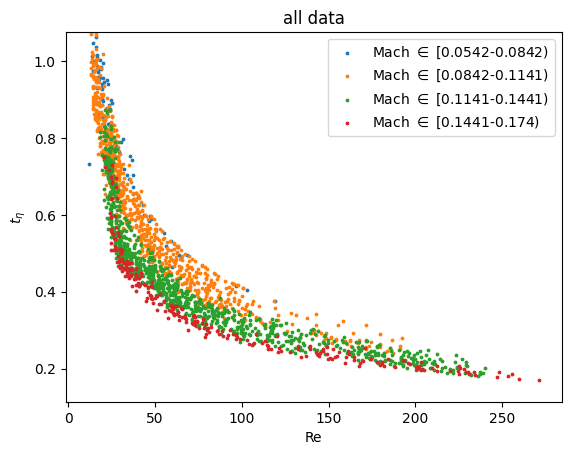

saved all data to /home/julian/BAoffline/img/all_data_slices_rexxt_eta_with_urms_slices.png


created subset << all data >> with  2054  datapoints


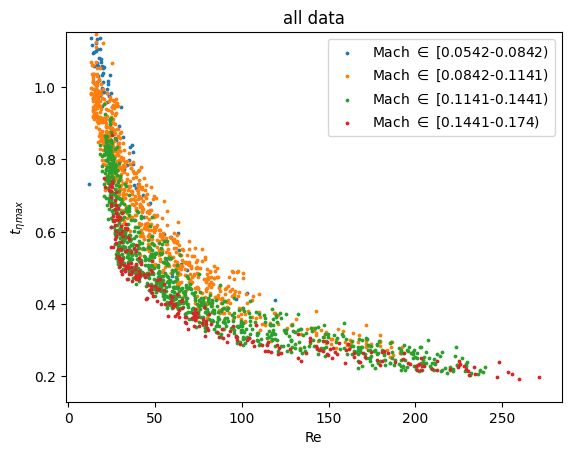

saved all data to /home/julian/BAoffline/img/all_data_slices_rexxt_eta_max_with_urms_slices.png


created subset << all data >> with  2054  datapoints


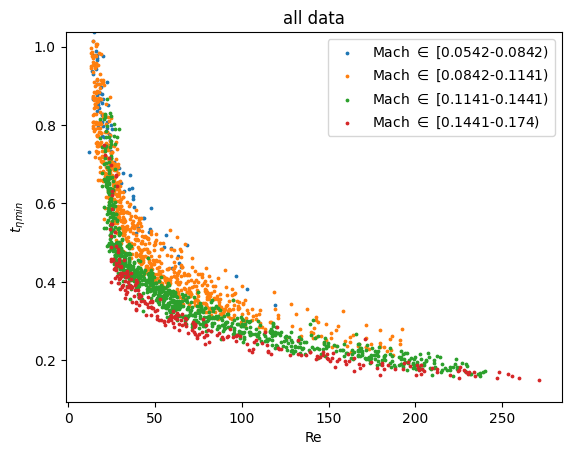

saved all data to /home/julian/BAoffline/img/all_data_slices_rexxt_eta_min_with_urms_slices.png




In [28]:
scatter_slices(h1, "re", "urms", "lmb")
scatter_slices(h0, "re", "urms", "lmb")
re_mach_slices(subset_data(al), "lmb_max")
re_mach_slices(subset_data(al), "t_eta")
re_mach_slices(subset_data(al), "t_eta_max")
re_mach_slices(subset_data(al), "t_eta_min")

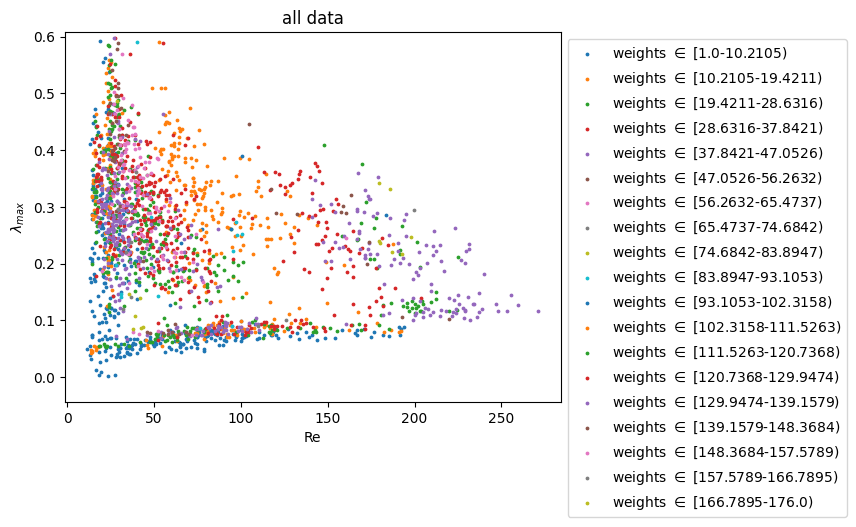

saved all data to /home/julian/BAoffline/img/all_data_slices_rexxlmb_max_with_weights_slices.png




In [29]:


scatter_slices(all_data, "re", "weights", "lmb_max",n_colors=20)

In [114]:
def do_fits(ss, show_fits=True, ylim=None):
        
    # fit through lmb(Re) with and without constant C
    # fit with and without weighting
    
    def finalize(log = False):
            
        if ylim is not None:
            plt.ylim(ylim)
        if log:
            plt.yscale("log")
            plt.xscale("log")
        plt.xlabel("Re")
        plt.ylabel("$\lambda$")
        plt.legend(bbox_to_anchor=(0.7,-0.1))
        fin(ss.desc, f"{ss.desc}_fit_results")
    #values without a std are not trustworthy because they come from a single simul
    lmb_std_nan_filter = ~np.isnan(ss.lmb_std)
    filt = lmb_std_nan_filter
    
    print(sum(filt), " datapoints with meaningful std")
    re, re_std = ss.re[filt], ss.re_std[filt]
    lmb, lmb_std = ss.lmb[filt], ss.lmb_std[filt]
    
    re_min, re_max = np.min(re),np.max(re)
    #print(re_min, re_max )

    #xweights: weigh a value higher or lower depending on how many points are in that re-value range
    n_bins = 10
    xbins = np.linspace(re_min,re_max,n_bins,endpoint=False)
    desired_bin_weight = np.ones(n_bins)
    #desired_bin_weight[-1] = 5
    #desired_bin_weight[0] = 5
    actual_bin_weight = np.zeros(n_bins)
    for i in range(len(re)):
        bi = np.searchsorted(xbins,re[i],side="right")
        actual_bin_weight[bi-1] += ln(ss.weights[i])

    print(sum(actual_bin_weight==0), " bins are empty")
    actual_bin_weight[actual_bin_weight==0] += np.NaN # avoid divide-by-zero: the value doesnt matter anyways if there is no data in it
    bin_weight_factor = desired_bin_weight/actual_bin_weight

    corrected_weights = np.full(len(re), fill_value=np.NaN)
    
    for i in range(len(re)):
        bi = np.searchsorted(xbins,re[i],side="right")
        corrected_weights[i] = ln(ss.weights[i])*bin_weight_factor[bi-1]
    
    #plot data over everything
    wf = corrected_weights > 0.1*np.mean(corrected_weights)
    wf2 = corrected_weights > 0.5*np.mean(corrected_weights) 
    wf3 = corrected_weights > 0.5*np.max(corrected_weights)
    plt.errorbar(re[wf], lmb[wf],xerr=re_std[wf], yerr=lmb_std[wf], fmt=" ", elinewidth=0.3,zorder=0, alpha=0.5)
    #plt.scatter(re[wf],lmb[wf],s=2,marker="+", c=corrected_weights[wf],zorder=10)
    plt.scatter(re[wf],lmb[wf],s=1.5,marker="+", color="black", zorder=10)
    
    if not show_fits:
        finalize()
        return
    
    plot_x = np.linspace(re_min,re_max,500) # for plotting
     
    w = corrected_weights
    x = ln(re).reshape(-1,1)
    y = ln(lmb)
    
    def fit_with_C(x,y,weights,name):
        
        # finds the mean squared error of fitting ln(a) and d to match ln(lmb-C) = ln(a) + d*ln(Re)
        def err(C):
            yC = ln(lmb - C)
            lr = sklearn.linear_model.LinearRegression()
            lr.fit(x,yC,weights)
            return np.mean(((lr.predict(x)-yC)*weights)**2)
        
        Crange = [[-10000, min(lmb)-0.001]]
        
        
        res = scipy.optimize.differential_evolution(err,Crange)
        
        assert(res.success)
        
        Cbest = res.x[0]
        
        lr = sklearn.linear_model.LinearRegression()
        lr.fit(x,ln(lmb-Cbest),weights)
        
        print(lr.coef_, Cbest)
        l = f"{name} weights, C={Cbest}, $\delta$={lr.coef_[0]}"
        plt.plot(plot_x, Cbest+np.exp(lr.predict(ln(plot_x).reshape(-1,1))), label=l)
    
    
    for name, weights in [
        ("squared", w**2),
        ("simple", w),
        ("no", 1),
        ("unbinned", ss.weights[filt]),
        ("unbinned squared", ss.weights[filt]**2)
    ]:
        
        #fit_with_C(x,y,weights,name)
        
        lr = sklearn.linear_model.LinearRegression()
        lr.fit(x,y,weights)
        print(lr.coef_)
        print(lr)
        l = f"{name} weights, $\delta$={round(lr.coef_[0],3)}"
        plt.plot(plot_x, np.exp(lr.predict(ln(plot_x).reshape(-1,1))), label=l)
    
    
    finalize()

    

In [115]:
x = np.array([0,1,2,3,4]).reshape(-1,1)
print(x.shape)
print(x)

(5, 1)
[[0]
 [1]
 [2]
 [3]
 [4]]


In [116]:
def do_fits_old(ss, show_fits=True, ylim=None):
    
    # fit through lmb(Re) with and without constant C
    
    def finalize():
        if ylim is not None:
            plt.ylim(ylim)
        #plt.yscale("log")
        #plt.xscale("log")
        plt.xlabel("Re")
        plt.ylabel("$\lambda$")
        plt.legend(bbox_to_anchor=(1,1))
        fin(ss.desc, f"{ss.desc}_fit_results")
        
    #values without a std are not trustworthy because they come from a single simul
    lmb_std_nan_filter = ~np.isnan(ss.lmb_std)
    filt = lmb_std_nan_filter
    
    print(sum(filt), " datapoints with meaningful std")
    re, re_std = ss.re[filt], ss.re_std[filt]
    lmb, lmb_std = ss.lmb[filt], ss.lmb_std[filt]
    
    re_min, re_max = np.min(re),np.max(re)
    #print(re_min, re_max )

    #xweights: weigh a value higher or lower depending on how many points are in that re-value range
    n_bins = 10
    xbins = np.linspace(re_min,re_max,n_bins,endpoint=False)
    desired_bin_weight = np.ones(n_bins)
    #desired_bin_weight[-1] = 5
    #desired_bin_weight[0] = 5
    actual_bin_weight = np.zeros(n_bins)
    for i in range(len(re)):
        bi = np.searchsorted(xbins,re[i],side="right")
        actual_bin_weight[bi-1] += ln(ss.weights[i])

    print(sum(actual_bin_weight==0), " bins are empty")
    actual_bin_weight[actual_bin_weight==0] += np.NaN # avoid divide-by-zero: the value doesnt matter anyways if there is no data in it
    bin_weight_factor = desired_bin_weight/actual_bin_weight

    corrected_weights = np.full(len(re), fill_value=np.NaN)
    
    for i in range(len(re)):
        bi = np.searchsorted(xbins,re[i],side="right")
        corrected_weights[i] = ln(ss.weights[i])*bin_weight_factor[bi-1]
        
    
    
    def fun(x, alpha, delta):
        res = alpha*x**delta
        return res

    def funC(x,alpha,delta,C):
        return alpha*x**delta+C

    def err_fun(alphadelta):
        alpha, delta = alphadelta
        pointwise_errs = corrected_weights*(fun(re,alpha,delta) - lmb)**2/lmb_std
        #assert(np.all(fun(re,alpha,delta)>0))
        #assert(np.all(lmb > 0))
        #pointwise_errs = corrected_weights*(ln(fun(re,alpha,delta)) - ln(lmb))**2#/lmb_std
        #upper_bound = np.quantile(pointwise_errs, 0.9)
        #pointwise_errs = pointwise_errs[pointwise_errs < upper_bound]
        res = np.mean(pointwise_errs)
        return res

    def err_funC(alphadeltaC):
        alpha, delta,C = alphadeltaC
        pointwise_errs = corrected_weights*(funC(re,alpha,delta,C) - lmb)**2/lmb_std
        #assert np.all(funC(re,alpha,delta,C)>0), f"{alpha}, {delta}, {C}"
        #assert(np.all(lmb > 0))
        #pointwise_errs = corrected_weights*(ln(funC(re,alpha,delta,C)) -ln(lmb))**2#/lmb_std
        #upper_bound = np.quantile(pointwise_errs, 0.9)
        #pointwise_errs = pointwise_errs[pointwise_errs < upper_bound]
        return np.mean(pointwise_errs)

    bounds = [
        [0,20], #alpha
        [-1,2] #delta
    ]

    boundsC= [
        [0,20], #alpha
        [-1,2], #delta
        [0,5] #C
    ]


    #plot data over everything
    wf = corrected_weights > 0.1*np.mean(corrected_weights)
    wf2 = corrected_weights > 0.5*np.mean(corrected_weights) 
    wf3 = corrected_weights > 0.5*np.max(corrected_weights)
    plt.errorbar(re[wf], lmb[wf],xerr=re_std[wf], yerr=lmb_std[wf], fmt=" ", elinewidth=0.3,zorder=0, alpha=0.5)
    plt.scatter(re[wf],lmb[wf],s=2,marker="+", c=corrected_weights[wf],zorder=10)
    #plt.scatter(re[wf2],lmb[wf2],s=2,marker="+",color="orange",zorder=10)
    #plt.scatter(re[wf3],lmb[wf3],s=2,marker="+",color="red",zorder=10)
    
    if not show_fits:
        finalize()
        return
    
    plot_x = np.linspace(re_min,re_max,500) # for plotting

    # "smart" differential evolution
    for fn, err_f, bnds, lbl in [(fun, err_fun, bounds,"no const"), (funC, err_funC, boundsC, "with const")]:

        res = scipy.optimize.differential_evolution(err_f,bnds)
        print(res)
        delta = res.x[1]


        plt.plot(plot_x, fn(plot_x,*res.x), label=lbl+f" $\delta={round(delta,2)}$")

    # dumb linear regression
    lny = ln(lmb)
    lnx = ln(re)
    res = scipy.stats.linregress(lnx,lny)
    print("linregress: ", res)
    alpha, delta = np.exp(res.intercept), res.slope
    print(alpha, delta, "---->>>", err_fun((alpha,delta)))
    plt.plot(plot_x, fun(plot_x,alpha,delta),label="linear regression"+f" $\delta={round(delta,2)}$")

    assert(np.all(lmb_std > 0))
    print("STD MIN: ", np.min(lmb_std))
    pointwise_err = np.abs((fun(re,alpha,delta) -lmb)/lmb_std)
    print("========", min(pointwise_err), max(pointwise_err), np.quantile(pointwise_err,0.9))
    #plt.show()
    #plt.hist(np.sort(pointwise_err)[:-20], bins=50)
    #plt.show()
    fvals = fun(re,alpha,delta)

    # optimization using initial guess
    res = scipy.optimize.minimize(err_fun, (alpha,delta))
    alpha_opti,delta_opti = res.x
    plt.plot(plot_x, fun(plot_x,alpha_opti,delta_opti),label="optimized linregress"+f" $\delta={round(delta,2)}$")
    print(res)

    #optimization using the same initial guess, but allowing a Constant
    res = scipy.optimize.minimize(err_funC, (alpha,delta,1))
    alpha,delta,C = res.x
    print("C=",C)
    plt.plot(plot_x, funC(plot_x,alpha,delta,C),label="optimized linregress with const"+f" $\delta={round(delta,2)}$")


    finalize()
   

691  datapoints with meaningful std
0  bins are empty
[0.27321461]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.28523488]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.29377067]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.25769455]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.23259966]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


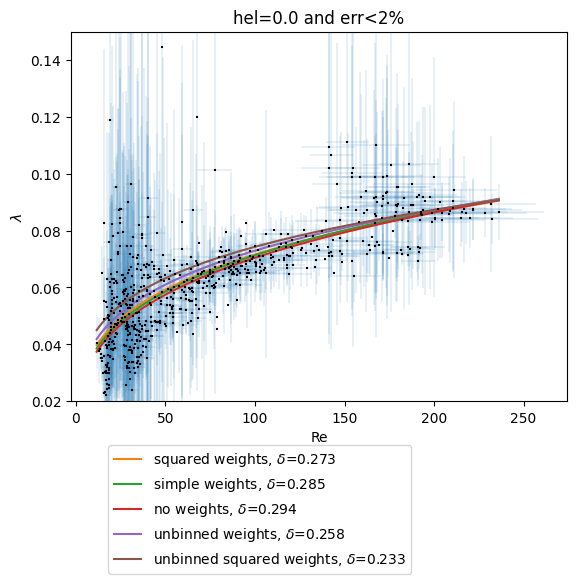

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_fit_results.png




In [117]:
do_fits(h0,ylim=[0.02,0.15])

created subset << hel=1.0 >> with  852  datapoints
844  datapoints with meaningful std
0  bins are empty
[0.30245336]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.22225968]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.07567705]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.07975346]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.07890456]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


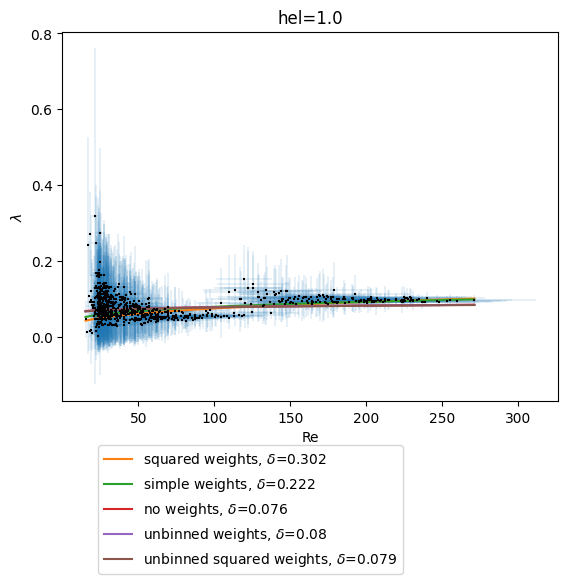

saved hel=1.0 to /home/julian/BAoffline/img/heleq1p0_fit_results.png


created subset << hel=1.0 and err<5% and nx=128 >> with  662  datapoints
635  datapoints with meaningful std
0  bins are empty
[0.37398572]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.4720076]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.9088151]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.3460344]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.12398745]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


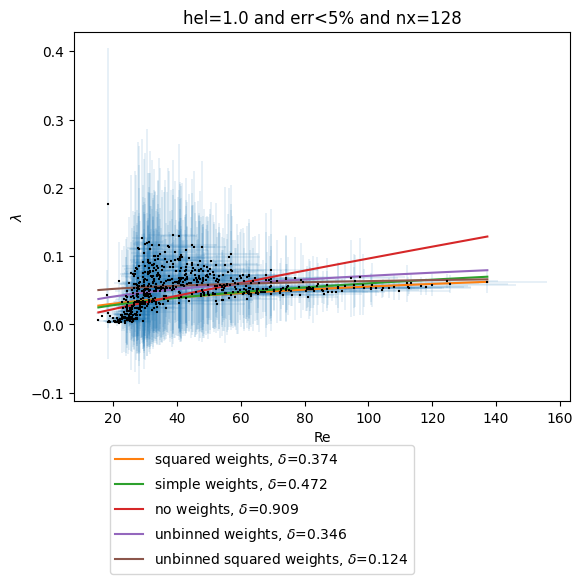

saved hel=1.0 and err<5% and nx=128 to /home/julian/BAoffline/img/heleq1p0_and_errlt5perc_and_nxeq128_fit_results.png


created subset << hel=1.0 and nx=256 >> with  166  datapoints
166  datapoints with meaningful std
0  bins are empty
[-0.21427395]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[-0.21783142]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[-0.21551283]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[-0.20392449]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[-0.19400765]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


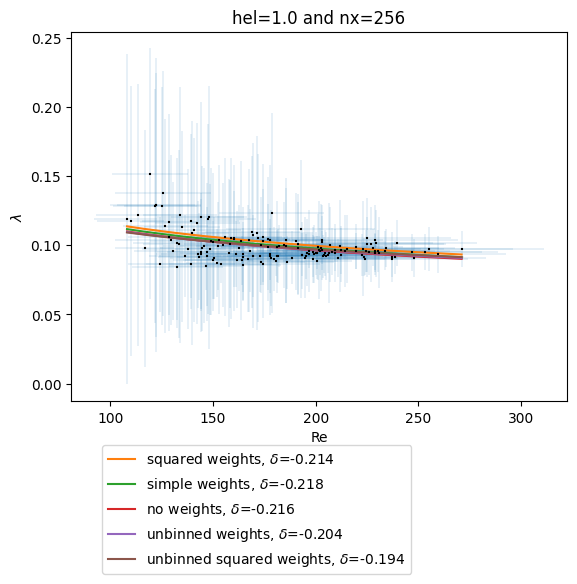

saved hel=1.0 and nx=256 to /home/julian/BAoffline/img/heleq1p0_and_nxeq256_fit_results.png




In [118]:
ss = subset_data(hel_one)
do_fits(ss,show_fits=True)
ss = subset_data(hel_one,err5,nx_128)
do_fits(ss,show_fits=True)
ss = subset_data(hel_one,nx_256)
do_fits(ss,show_fits=True)

created subset << low_visc and err<2% and hel=1.0 >> with  626  datapoints
626  datapoints with meaningful std
0  bins are empty
[0.45834872]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.75630475]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.9583518]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.90631778]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.86359608]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


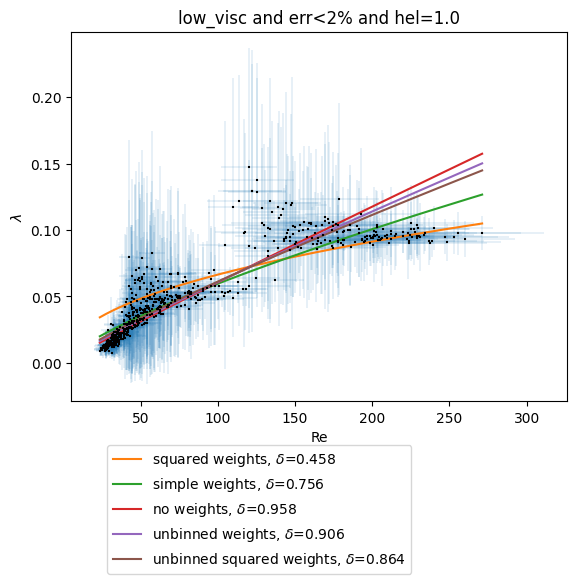

saved low_visc and err<2% and hel=1.0 to /home/julian/BAoffline/img/low_visc_and_errlt2perc_and_heleq1p0_fit_results.png




In [119]:
do_fits(subset_data(low_visc, err2, hel_one))

218  datapoints with meaningful std
0  bins are empty
[0.19188757]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.66016025]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.68016144]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[0.85128759]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[1.07119678]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


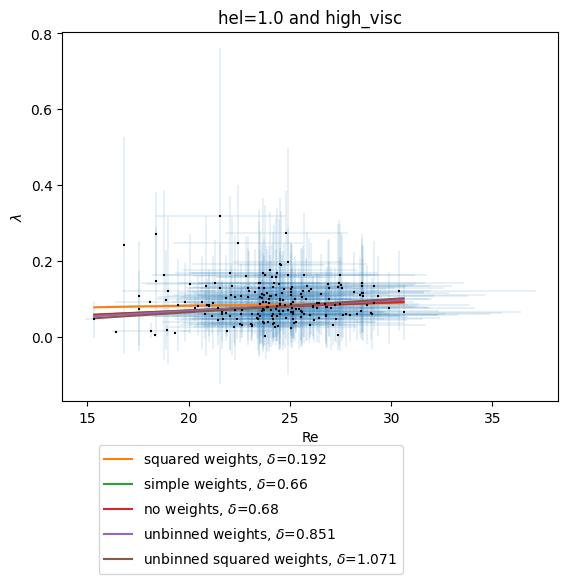

saved hel=1.0 and high_visc to /home/julian/BAoffline/img/heleq1p0_and_high_visc_fit_results.png




In [121]:
do_fits(h1hv, show_fits=True)

In [122]:
def colored_errbar_plot(ss, obs_x, obs_y, obs_color):
    
    cdata = ss[obs_color]
    xdata = ss[obs_x]
    ydata = ss[obs_y]
    
    if False:
        xdata = [ss[obs_x+"_q25"],ss[obs_x+"_q75"]]
        ydata = [ss[obs_y+"_q25"],ss[obs_y+"_q75"]]
        plt.errorbar(xdata,ydata,xerr=xerr,yerr=yerr,c="grey",alpha=0.1,zorder=0)
    plt.scatter(xdata,ydata,c=cdata,marker="+",s=5,cmap="cividis")
    cbar = plt.colorbar()
    cbar.set_label(obs_color)
    plt.xlabel(beautify(obs_x))
    plt.ylabel(beautify(obs_y))
    fin(ss.desc, f"{ss.desc}_errbar_{obs_x}xxx{obs_y}_with_color_{obs_color}")

created subset << err<2% >> with  1976  datapoints


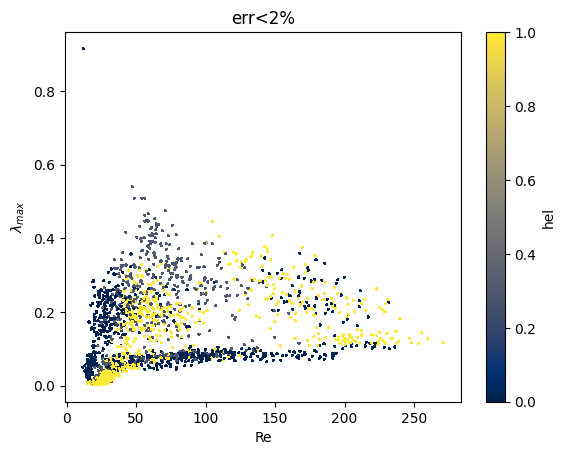

saved err<2% to /home/julian/BAoffline/img/errlt2perc_errbar_rexxxlmb_max_with_color_hel.png


created subset << err<5% >> with  2018  datapoints


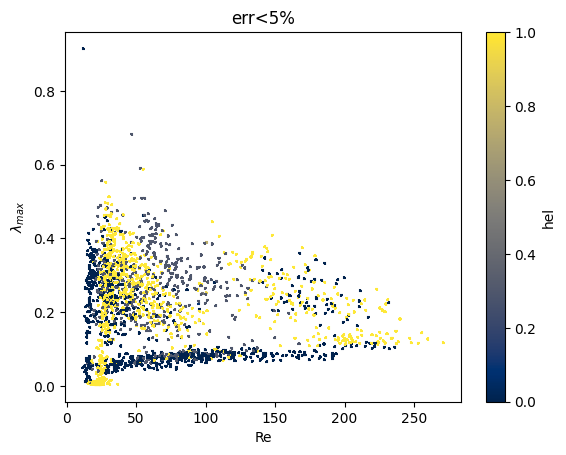

saved err<5% to /home/julian/BAoffline/img/errlt5perc_errbar_rexxxlmb_max_with_color_hel.png


created subset << err<5% >> with  2018  datapoints


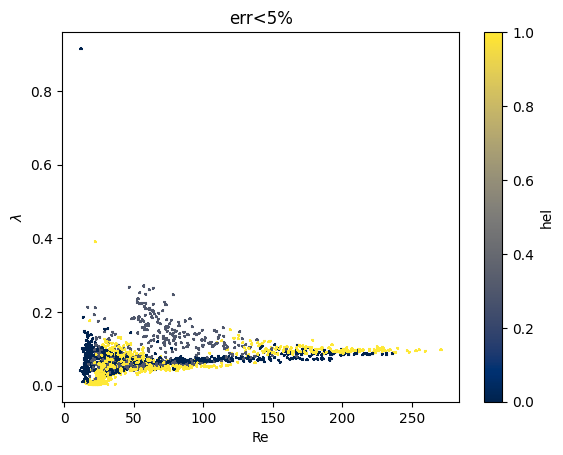

saved err<5% to /home/julian/BAoffline/img/errlt5perc_errbar_rexxxlmb_with_color_hel.png


created subset << hel=1.0 >> with  852  datapoints


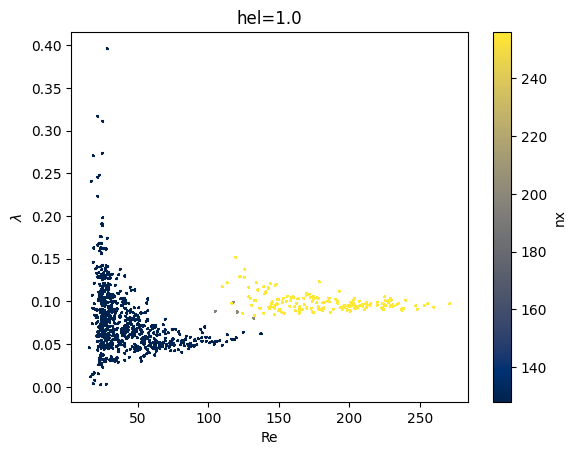

saved hel=1.0 to /home/julian/BAoffline/img/heleq1p0_errbar_rexxxlmb_with_color_nx.png


created subset << hel=1.0 and nx=128 >> with  690  datapoints


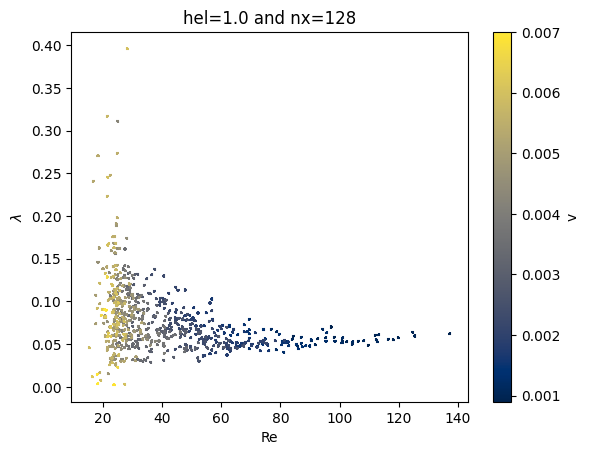

saved hel=1.0 and nx=128 to /home/julian/BAoffline/img/heleq1p0_and_nxeq128_errbar_rexxxlmb_with_color_v.png


created subset << hel=1.0 and nx=256 >> with  166  datapoints


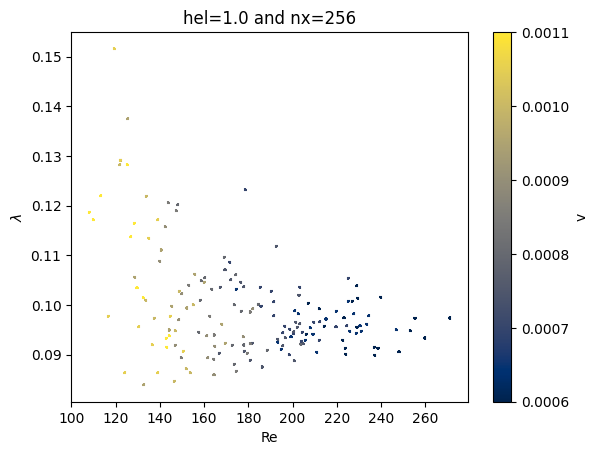

saved hel=1.0 and nx=256 to /home/julian/BAoffline/img/heleq1p0_and_nxeq256_errbar_rexxxlmb_with_color_v.png




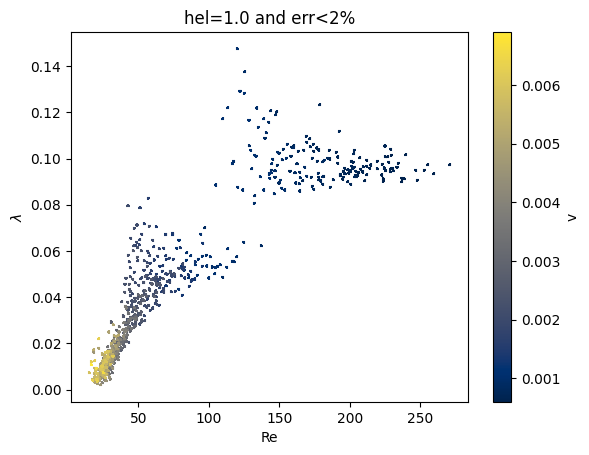

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_errbar_rexxxlmb_with_color_v.png




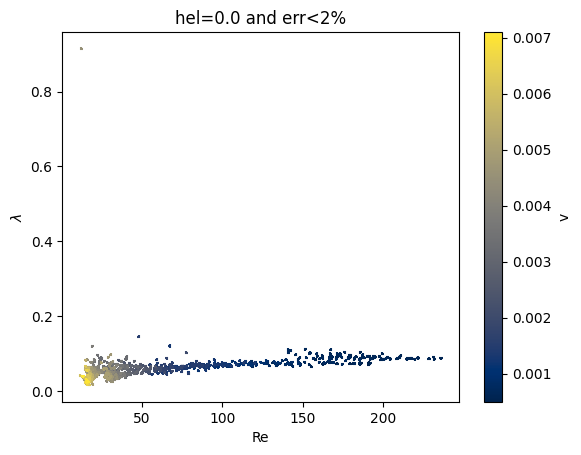

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_errbar_rexxxlmb_with_color_v.png




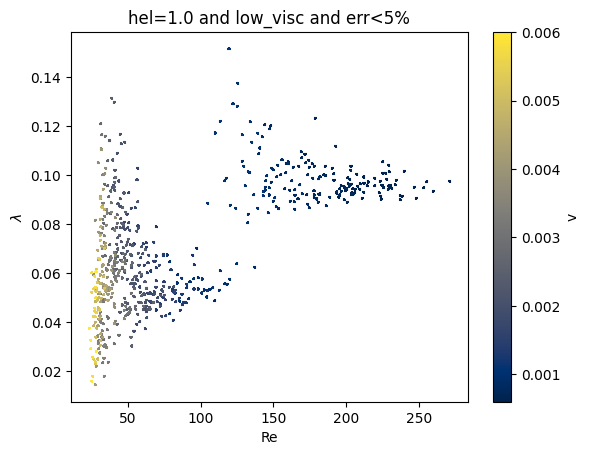

saved hel=1.0 and low_visc and err<5% to /home/julian/BAoffline/img/heleq1p0_and_low_visc_and_errlt5perc_errbar_rexxxlmb_with_color_v.png




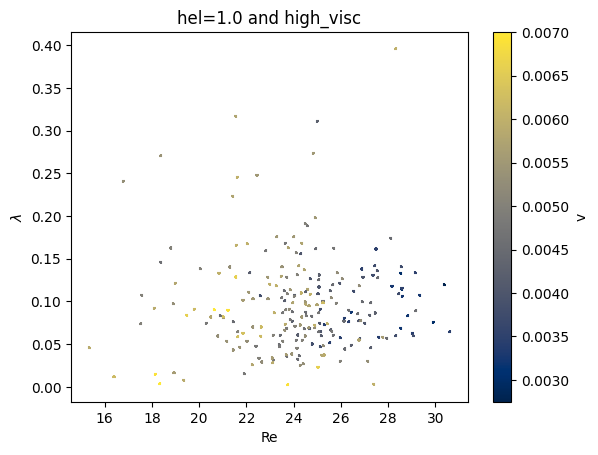

saved hel=1.0 and high_visc to /home/julian/BAoffline/img/heleq1p0_and_high_visc_errbar_rexxxlmb_with_color_v.png




In [123]:
colored_errbar_plot(subset_data(err2), "re", "lmb_max", "hel")
colored_errbar_plot(subset_data(err5), "re", "lmb_max", "hel")
colored_errbar_plot(subset_data(err5), "re", "lmb", "hel")
colored_errbar_plot(subset_data(hel_one), "re", "lmb", "nx")
colored_errbar_plot(subset_data(hel_one, nx_128), "re", "lmb", "v")
colored_errbar_plot(subset_data(hel_one, nx_256), "re", "lmb", "v")
colored_errbar_plot(h1, "re", "lmb", "v")
colored_errbar_plot(h0, "re", "lmb", "v")
colored_errbar_plot(h1lv, "re", "lmb", "v")
colored_errbar_plot(h1hv, "re", "lmb", "v")

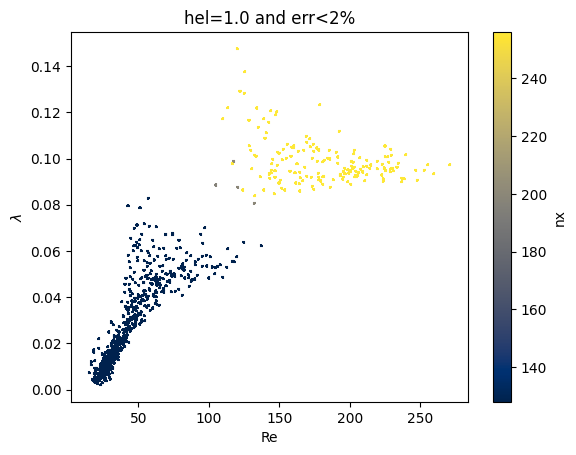

saved hel=1.0 and err<2% to /home/julian/BAoffline/img/heleq1p0_and_errlt2perc_errbar_rexxxlmb_with_color_nx.png




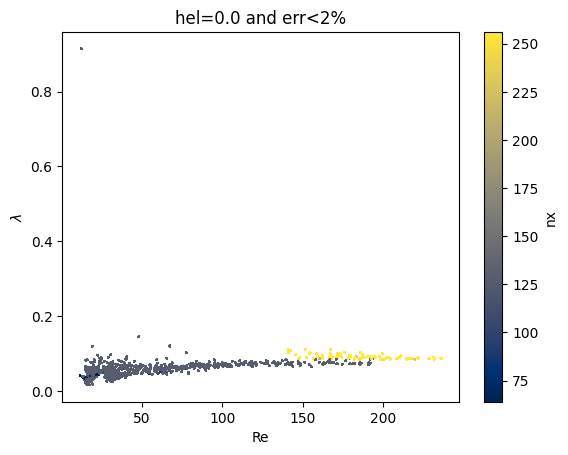

saved hel=0.0 and err<2% to /home/julian/BAoffline/img/heleq0p0_and_errlt2perc_errbar_rexxxlmb_with_color_nx.png




In [124]:
colored_errbar_plot(h1, "re", "lmb", "nx")
colored_errbar_plot(h0, "re", "lmb", "nx")

In [159]:
def lyap_vs_timescale(ss, tau, tau_name, lmb_mod="", obs_color=None, cmap="cividis", invert=False, x_clip_low=0.0, x_clip_high=0.0, clip_high=0.01, xlim=None):
    
    if obs_color is not None:
        color = ss[obs_color]
    else:
        color = "green"
    lmb_show = ss["lmb_"+lmb_mod] if lmb_mod else ss.lmb
    #dimensional lyapunov exponent
    dl = ss.lmb_min/ss.t_eta
    
    if invert:
        tau = 1/tau
        plt.xlabel(tau_name)
    else:
        plt.xlabel("("+tau_name + r")$^{-1}$")
    
    if clip_high > 0:
        max_dl = np.quantile(dl, 1-clip_high)
        filt = (dl<=max_dl)
        dl = dl[filt]
        tau = tau[filt]
        if obs_color is not None:
            color = color[filt]
    if x_clip_high > 0:
        max_x = np.quantile(1/tau, 1-x_clip_high)
        filt = (1/tau<=max_x)
        dl = dl[filt]
        tau = tau[filt]
        if obs_color is not None:
            color = color[filt]
    if x_clip_low > 0:
        min_x = np.quantile(1/tau, x_clip_low)
        filt = (1/tau>= min_x)
        dl = dl[filt]
        tau = tau[filt]
        if obs_color is not None:
            color = color[filt]
    
    plt.scatter(1/tau, dl,marker=".",s=4.5,c="black",cmap=cmap)
    plt.scatter(1/tau, dl,marker=".",s=3.5,c=color,cmap=cmap)
    
    plt.ylabel(f" Dimensional Lyapunov exponent {beautify(lmb_mod)} (in units of 1/time)")
    if obs_color is not None:
        cbar = plt.colorbar()
        cbar.set_label(beautify(obs_color))
    fin(beautify(tau_name) + " from data: (" + ss.desc + ")", f"difftime_comp_{tau_name}{lmb_mod}_from_data_{ss.desc}_with_color_{obs_color}")
    
    
def lyap_vs_numerical(ss, **kwargs):
    
    return lyap_vs_timescale(ss,ss.dt,"numerical timestep",**kwargs)

def lyap_vs_kolmogorov(ss, **kwargs):
    
    return lyap_vs_timescale(ss,ss.t_eta,"$t_\eta$",**kwargs)

def lyap_vs_celltime(ss, **kwargs):
    
    return lyap_vs_timescale(ss,ss.dx/ss.urms, "time between gridcells", **kwargs)

def lyap_vs_difftime(ss, **kwargs):
    
    return lyap_vs_timescale(ss,(2*np.pi)/ss.v, "diffusion time (defined via integral scale)", **kwargs)

def lyap_vs_kolmo_difftime(ss,**kwargs):
    
    return lyap_vs_timescale(ss,(ss.urms*ss.t_eta)**2/ss.v, "diffusion time (defined via Kolmogorov scale)", **kwargs)

def lyap_vs_dx_difftime(ss,**kwargs):
    
    return lyap_vs_timescale(ss,(ss.dx)**2/ss.v, "diffusion time (defined through the numerical $\Delta x$)", **kwargs)

created subset << err<5% >> with  2018  datapoints


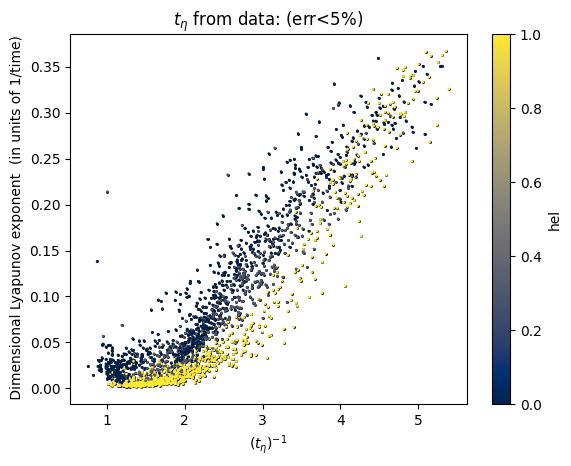

saved $t_\eta$ from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_t_eta_from_data_errlt5perc_with_color_hel.png




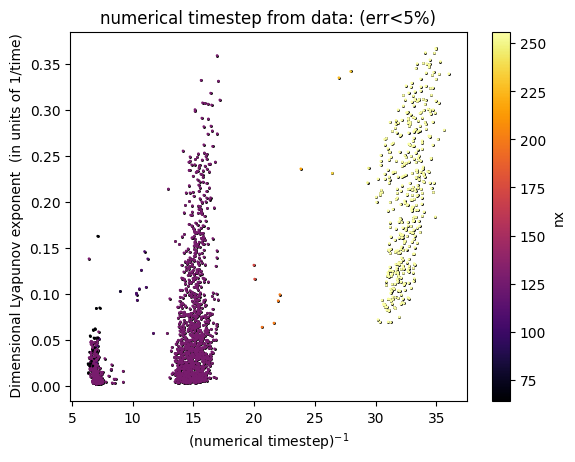

saved numerical timestep from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_numerical_timestep_from_data_errlt5perc_with_color_nx.png




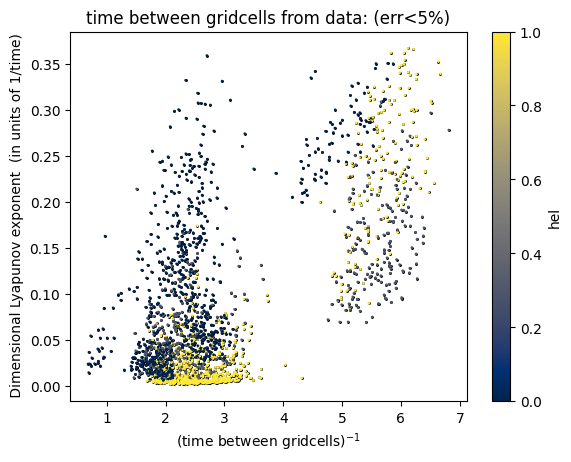

saved time between gridcells from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_time_between_gridcells_from_data_errlt5perc_with_color_hel.png




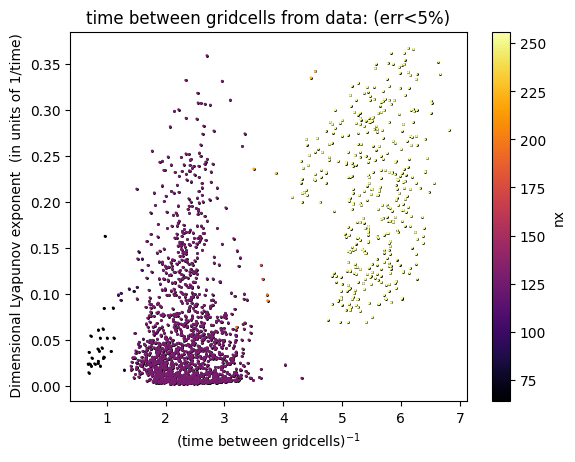

saved time between gridcells from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_time_between_gridcells_from_data_errlt5perc_with_color_nx.png


Cant handle character: "("
Cant handle character: ")"


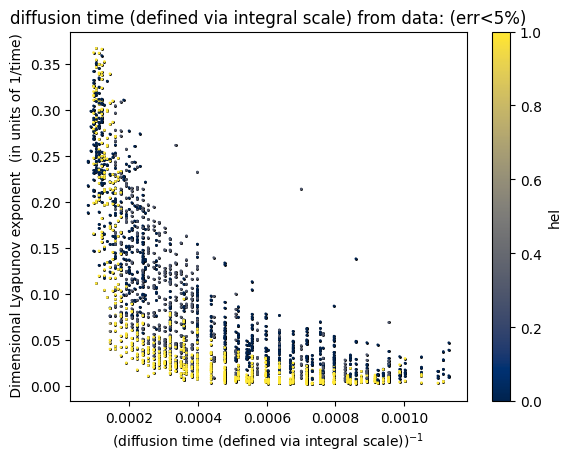

saved diffusion time (defined via integral scale) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_integral_scale_from_data_errlt5perc_with_color_hel.png


Cant handle character: "("
Cant handle character: ")"


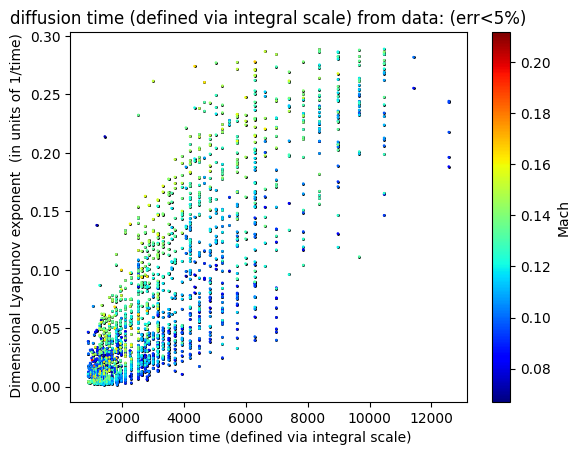

saved diffusion time (defined via integral scale) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_integral_scale_from_data_errlt5perc_with_color_urms.png


Cant handle character: "("
Cant handle character: ")"


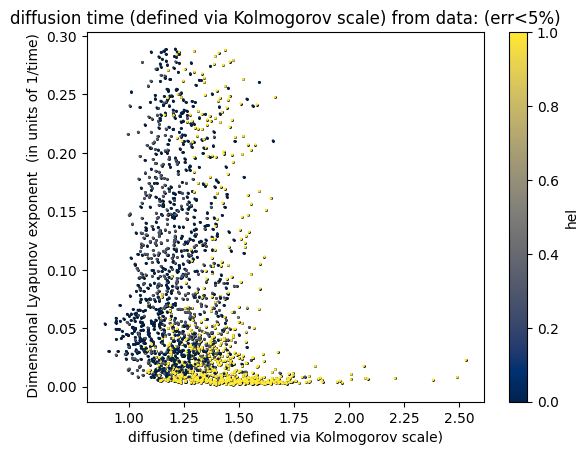

saved diffusion time (defined via Kolmogorov scale) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_Kolmogorov_scale_from_data_errlt5perc_with_color_hel.png


Cant handle character: "("
Cant handle character: ")"


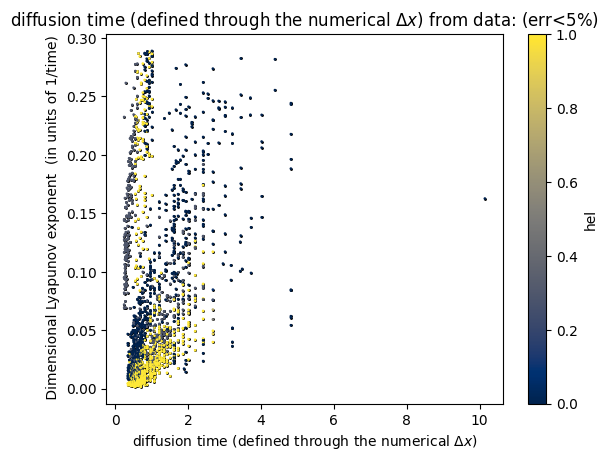

saved diffusion time (defined through the numerical $\Delta x$) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_through_the_numerical_Delta_x_from_data_errlt5perc_with_color_hel.png




In [160]:
ss = subset_data(err5)
lyap_vs_kolmogorov(ss,obs_color="hel",clip_high=0.01)
lyap_vs_numerical(ss,obs_color="nx",cmap="inferno")
lyap_vs_celltime(ss,obs_color="hel")
lyap_vs_celltime(ss,obs_color="nx",cmap="inferno")
lyap_vs_difftime(ss,obs_color="hel")
lyap_vs_difftime(ss,obs_color="urms",cmap="jet", invert=True,clip_high=0.05)
lyap_vs_kolmo_difftime(ss,obs_color="hel",invert=True,clip_high=0.05)
lyap_vs_dx_difftime(ss,obs_color="hel",invert=True,clip_high=0.05)

Cant handle character: "("
Cant handle character: ")"


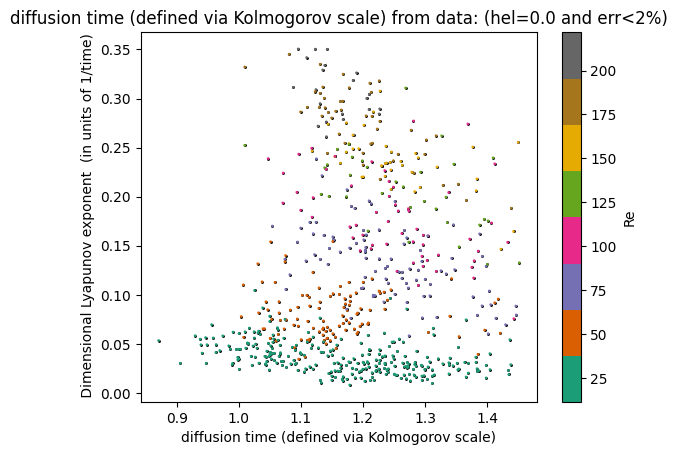

saved diffusion time (defined via Kolmogorov scale) from data: (hel=0.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_Kolmogorov_scale_from_data_heleq0p0_and_errlt2perc_with_color_re.png


Cant handle character: "("
Cant handle character: ")"


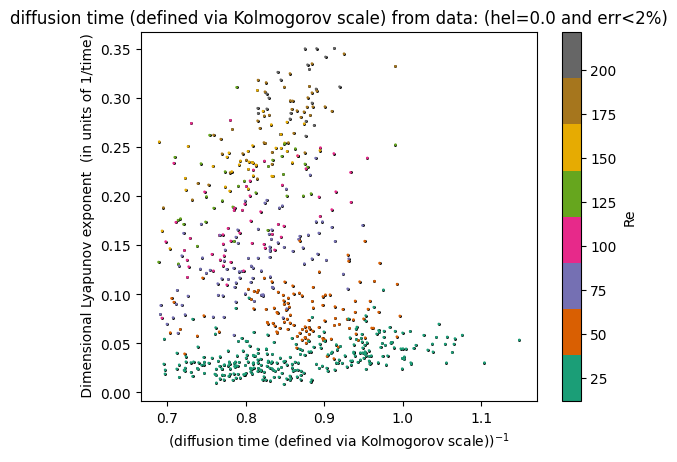

saved diffusion time (defined via Kolmogorov scale) from data: (hel=0.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_Kolmogorov_scale_from_data_heleq0p0_and_errlt2perc_with_color_re.png




In [161]:
cmap = "Dark2"
ss = h0
lyap_vs_kolmo_difftime(ss,obs_color="re",cmap=cmap,invert=True, x_clip_high=0.03)
lyap_vs_kolmo_difftime(ss,obs_color="re",cmap=cmap,invert=False, x_clip_low=0.03)

created subset << err<5% >> with  2018  datapoints


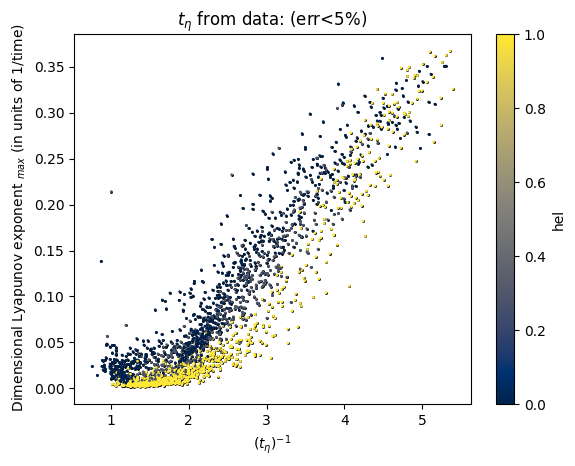

saved $t_\eta$ from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_t_etamax_from_data_errlt5perc_with_color_hel.png




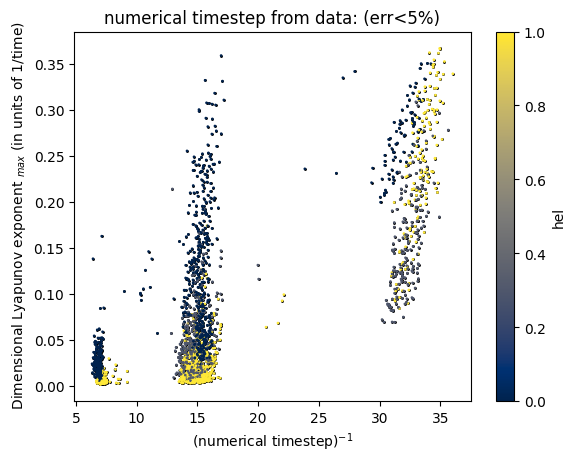

saved numerical timestep from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_numerical_timestepmax_from_data_errlt5perc_with_color_hel.png




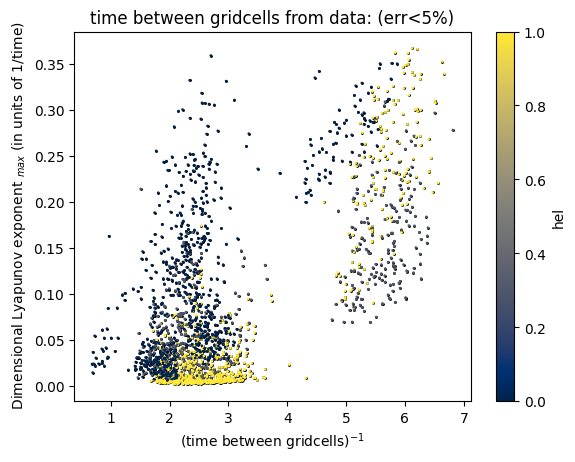

saved time between gridcells from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_time_between_gridcellsmax_from_data_errlt5perc_with_color_hel.png


Cant handle character: "("
Cant handle character: ")"


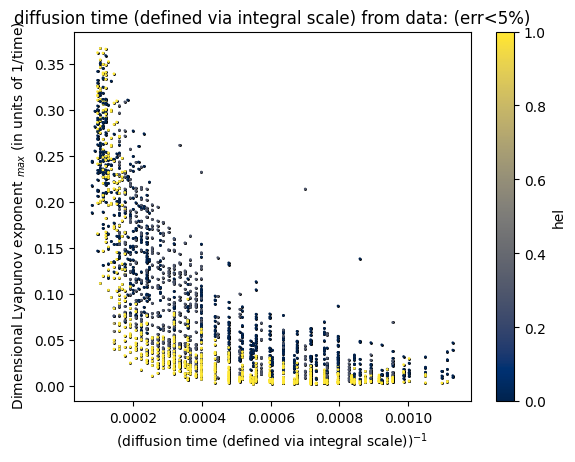

saved diffusion time (defined via integral scale) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_integral_scalemax_from_data_errlt5perc_with_color_hel.png


Cant handle character: "("
Cant handle character: ")"


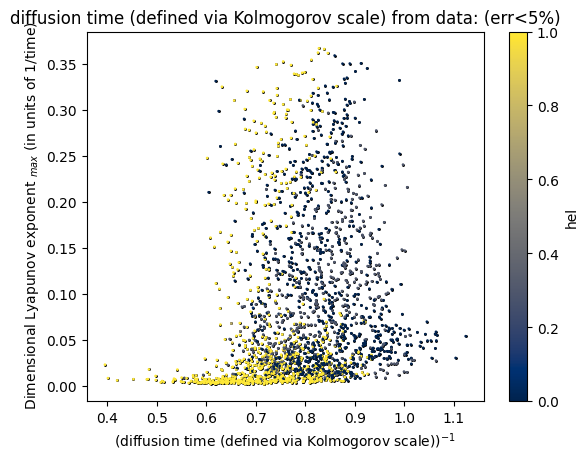

saved diffusion time (defined via Kolmogorov scale) from data: (err<5%) to /home/julian/BAoffline/img/difftime_comp_diffusion_time_defined_via_Kolmogorov_scalemax_from_data_errlt5perc_with_color_hel.png




In [162]:
ss = subset_data(err5)
lyap_vs_kolmogorov(ss,lmb_mod="max",obs_color="hel")
lyap_vs_numerical(ss,lmb_mod="max", obs_color="hel")
lyap_vs_celltime(ss,lmb_mod="max", obs_color="hel")
lyap_vs_difftime(ss,lmb_mod="max", obs_color="hel")
lyap_vs_kolmo_difftime(ss,lmb_mod="max", obs_color="hel")

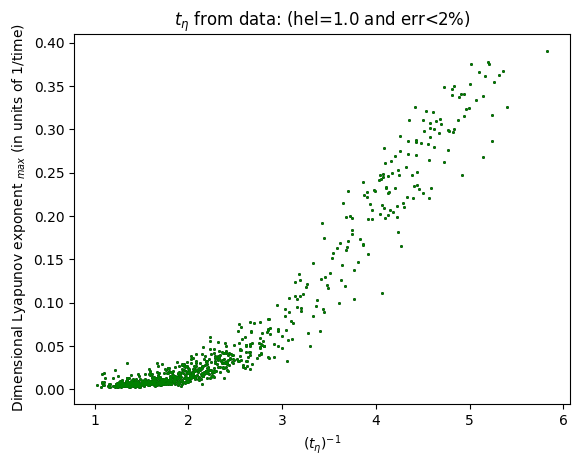

saved $t_\eta$ from data: (hel=1.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_t_etamax_from_data_heleq1p0_and_errlt2perc_with_color_None.png




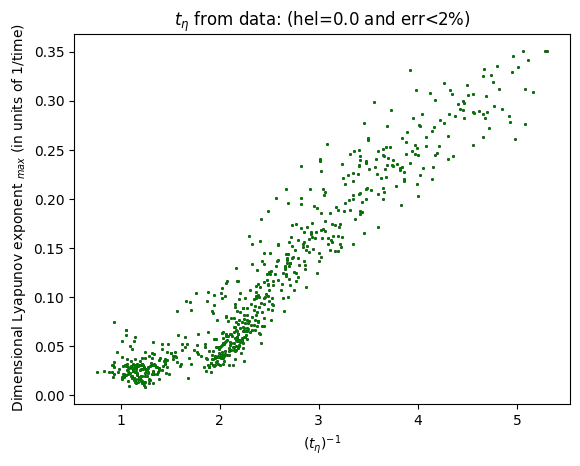

saved $t_\eta$ from data: (hel=0.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_t_etamax_from_data_heleq0p0_and_errlt2perc_with_color_None.png




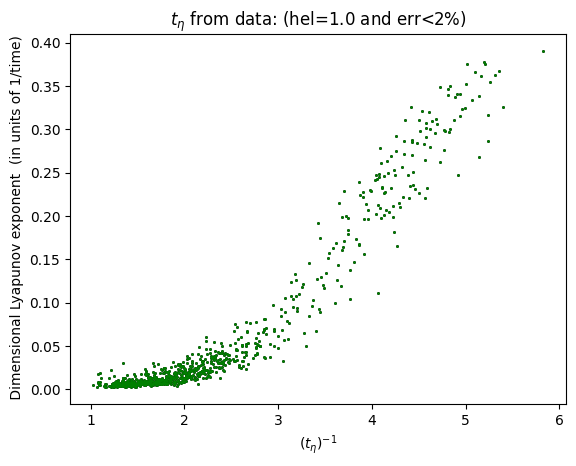

saved $t_\eta$ from data: (hel=1.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_t_eta_from_data_heleq1p0_and_errlt2perc_with_color_None.png




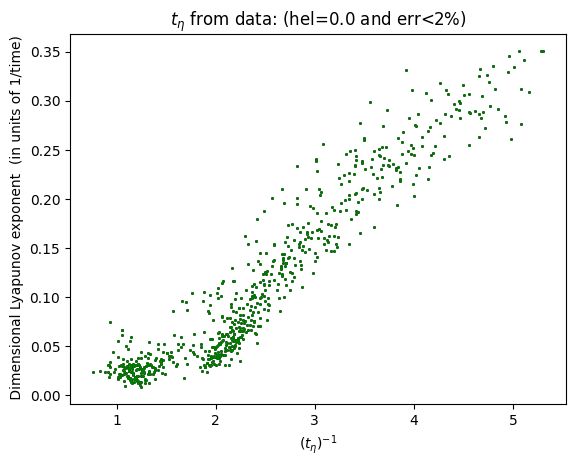

saved $t_\eta$ from data: (hel=0.0 and err<2%) to /home/julian/BAoffline/img/difftime_comp_t_eta_from_data_heleq0p0_and_errlt2perc_with_color_None.png




In [164]:
lyap_vs_kolmogorov(h1,lmb_mod="max")
lyap_vs_kolmogorov(h0,lmb_mod="max")
lyap_vs_kolmogorov(h1,lmb_mod="")
lyap_vs_kolmogorov(h0,lmb_mod="")

In [129]:
# diffusion timescale is also interesting
# diffusion has dimension cm^2 / s (check this)
# construct dependence on nu with the dimension


# a time from the helicity?

0.011844233542013412
0.03639247682754687


NameError: name 'sv' is not defined